In [1]:

from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
import pandas as pd
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
import numpy as np
import seaborn as sns
from keras.models import Sequential
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
from keras.layers import LSTM, GRU, SimpleRNN
from keras.callbacks import EarlyStopping
from keras import backend as K
from keras.layers import Bidirectional
from keras.models import Model
from keras.layers import LSTM, GRU, SimpleRNN,Flatten ,Input,Add, Concatenate,Reshape

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN
import glob
from datetime import datetime
from keras.layers import Dropout
#import pyemd
%matplotlib inline


Using TensorFlow backend.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.in

In [2]:
import glob

all_data = pd.DataFrame()
#path = 'C:\\Users\\kuruparans\\Documents\\ATM_CashFlow\\ATM_cashflow_prediction\\atm_data_m2.csv'
df=pd.read_csv('C:\\Users\\kuruparans\\Documents\\ATM_CashFlow\\ATM_cashflow_prediction\\atm_data_m2.csv')
#for f in glob.glob(path):
#    df = pd.read_excel(f, sheet_name=None, ignore_index=True, usecols=['windspd','month','day','hour'])
#    cdf = pd.concat(df.values())
#    all_data = all_data.append(cdf,ignore_index=True)
#print(all_data)
dataframe=df

In [3]:
month=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

In [4]:
dataframe['date_time']= dataframe['year']+(dataframe['month'])*12+(dataframe['day'])
dataframe=dataframe[['date_time','total_amount_withdrawn'] ]
dataframe=dataframe.dropna()

In [5]:

ODATA=dataframe['total_amount_withdrawn'].dropna()


In [6]:
len(ODATA)

2244

In [7]:
DATA = (ODATA-min(ODATA))/(max(ODATA)-min(ODATA));
minvalue = min(ODATA);
scalesize = max(ODATA)-min(ODATA);

windowsize = 24;
samplesize = 24;
totalsize = len(DATA)-samplesize;

trainsize = int(totalsize*3/4);
testsize = totalsize-trainsize;
    



In [8]:
print(minvalue,max(ODATA),scalesize)

100 1410700 1410600


In [9]:
#ODATA

In [10]:
#DATA

In [11]:
n=DATA

In [12]:
n=n.values

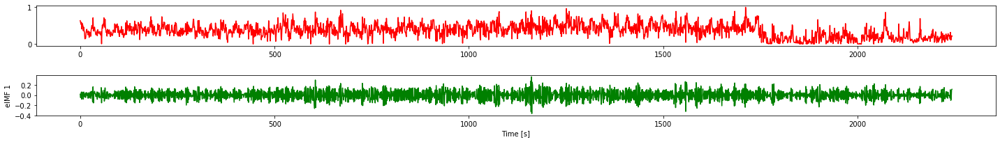

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:28: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


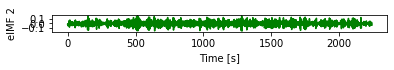

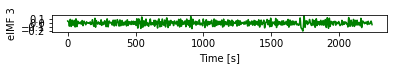

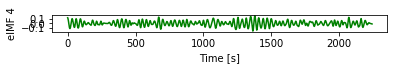

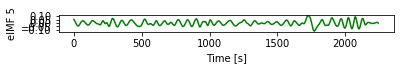

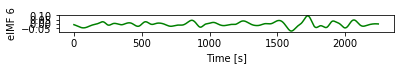

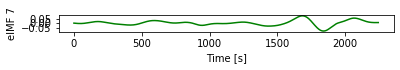

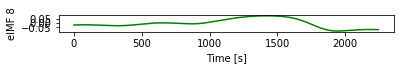

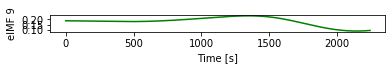

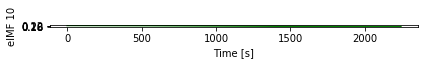

In [13]:
import numpy as np
from PyEMD import EMD,EEMD, CEEMDAN, Visualisation
import pylab as plt
t = np.arange(0, len(n), 1)

# Extract imfs and residue
# In case of EMD
eemd =  EEMD()
#eemd.emd(n,t)
#imfs, res = emd.get_imfs_and_residue()


emd = eemd.EMD
emd.extrema_detection="parabol"
# Execute EEMD on S
eIMFs = eemd.eemd(n, t)
nIMFs = eIMFs.shape[0]
# Plot results
plt.figure(figsize=(20,15))
plt.subplot(nIMFs+1, 1, 1)
plt.plot(t, n, 'r')
for n in range(nIMFs):
    plt.subplot(nIMFs+1, 1, n+2)
    plt.plot(t, eIMFs[n], 'g')
    plt.ylabel("eIMF %i" %(n+1))
    plt.locator_params(axis='y', nbins=5)
    plt.xlabel("Time [s]")
    plt.tight_layout()
    #plt.savefig('eemd_example', dpi=120)
    plt.show()

# In general:
#components = EEMD()(S)
#imfs, res = components[:-1], components[-1]

#vis = Visualisation()
#vis.plot_imfs(imfs=imfs, residue=res, t=t, include_residue=True)
#vis.plot_instant_freq(t, imfs=imfs)
#vis.show()
imfs=eIMFs 

In [15]:
dataframe['total_amount_withdrawn'].shape

(2244,)

In [16]:
imfs.shape

(10, 2244)

In [17]:
imfs[:,0]

array([ 0.01872366, -0.01287116,  0.05138975,  0.12517658,  0.05033127,
       -0.00701013,  0.00118588, -0.02261112,  0.18705197,  0.23157993])

In [18]:
#np.sum(imfs, axis = 0)


In [19]:
def scale(data): 
    max_d = max(data)
    min_d = min(data)
    scaled_data = (data-min_d)/(max_d-min_d)
    return np.array(scaled_data),max_d,min_d 

In [20]:
#imfs[len(imfs)-1]

In [21]:
scaled_data ,maxIMF,minIMF= scale(imfs[len(imfs)-1])

In [22]:
print(maxIMF,minIMF)

0.23157993027947715 0.14538015013939187


In [23]:
#scaled_data

In [24]:
def lstmmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)


W0809 15:54:27.718102 19800 deprecation_wrapper.py:119] From C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0809 15:54:27.749345 19800 deprecation_wrapper.py:119] From C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0809 15:54:27.764965 19800 deprecation_wrapper.py:119] From C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0809 15:54:28.203708 19800 deprecation_wrapper.py:119] From C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


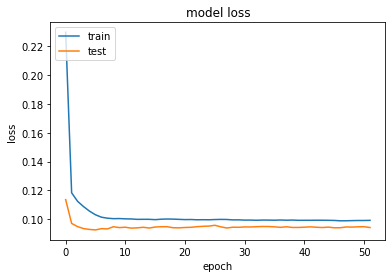

Root mean squared error Train: 0.127
Root mean squared error Test: 0.120


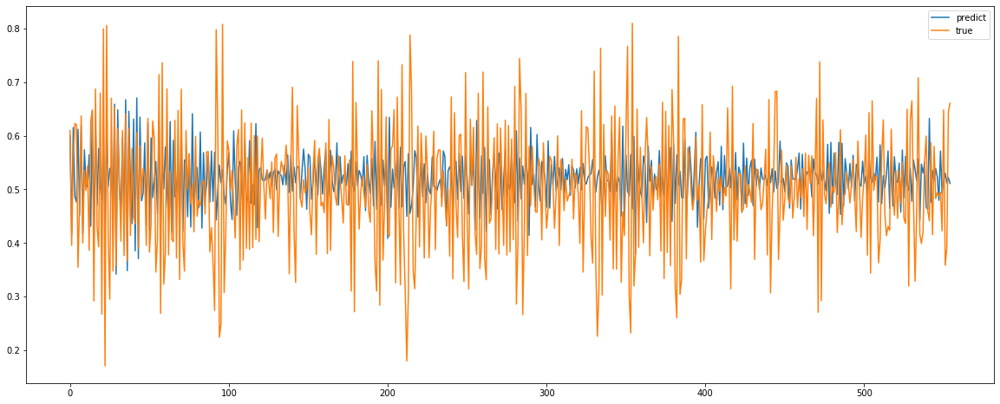

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


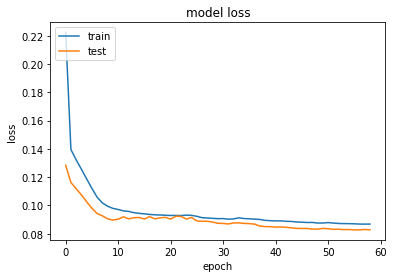

Root mean squared error Train: 0.117
Root mean squared error Test: 0.112


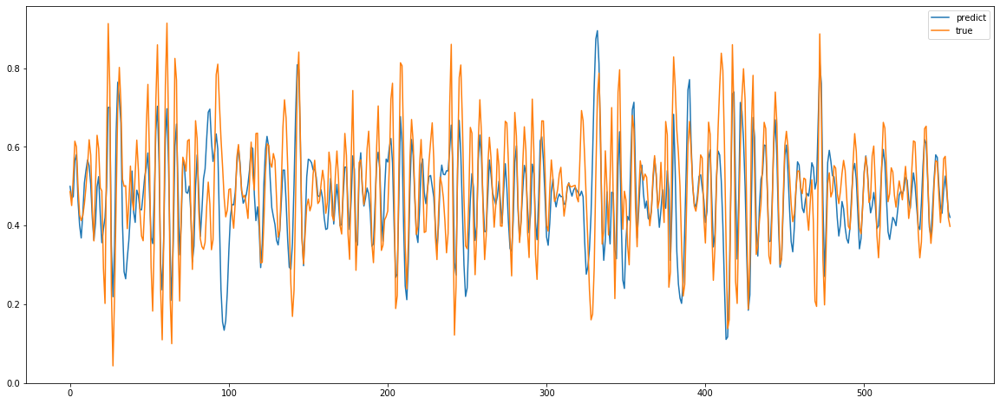

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


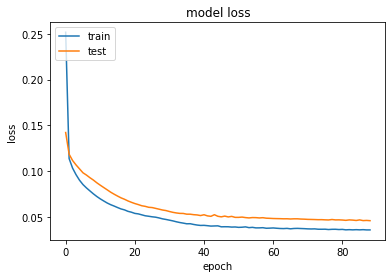

Root mean squared error Train: 0.044
Root mean squared error Test: 0.073


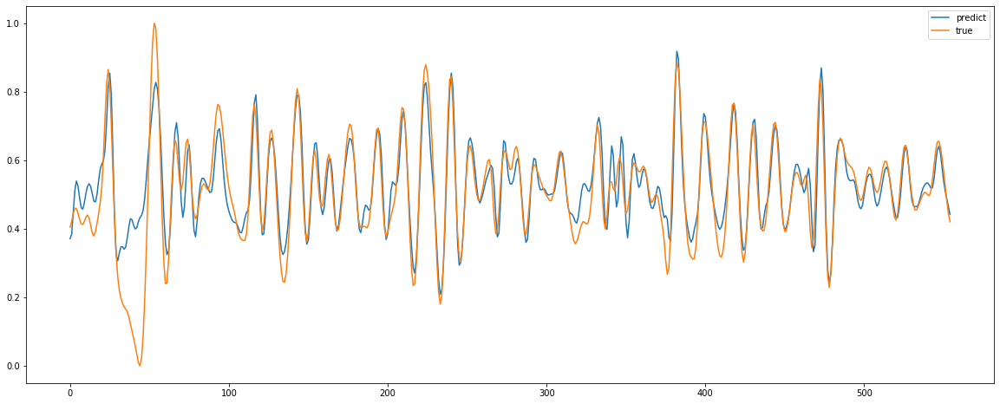

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


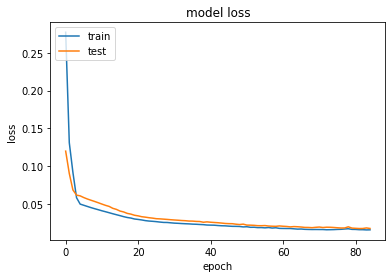

Root mean squared error Train: 0.019
Root mean squared error Test: 0.022


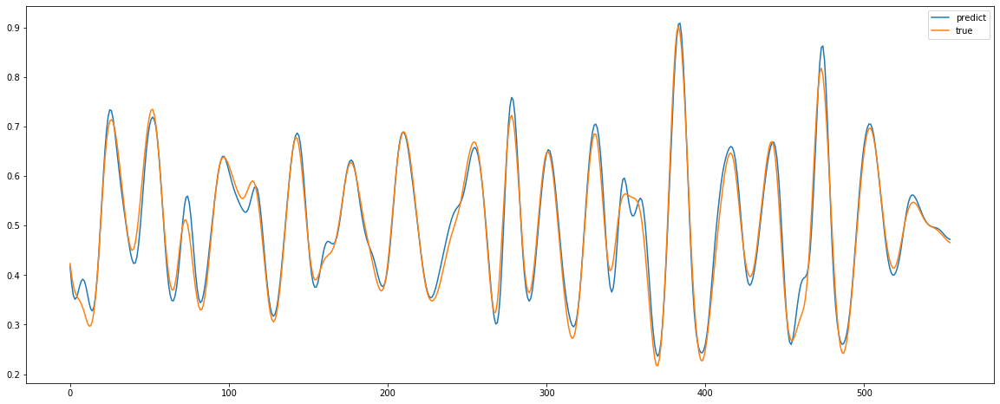

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


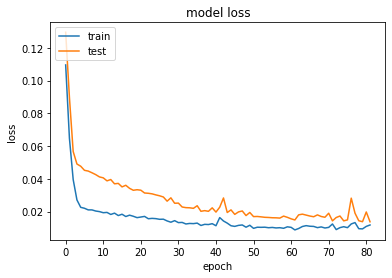

Root mean squared error Train: 0.012
Root mean squared error Test: 0.017


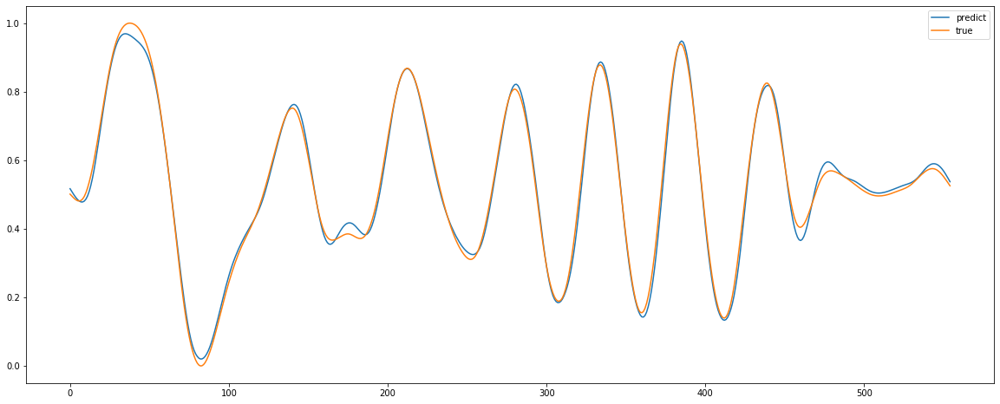

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


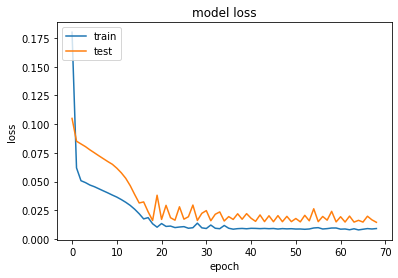

Root mean squared error Train: 0.010
Root mean squared error Test: 0.017


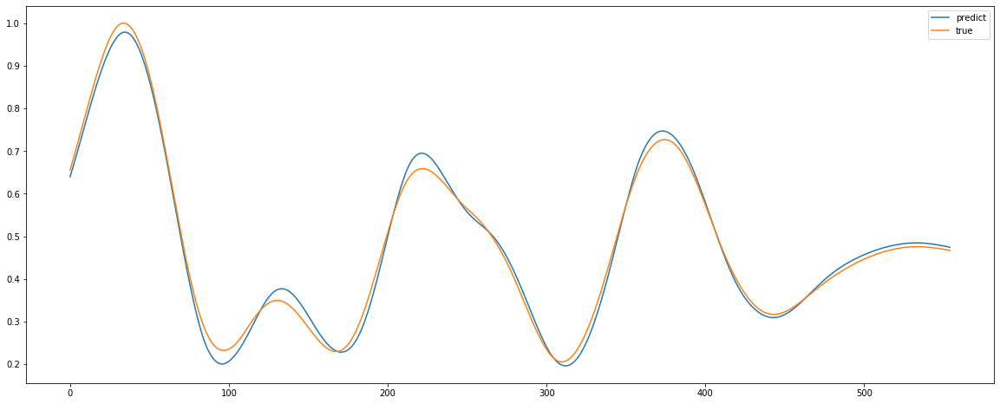

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


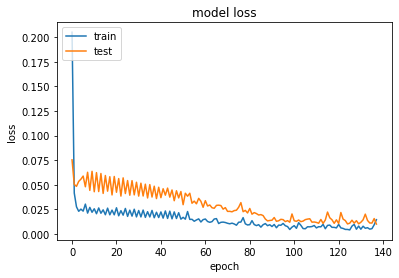

Root mean squared error Train: 0.005
Root mean squared error Test: 0.017


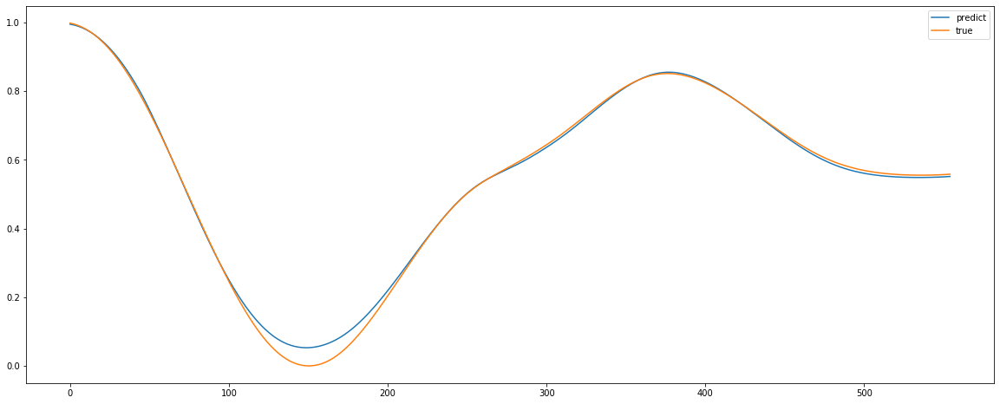

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


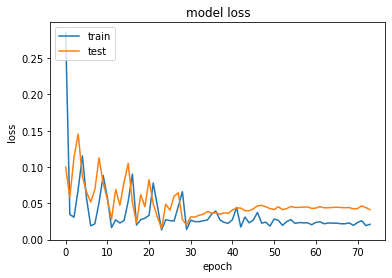

Root mean squared error Train: 0.041
Root mean squared error Test: 0.049


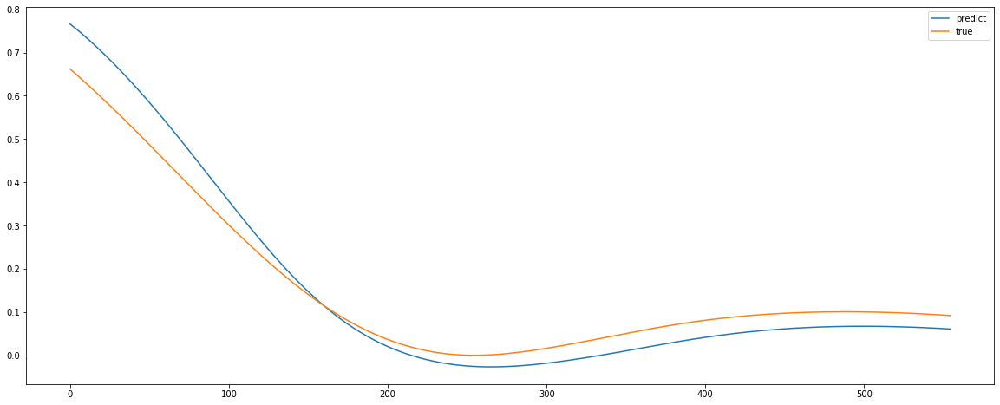

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


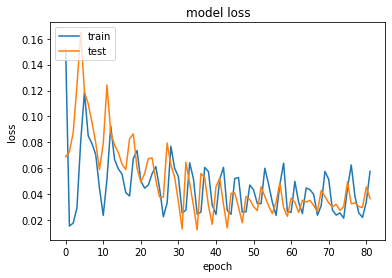

Root mean squared error Train: 0.066
Root mean squared error Test: 0.049


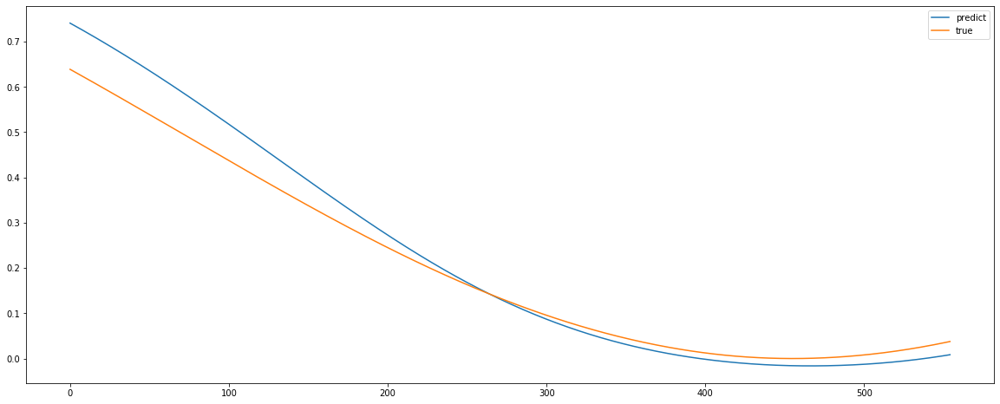

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 25        
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


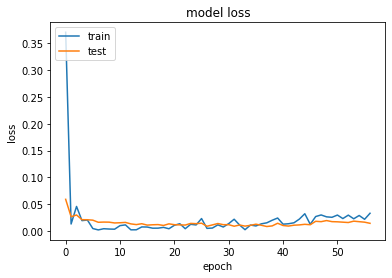

Root mean squared error Train: 0.036
Root mean squared error Test: 0.016


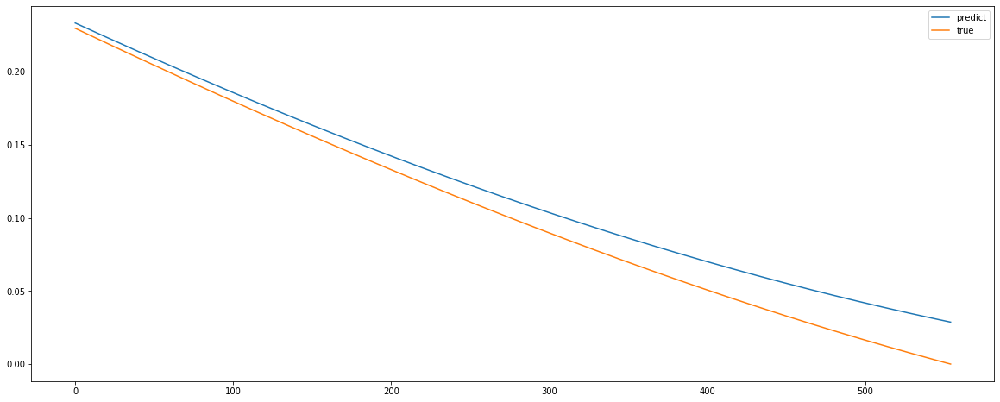

In [25]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(lstmmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

In [26]:
np.array(trainY_pr)[:,0][:,:].shape

(10, 1665, 1)

In [27]:
np.array(scaledIMF_X).shape

(2220, 24, 10)

In [28]:
#scaledIMF_X

In [29]:
np.array( testY_pr).shape

(10, 1, 555, 1)

In [30]:
#testY_pr

Variance : 0.652
Mean absolute error Train: 114532.096
Mean absolute error Test: 111556.743
Root mean squared error Train: 145433.004
Root mean squared error Test: 141895.709


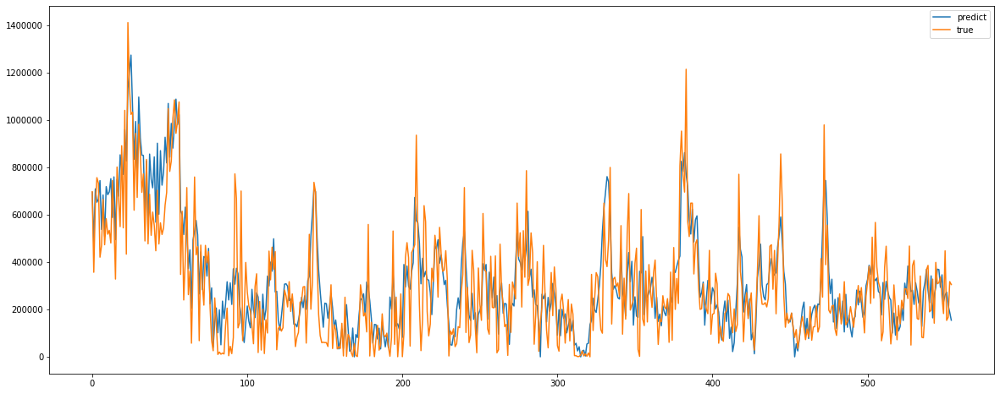

In [31]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [32]:
def rvflmodel(trainX,textX,trainY,testY):
    X_input = Input(shape=(trainX.shape[1], trainX.shape[2]))

    layer=Dense(24,init='glorot_uniform', input_shape=(trainX.shape[1], trainX.shape[2]))(X_input)
    layer.trainable=False

    #layer2=Dense(24,init='glorot_uniform')(layer)
    #layer2.trainable=True

    layer3=Dense(12,init='glorot_uniform')(layer)
    layer3.trainable=True
    res=Concatenate(axis=-1)([layer3,X_input])
    res.trainable=True
    #model.add(res)
    flat=Flatten()(res)
    layer4=Dense(1,init='glorot_uniform')(flat)
    layer4.trainable=True
    #model.add(layer4)
    model = Model(inputs=X_input, outputs=layer4)

    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)


C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_11 (Dense)                (None, 1, 24)        600         input_1[0][0]                    
__________________________________________________________________________________________________
dense_12 (Dense)                (None, 1, 12)        300         dense_11[0][0]                   
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 1, 36)        0           dense_12[0][0]                   
                                                                 input_1[0][0]                    
__________

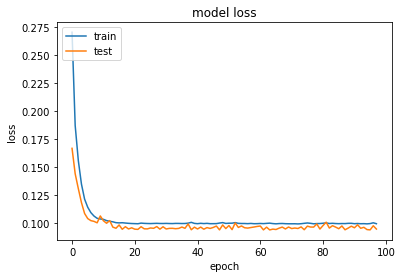

Root mean squared error Train: 0.126
Root mean squared error Test: 0.120


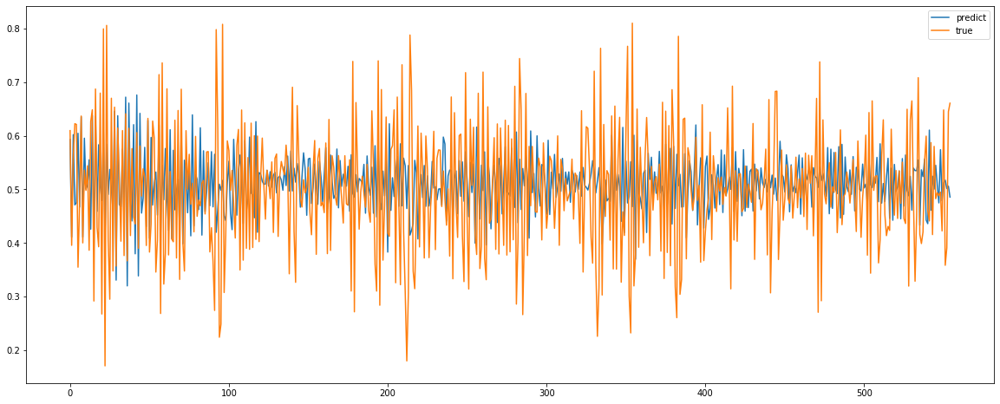

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_14 (Dense)                (None, 1, 24)        600         input_2[0][0]                    
__________________________________________________________________________________________________
dense_15 (Dense)                (None, 1, 12)        300         dense_14[0][0]                   
__________________________________________________________________________________________________
concatenate_2 (Concatenate)     (None, 1, 36)        0           dense_15[0][0]                   
                                                                 input_2[0][0]                    
__________

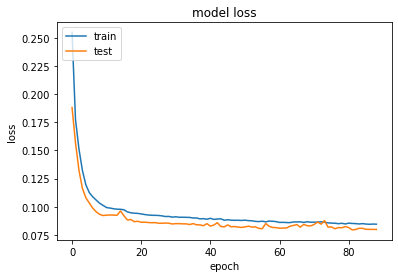

Root mean squared error Train: 0.115
Root mean squared error Test: 0.108


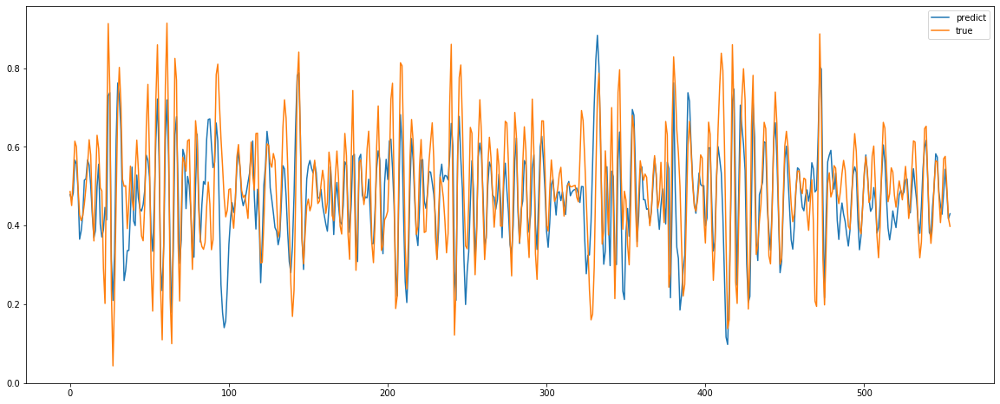

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 1, 24)        600         input_3[0][0]                    
__________________________________________________________________________________________________
dense_18 (Dense)                (None, 1, 12)        300         dense_17[0][0]                   
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 1, 36)        0           dense_18[0][0]                   
                                                                 input_3[0][0]                    
__________

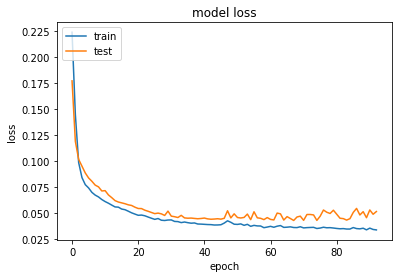

Root mean squared error Train: 0.049
Root mean squared error Test: 0.075


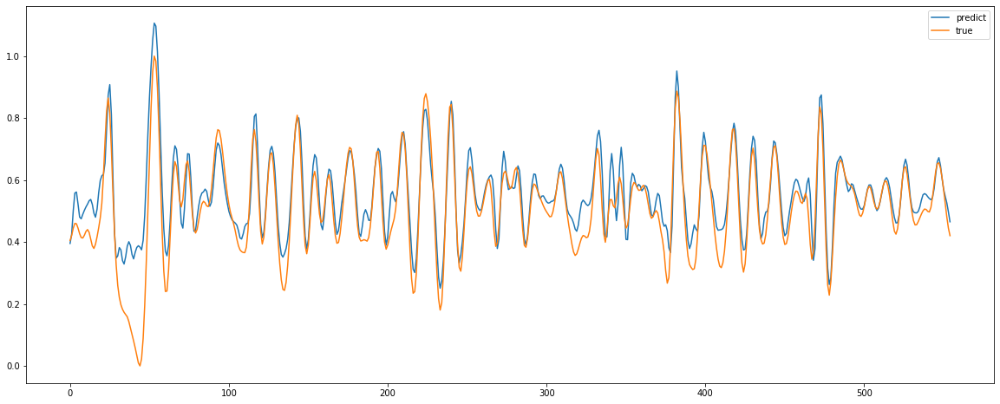

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_20 (Dense)                (None, 1, 24)        600         input_4[0][0]                    
__________________________________________________________________________________________________
dense_21 (Dense)                (None, 1, 12)        300         dense_20[0][0]                   
__________________________________________________________________________________________________
concatenate_4 (Concatenate)     (None, 1, 36)        0           dense_21[0][0]                   
                                                                 input_4[0][0]                    
__________

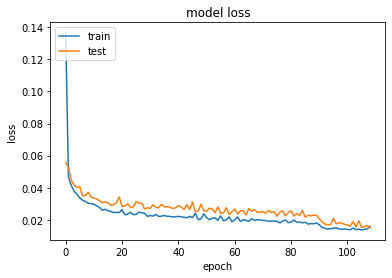

Root mean squared error Train: 0.016
Root mean squared error Test: 0.019


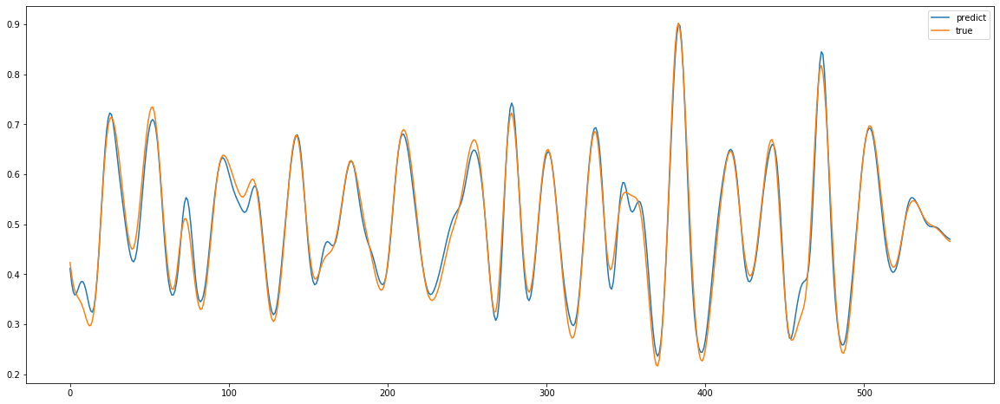

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_23 (Dense)                (None, 1, 24)        600         input_5[0][0]                    
__________________________________________________________________________________________________
dense_24 (Dense)                (None, 1, 12)        300         dense_23[0][0]                   
__________________________________________________________________________________________________
concatenate_5 (Concatenate)     (None, 1, 36)        0           dense_24[0][0]                   
                                                                 input_5[0][0]                    
__________

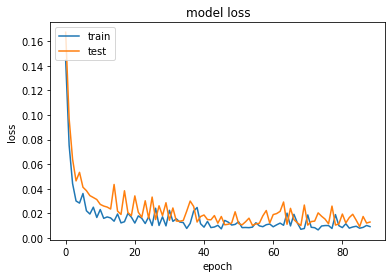

Root mean squared error Train: 0.009
Root mean squared error Test: 0.016


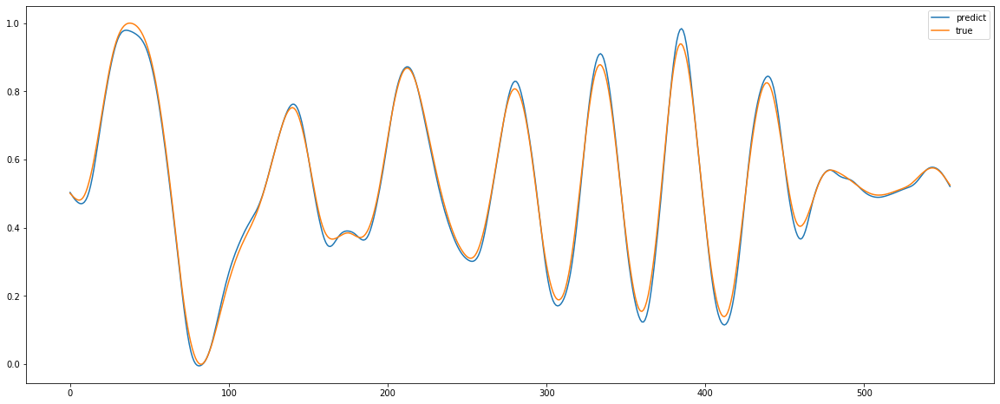

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_26 (Dense)                (None, 1, 24)        600         input_6[0][0]                    
__________________________________________________________________________________________________
dense_27 (Dense)                (None, 1, 12)        300         dense_26[0][0]                   
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 1, 36)        0           dense_27[0][0]                   
                                                                 input_6[0][0]                    
__________

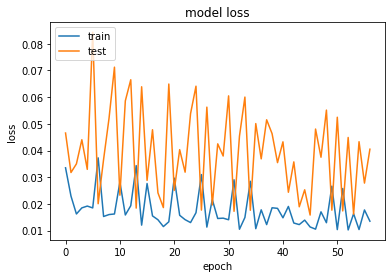

Root mean squared error Train: 0.039
Root mean squared error Test: 0.044


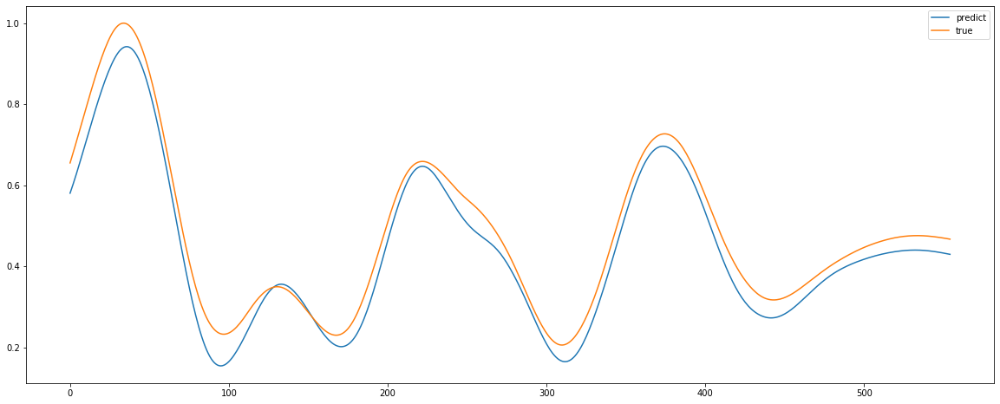

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_29 (Dense)                (None, 1, 24)        600         input_7[0][0]                    
__________________________________________________________________________________________________
dense_30 (Dense)                (None, 1, 12)        300         dense_29[0][0]                   
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 1, 36)        0           dense_30[0][0]                   
                                                                 input_7[0][0]                    
__________

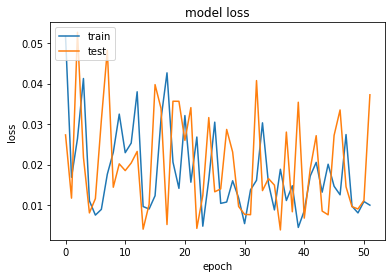

Root mean squared error Train: 0.034
Root mean squared error Test: 0.040


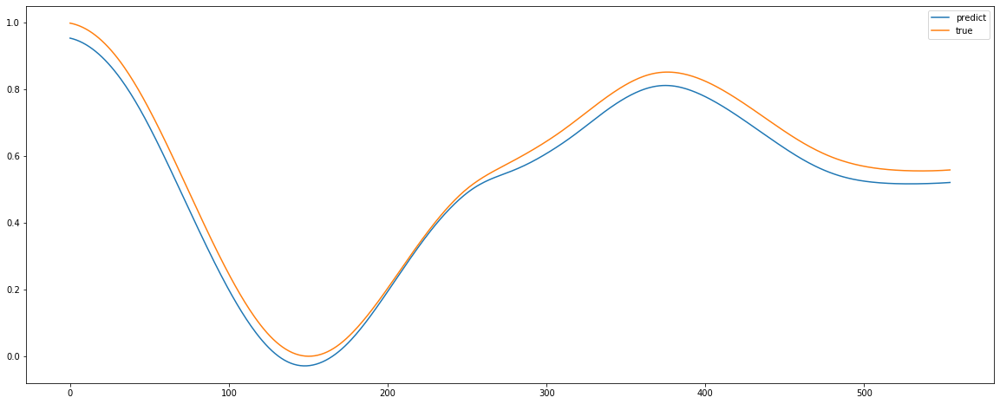

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_32 (Dense)                (None, 1, 24)        600         input_8[0][0]                    
__________________________________________________________________________________________________
dense_33 (Dense)                (None, 1, 12)        300         dense_32[0][0]                   
__________________________________________________________________________________________________
concatenate_8 (Concatenate)     (None, 1, 36)        0           dense_33[0][0]                   
                                                                 input_8[0][0]                    
__________

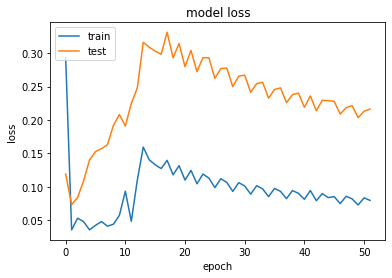

Root mean squared error Train: 0.131
Root mean squared error Test: 0.218


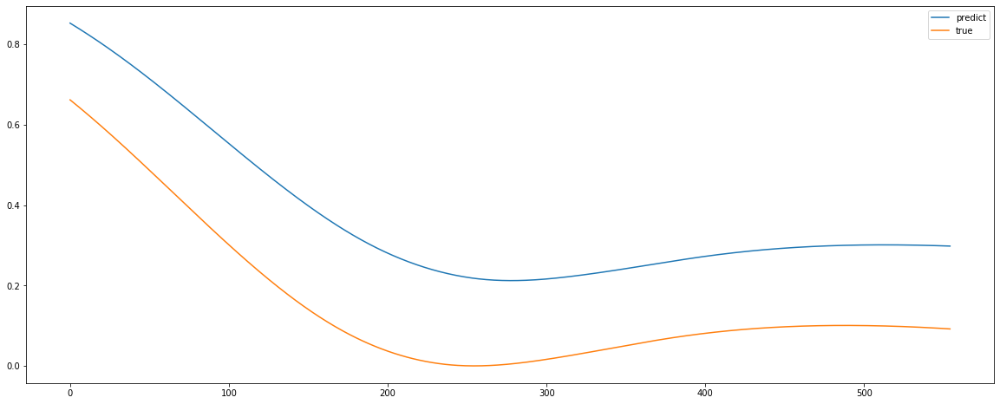

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_35 (Dense)                (None, 1, 24)        600         input_9[0][0]                    
__________________________________________________________________________________________________
dense_36 (Dense)                (None, 1, 12)        300         dense_35[0][0]                   
__________________________________________________________________________________________________
concatenate_9 (Concatenate)     (None, 1, 36)        0           dense_36[0][0]                   
                                                                 input_9[0][0]                    
__________

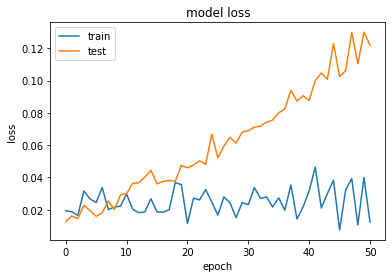

Root mean squared error Train: 0.096
Root mean squared error Test: 0.132


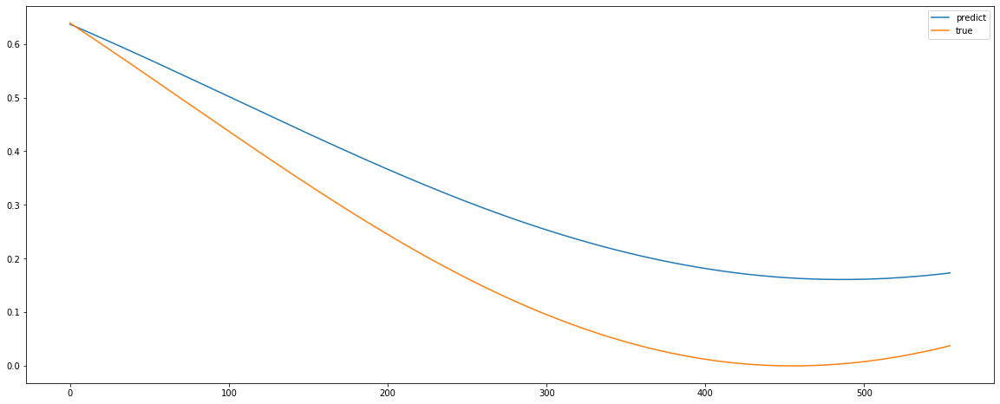

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # Remove the CWD from sys.path while we load stuff.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`
  app.launch_new_instance()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_38 (Dense)                (None, 1, 24)        600         input_10[0][0]                   
__________________________________________________________________________________________________
dense_39 (Dense)                (None, 1, 12)        300         dense_38[0][0]                   
__________________________________________________________________________________________________
concatenate_10 (Concatenate)    (None, 1, 36)        0           dense_39[0][0]                   
                                                                 input_10[0][0]                   
__________

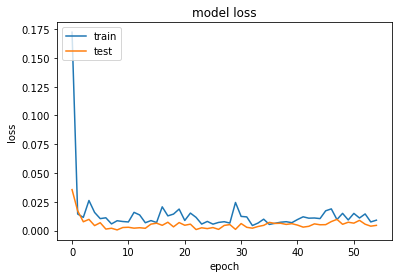

Root mean squared error Train: 0.003
Root mean squared error Test: 0.005


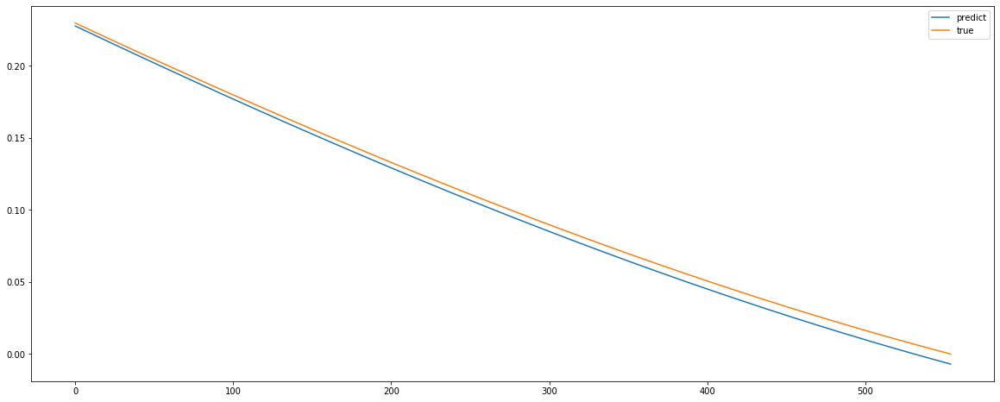

Variance : 0.572
Mean absolute error Train: 112192.277
Mean absolute error Test: 126011.649
Root mean squared error Train: 143578.664
Root mean squared error Test: 157320.652


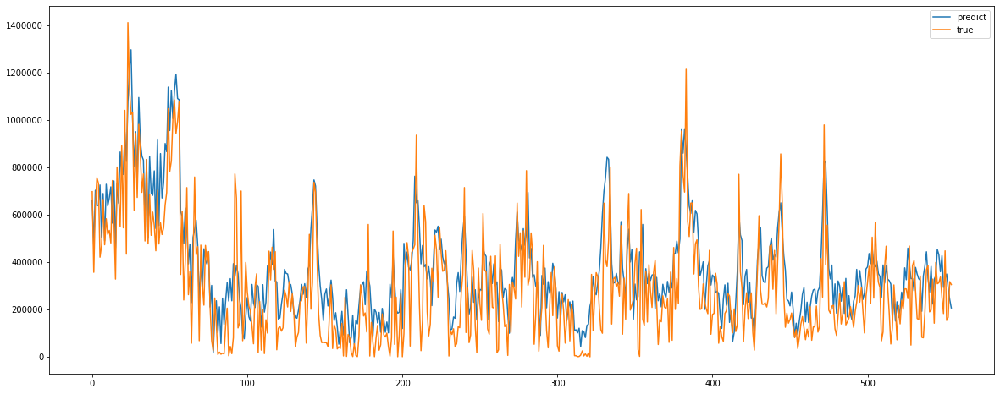

In [33]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(rvflmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [34]:
np.array(x_data).shape

(555,)

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_41 (Dense)                (None, 1, 24)        600         input_11[0][0]                   
__________________________________________________________________________________________________
dense_42 (Dense)                (None, 1, 12)        300         dense_41[0][0]                   
__________________________________________________________________________________________________
concatenate_11 (Concatenate)    (None, 1, 36)        0           dense_42[0][0]                   
                                                                 input_11[0][0]                   
__________

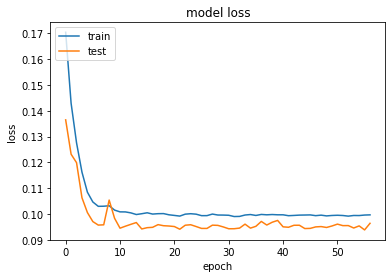

Root mean squared error Train: 0.129
Root mean squared error Test: 0.122


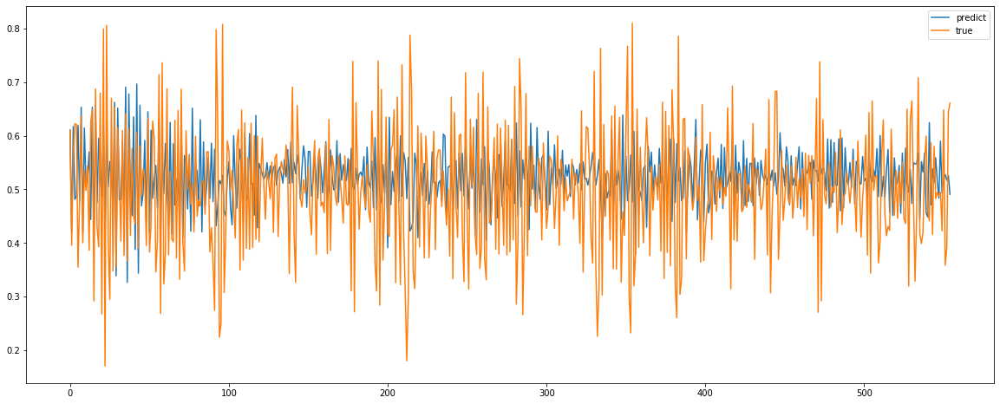

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_45 (Dense)                (None, 1, 24)        600         input_12[0][0]                   
__________________________________________________________________________________________________
dense_46 (Dense)                (None, 1, 12)        300         dense_45[0][0]                   
__________________________________________________________________________________________________
concatenate_13 (Concatenate)    (None, 1, 36)        0           dense_46[0][0]                   
                                                                 input_12[0][0]                   
__________

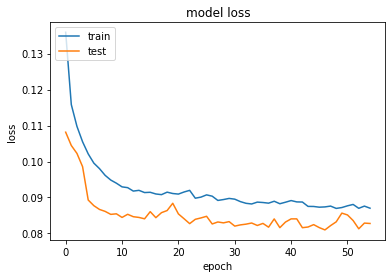

Root mean squared error Train: 0.117
Root mean squared error Test: 0.112


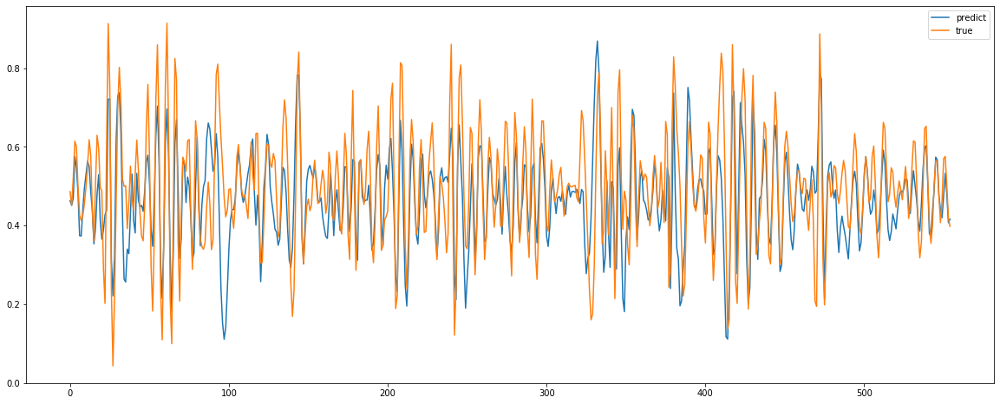

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_49 (Dense)                (None, 1, 24)        600         input_13[0][0]                   
__________________________________________________________________________________________________
dense_50 (Dense)                (None, 1, 12)        300         dense_49[0][0]                   
__________________________________________________________________________________________________
concatenate_15 (Concatenate)    (None, 1, 36)        0           dense_50[0][0]                   
                                                                 input_13[0][0]                   
__________

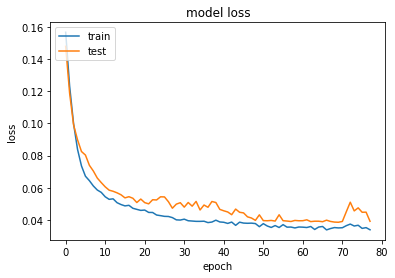

Root mean squared error Train: 0.038
Root mean squared error Test: 0.062


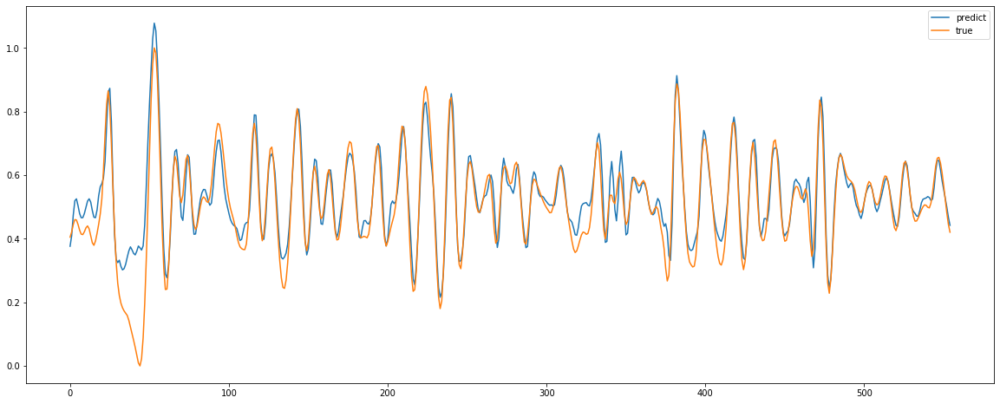

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_53 (Dense)                (None, 1, 24)        600         input_14[0][0]                   
__________________________________________________________________________________________________
dense_54 (Dense)                (None, 1, 12)        300         dense_53[0][0]                   
__________________________________________________________________________________________________
concatenate_17 (Concatenate)    (None, 1, 36)        0           dense_54[0][0]                   
                                                                 input_14[0][0]                   
__________

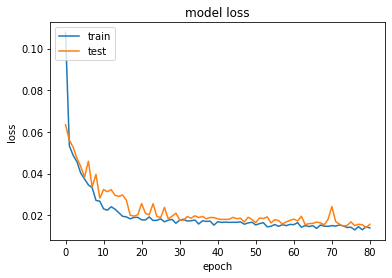

Root mean squared error Train: 0.017
Root mean squared error Test: 0.020


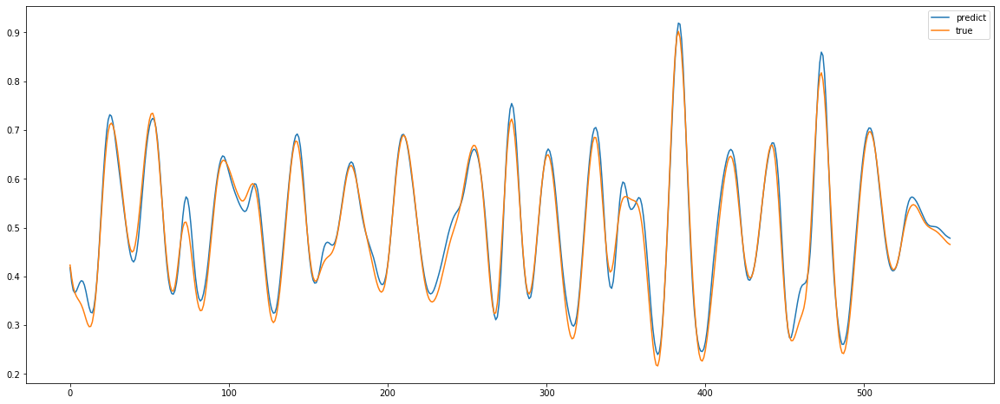

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_57 (Dense)                (None, 1, 24)        600         input_15[0][0]                   
__________________________________________________________________________________________________
dense_58 (Dense)                (None, 1, 12)        300         dense_57[0][0]                   
__________________________________________________________________________________________________
concatenate_19 (Concatenate)    (None, 1, 36)        0           dense_58[0][0]                   
                                                                 input_15[0][0]                   
__________

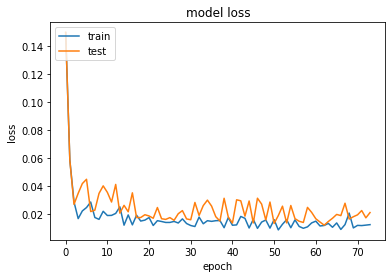

Root mean squared error Train: 0.022
Root mean squared error Test: 0.024


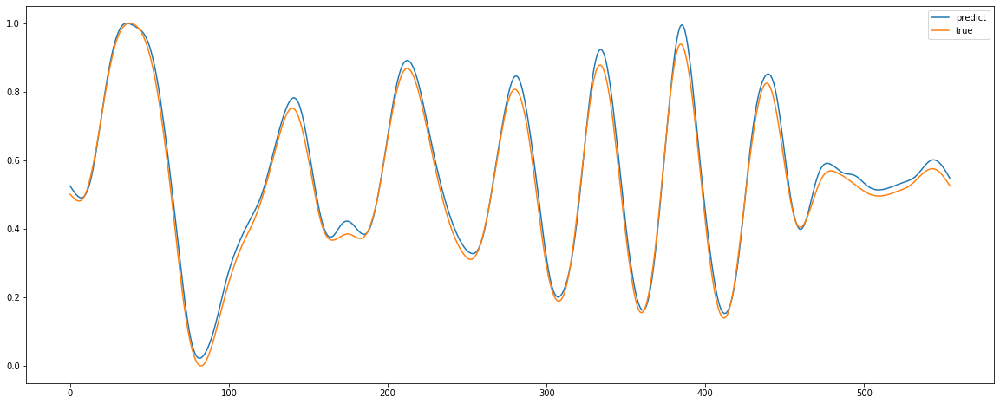

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_61 (Dense)                (None, 1, 24)        600         input_16[0][0]                   
__________________________________________________________________________________________________
dense_62 (Dense)                (None, 1, 12)        300         dense_61[0][0]                   
__________________________________________________________________________________________________
concatenate_21 (Concatenate)    (None, 1, 36)        0           dense_62[0][0]                   
                                                                 input_16[0][0]                   
__________

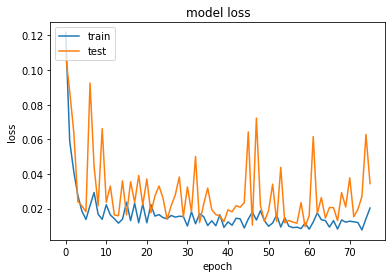

Root mean squared error Train: 0.033
Root mean squared error Test: 0.038


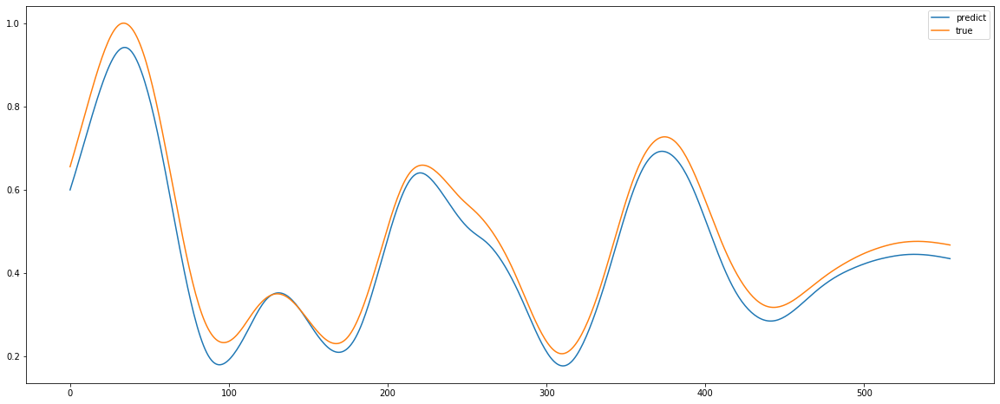

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_65 (Dense)                (None, 1, 24)        600         input_17[0][0]                   
__________________________________________________________________________________________________
dense_66 (Dense)                (None, 1, 12)        300         dense_65[0][0]                   
__________________________________________________________________________________________________
concatenate_23 (Concatenate)    (None, 1, 36)        0           dense_66[0][0]                   
                                                                 input_17[0][0]                   
__________

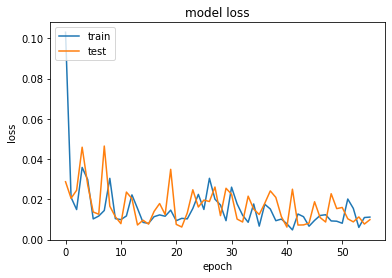

Root mean squared error Train: 0.010
Root mean squared error Test: 0.013


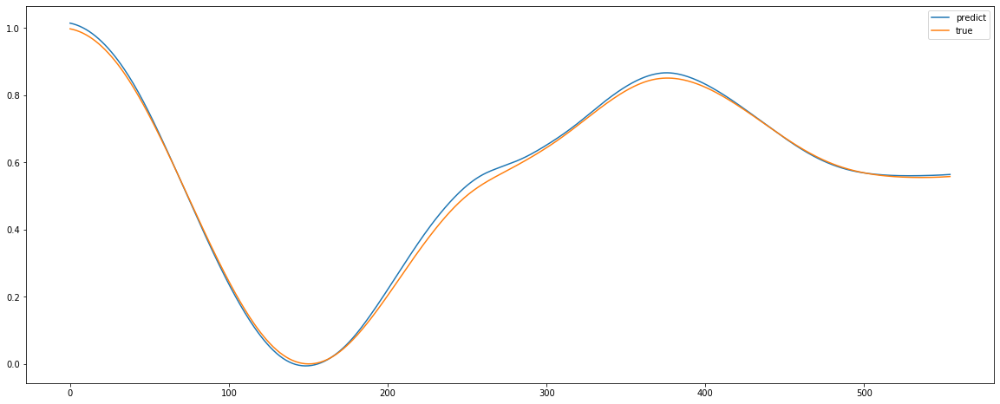

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_69 (Dense)                (None, 1, 24)        600         input_18[0][0]                   
__________________________________________________________________________________________________
dense_70 (Dense)                (None, 1, 12)        300         dense_69[0][0]                   
__________________________________________________________________________________________________
concatenate_25 (Concatenate)    (None, 1, 36)        0           dense_70[0][0]                   
                                                                 input_18[0][0]                   
__________

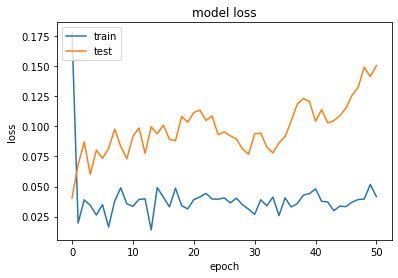

Root mean squared error Train: 0.067
Root mean squared error Test: 0.159


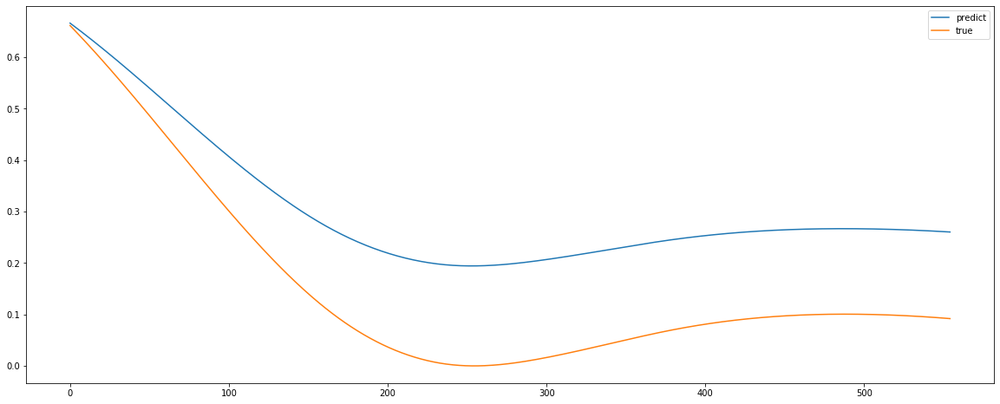

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_73 (Dense)                (None, 1, 24)        600         input_19[0][0]                   
__________________________________________________________________________________________________
dense_74 (Dense)                (None, 1, 12)        300         dense_73[0][0]                   
__________________________________________________________________________________________________
concatenate_27 (Concatenate)    (None, 1, 36)        0           dense_74[0][0]                   
                                                                 input_19[0][0]                   
__________

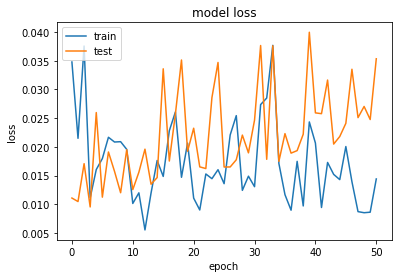

Root mean squared error Train: 0.008
Root mean squared error Test: 0.036


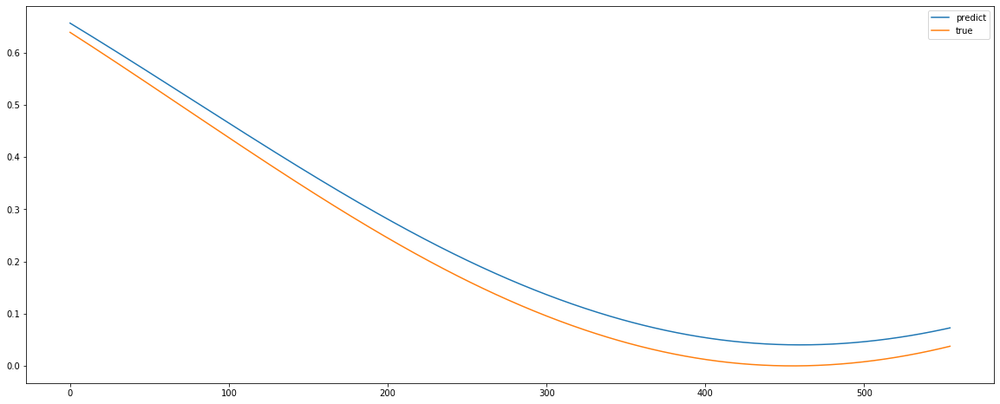

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_77 (Dense)                (None, 1, 24)        600         input_20[0][0]                   
__________________________________________________________________________________________________
dense_78 (Dense)                (None, 1, 12)        300         dense_77[0][0]                   
__________________________________________________________________________________________________
concatenate_29 (Concatenate)    (None, 1, 36)        0           dense_78[0][0]                   
                                                                 input_20[0][0]                   
__________

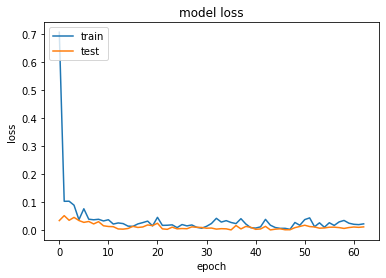

Root mean squared error Train: 0.053
Root mean squared error Test: 0.014


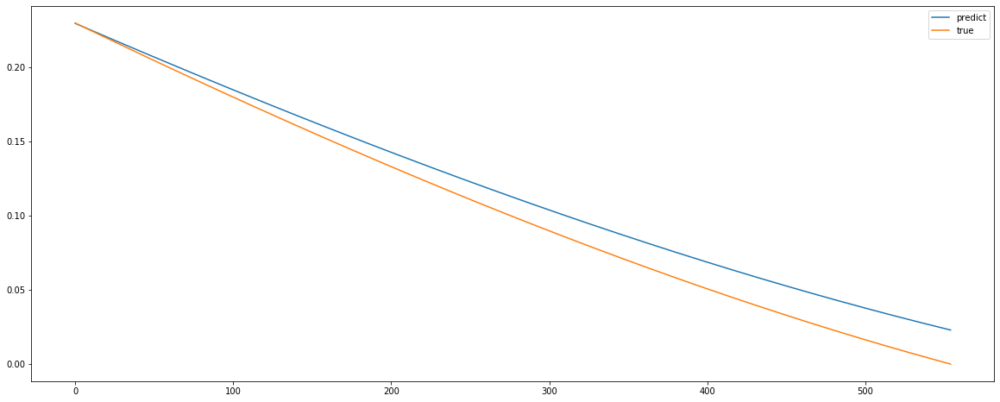

Variance : 0.591
Mean absolute error Train: 112803.912
Mean absolute error Test: 121830.976
Root mean squared error Train: 144120.865
Root mean squared error Test: 153769.830


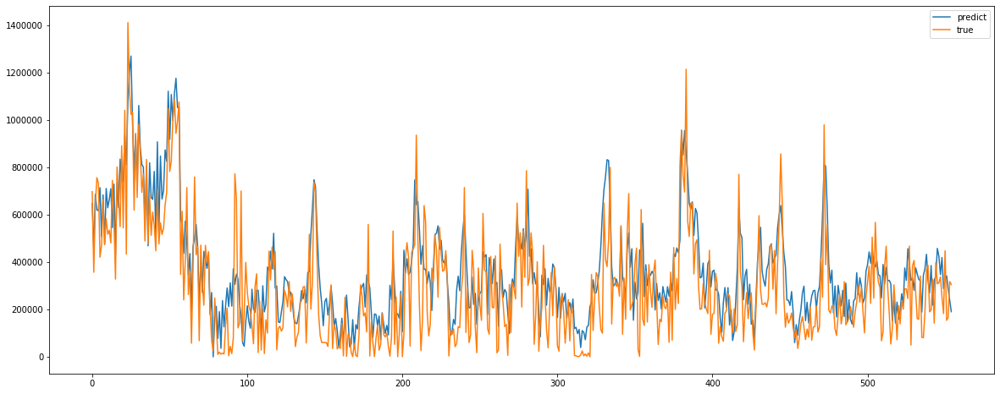

In [35]:
def d_res_rvflmodel(trainX,textX,trainY,testY):
    X_input = Input(shape=(trainX.shape[1], trainX.shape[2]))

    layer=Dense(24,init='glorot_uniform', input_shape=(trainX.shape[1], trainX.shape[2]))(X_input)
    layer.trainable=False

    layer2=Dense(12,init='glorot_uniform')(layer)
    layer2.trainable=True
    res0=Concatenate(axis=-1)([layer2,X_input])
    res0.trainable=True
    layer3=Dense(12,init='glorot_uniform')(res0)
    layer3.trainable=True
    res=Concatenate(axis=-1)([layer3,X_input])
    res.trainable=True
    #model.add(res)
    flat=Flatten()(res)
    layer4=Dense(1,init='glorot_uniform')(flat)
    layer4.trainable=True
    #model.add(layer4)
    model = Model(inputs=X_input, outputs=layer4)

    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(d_res_rvflmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_81 (Dense)                (None, 1, 24)        600         input_21[0][0]                   
__________________________________________________________________________________________________
dense_82 (Dense)                (None, 1, 12)        300         dense_81[0][0]                   
__________________________________________________________________________________________________
dense_83 (Dense)                (None, 1, 12)        156         dense_82[0][0]                   
__________________________________________________________________________________________________
concatenat

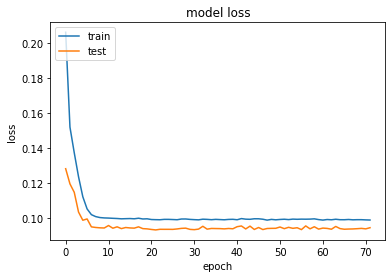

Root mean squared error Train: 0.127
Root mean squared error Test: 0.120


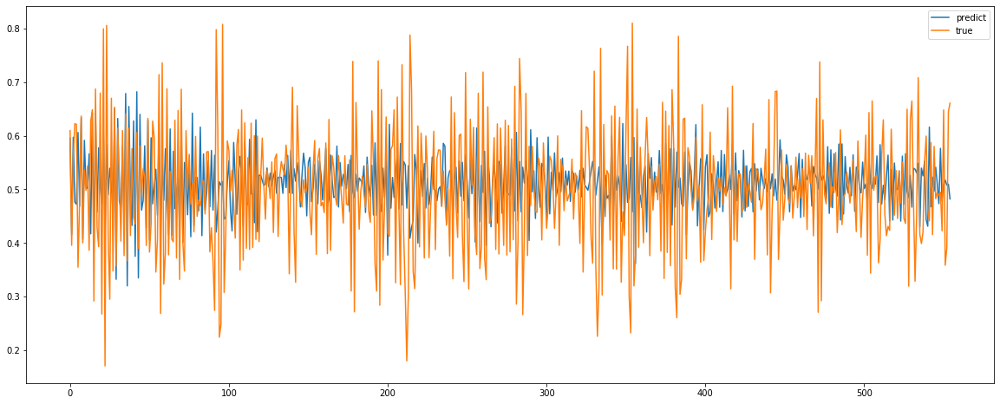

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_85 (Dense)                (None, 1, 24)        600         input_22[0][0]                   
__________________________________________________________________________________________________
dense_86 (Dense)                (None, 1, 12)        300         dense_85[0][0]                   
__________________________________________________________________________________________________
dense_87 (Dense)                (None, 1, 12)        156         dense_86[0][0]                   
__________________________________________________________________________________________________
concatenat

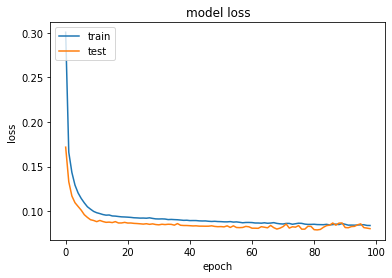

Root mean squared error Train: 0.115
Root mean squared error Test: 0.108


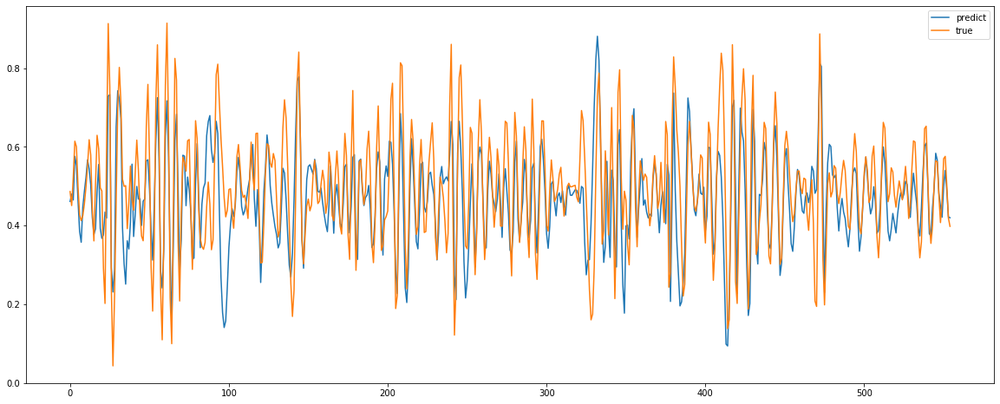

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_89 (Dense)                (None, 1, 24)        600         input_23[0][0]                   
__________________________________________________________________________________________________
dense_90 (Dense)                (None, 1, 12)        300         dense_89[0][0]                   
__________________________________________________________________________________________________
dense_91 (Dense)                (None, 1, 12)        156         dense_90[0][0]                   
__________________________________________________________________________________________________
concatenat

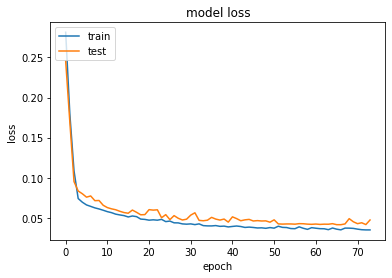

Root mean squared error Train: 0.045
Root mean squared error Test: 0.072


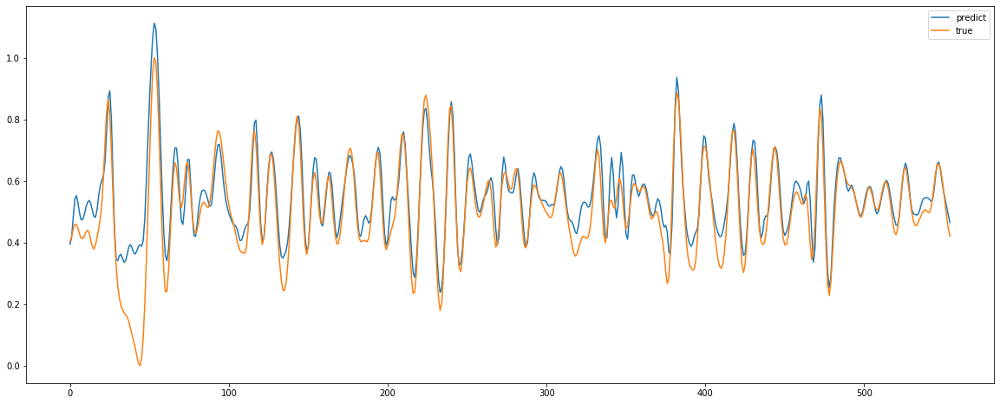

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_93 (Dense)                (None, 1, 24)        600         input_24[0][0]                   
__________________________________________________________________________________________________
dense_94 (Dense)                (None, 1, 12)        300         dense_93[0][0]                   
__________________________________________________________________________________________________
dense_95 (Dense)                (None, 1, 12)        156         dense_94[0][0]                   
__________________________________________________________________________________________________
concatenat

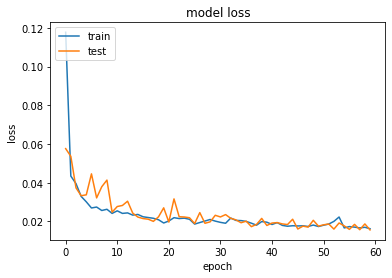

Root mean squared error Train: 0.017
Root mean squared error Test: 0.020


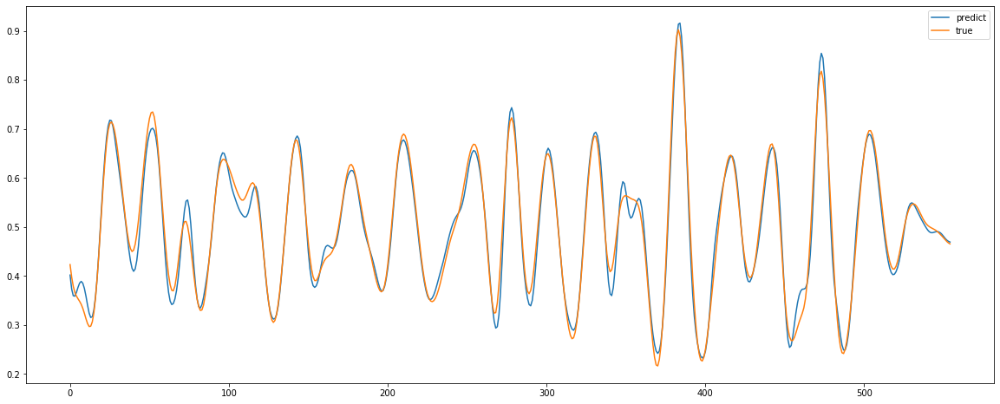

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_97 (Dense)                (None, 1, 24)        600         input_25[0][0]                   
__________________________________________________________________________________________________
dense_98 (Dense)                (None, 1, 12)        300         dense_97[0][0]                   
__________________________________________________________________________________________________
dense_99 (Dense)                (None, 1, 12)        156         dense_98[0][0]                   
__________________________________________________________________________________________________
concatenat

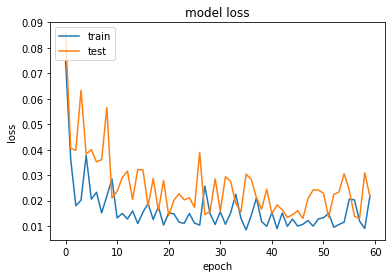

Root mean squared error Train: 0.021
Root mean squared error Test: 0.025


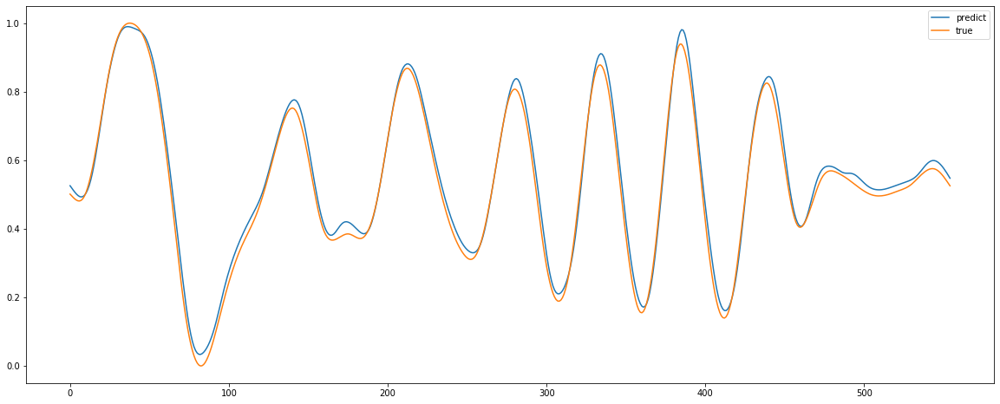

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_101 (Dense)               (None, 1, 24)        600         input_26[0][0]                   
__________________________________________________________________________________________________
dense_102 (Dense)               (None, 1, 12)        300         dense_101[0][0]                  
__________________________________________________________________________________________________
dense_103 (Dense)               (None, 1, 12)        156         dense_102[0][0]                  
__________________________________________________________________________________________________
concatenat

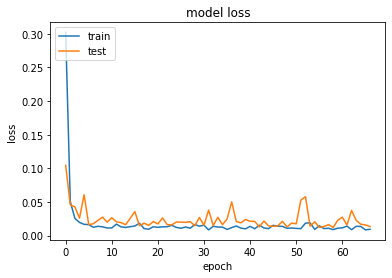

Root mean squared error Train: 0.013
Root mean squared error Test: 0.017


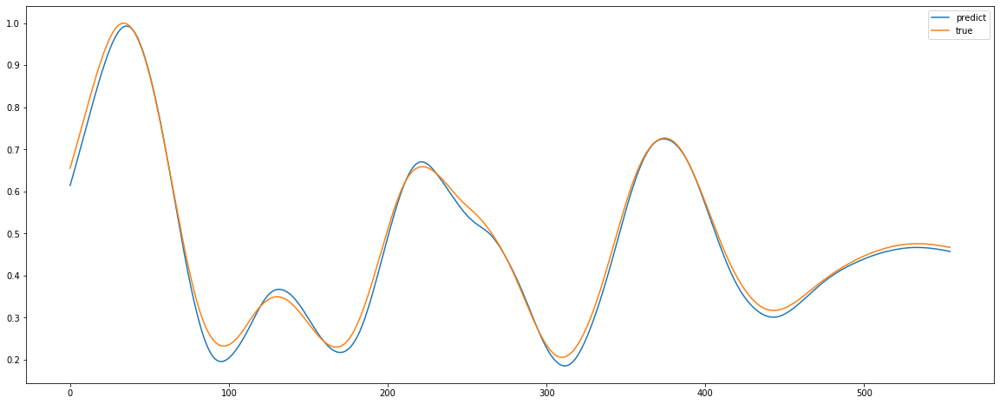

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_105 (Dense)               (None, 1, 24)        600         input_27[0][0]                   
__________________________________________________________________________________________________
dense_106 (Dense)               (None, 1, 12)        300         dense_105[0][0]                  
__________________________________________________________________________________________________
dense_107 (Dense)               (None, 1, 12)        156         dense_106[0][0]                  
__________________________________________________________________________________________________
concatenat

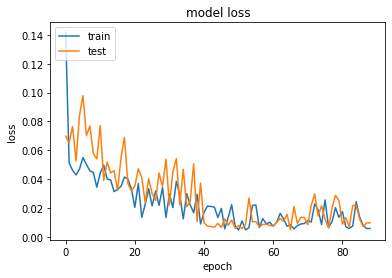

Root mean squared error Train: 0.012
Root mean squared error Test: 0.012


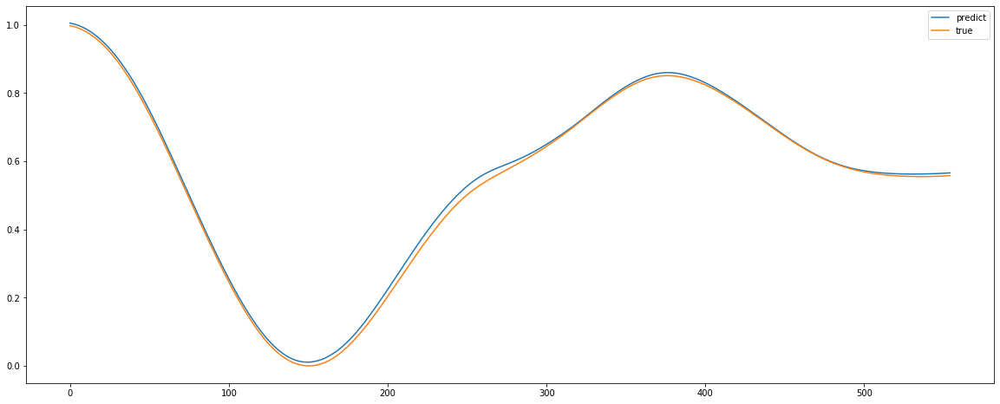

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_109 (Dense)               (None, 1, 24)        600         input_28[0][0]                   
__________________________________________________________________________________________________
dense_110 (Dense)               (None, 1, 12)        300         dense_109[0][0]                  
__________________________________________________________________________________________________
dense_111 (Dense)               (None, 1, 12)        156         dense_110[0][0]                  
__________________________________________________________________________________________________
concatenat

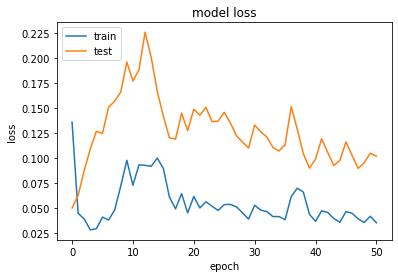

Root mean squared error Train: 0.039
Root mean squared error Test: 0.104


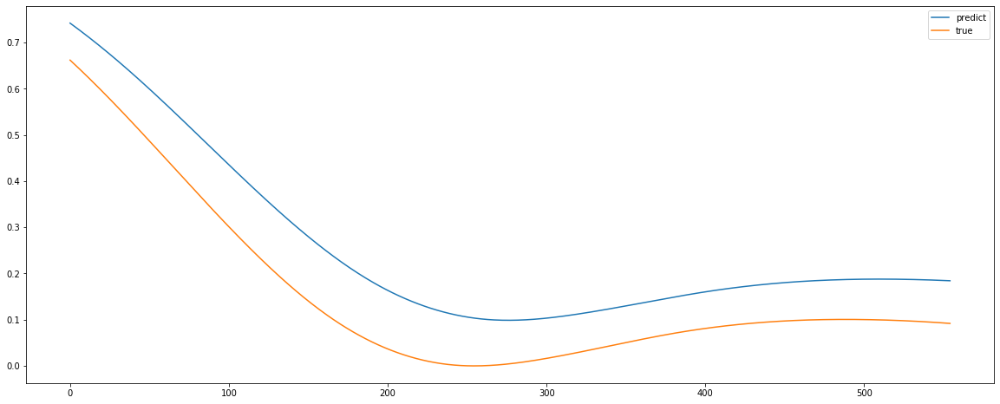

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_113 (Dense)               (None, 1, 24)        600         input_29[0][0]                   
__________________________________________________________________________________________________
dense_114 (Dense)               (None, 1, 12)        300         dense_113[0][0]                  
__________________________________________________________________________________________________
dense_115 (Dense)               (None, 1, 12)        156         dense_114[0][0]                  
__________________________________________________________________________________________________
concatenat

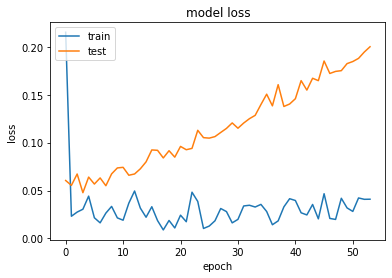

Root mean squared error Train: 0.133
Root mean squared error Test: 0.223


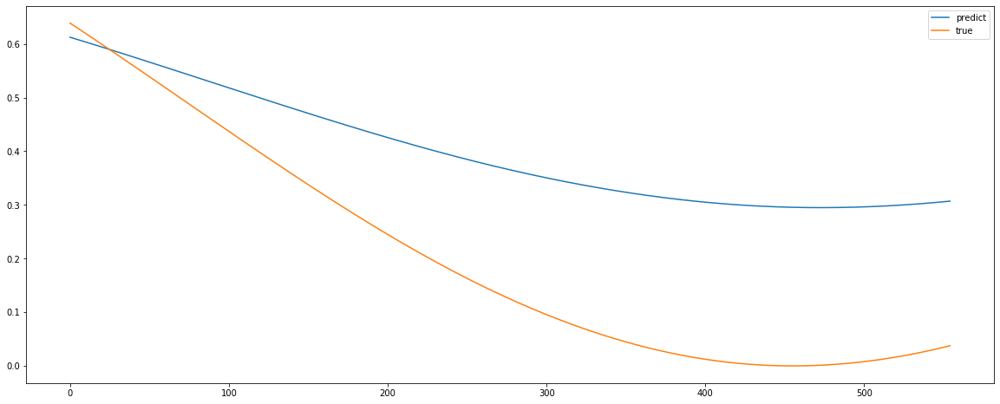

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  after removing the cwd from sys.path.
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  import sys
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:17: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           (None, 1, 24)        0                                            
__________________________________________________________________________________________________
dense_117 (Dense)               (None, 1, 24)        600         input_30[0][0]                   
__________________________________________________________________________________________________
dense_118 (Dense)               (None, 1, 12)        300         dense_117[0][0]                  
__________________________________________________________________________________________________
dense_119 (Dense)               (None, 1, 12)        156         dense_118[0][0]                  
__________________________________________________________________________________________________
concatenat

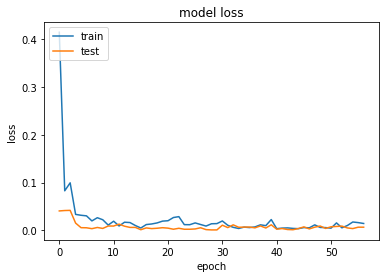

Root mean squared error Train: 0.030
Root mean squared error Test: 0.007


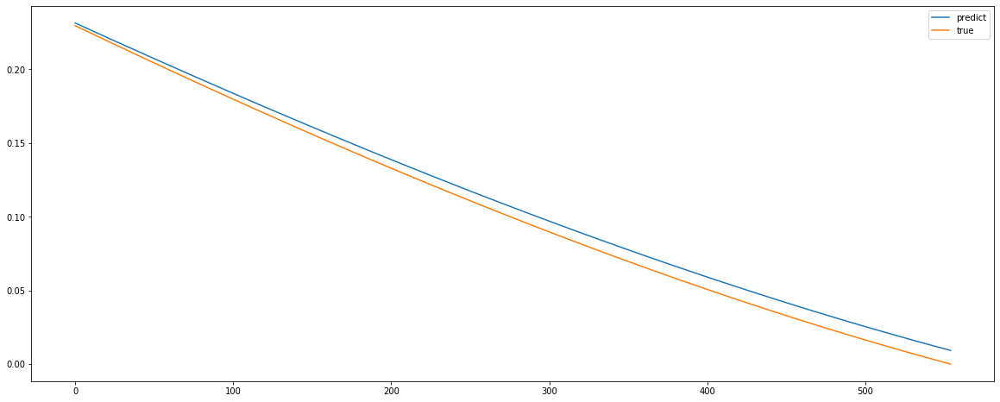

Variance : 0.548
Mean absolute error Train: 111719.320
Mean absolute error Test: 130363.954
Root mean squared error Train: 143440.796
Root mean squared error Test: 161719.864


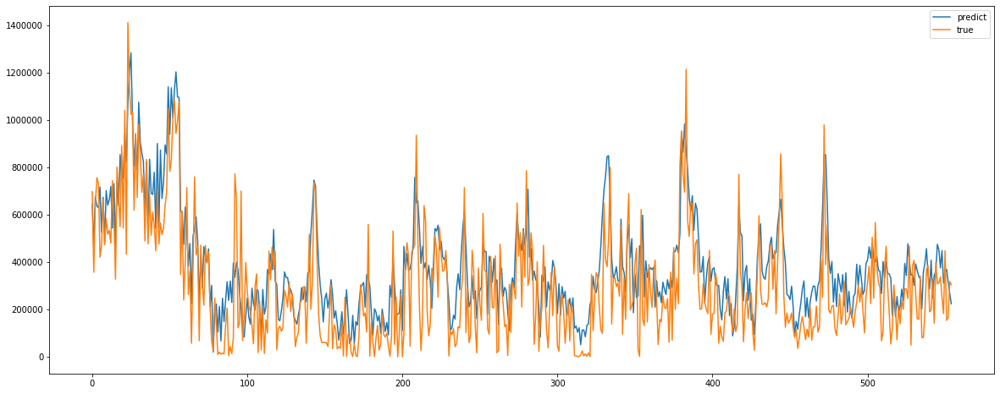

In [36]:
def drvflmodel(trainX,textX,trainY,testY):
    X_input = Input(shape=(trainX.shape[1], trainX.shape[2]))

    layer=Dense(24,init='glorot_uniform', input_shape=(trainX.shape[1], trainX.shape[2]))(X_input)
    layer.trainable=False

    layer2=Dense(12,init='glorot_uniform')(layer)
    layer2.trainable=True
    res0=Concatenate(axis=-1)([layer2,X_input])
    res0.trainable=True
    layer3=Dense(12,init='glorot_uniform')(layer2)
    layer3.trainable=True
    res=Concatenate(axis=-1)([layer3,X_input])
    res.trainable=True
    #model.add(res)
    flat=Flatten()(res)
    layer4=Dense(1,init='glorot_uniform')(flat)
    layer4.trainable=True
    #model.add(layer4)
    model = Model(inputs=X_input, outputs=layer4)

    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(drvflmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [37]:
np.array(ff_train).shape

(10, 1665, 1)

In [38]:
#print(ff_train[:,0],ff_train[:,3])

In [39]:
#np.array(ff_train)[:,0]

In [40]:
#trainY_pred

In [41]:
np.array(testY_act).shape

(555,)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_1 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_121 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


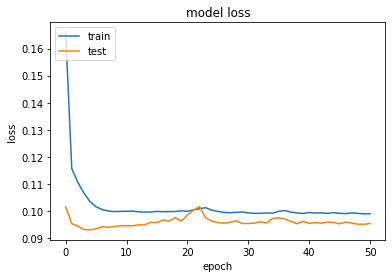

Root mean squared error Train: 0.128
Root mean squared error Test: 0.121


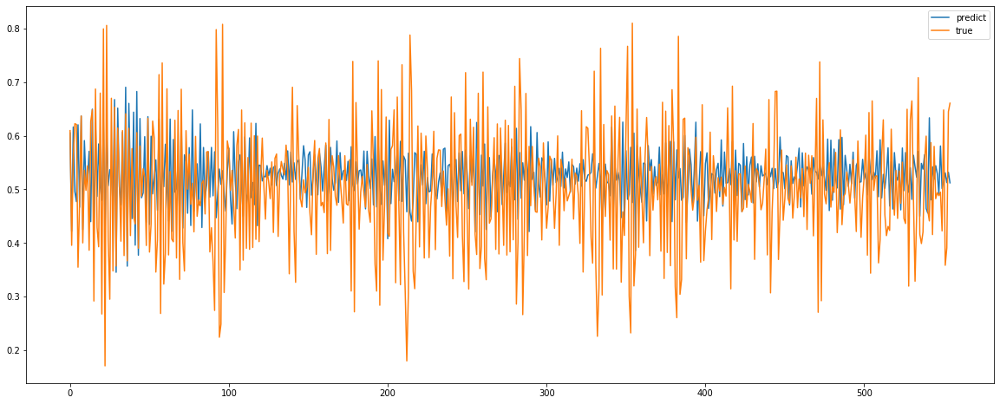

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_2 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_122 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


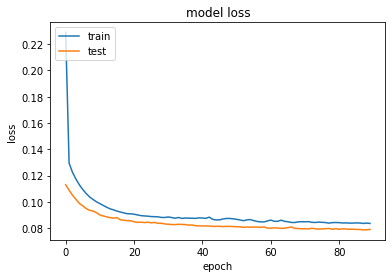

Root mean squared error Train: 0.111
Root mean squared error Test: 0.108


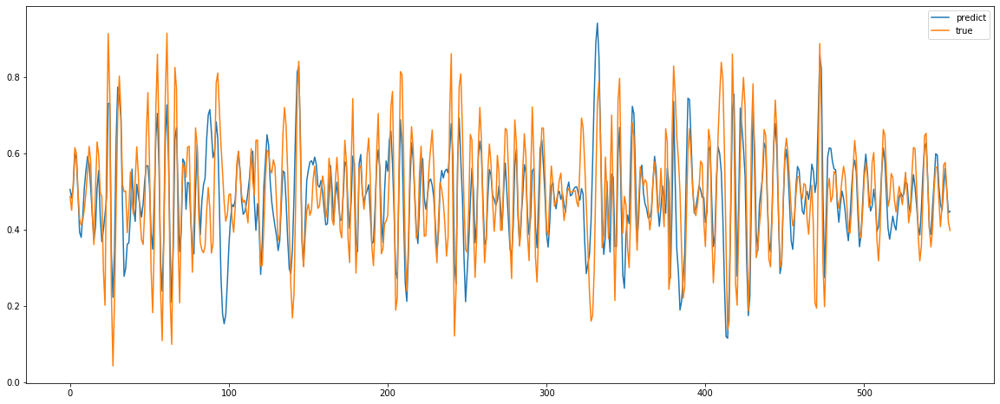

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_3 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_123 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


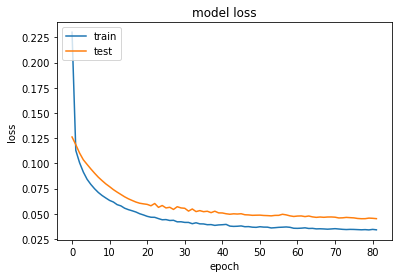

Root mean squared error Train: 0.042
Root mean squared error Test: 0.072


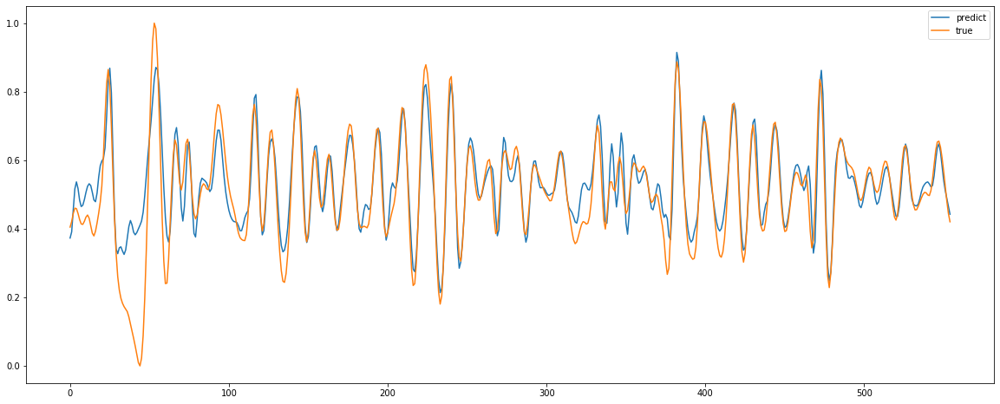

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_4 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_124 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


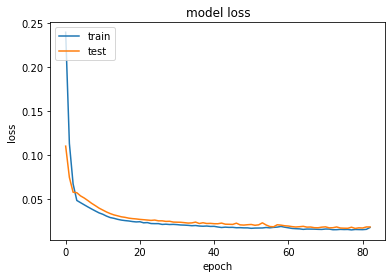

Root mean squared error Train: 0.022
Root mean squared error Test: 0.024


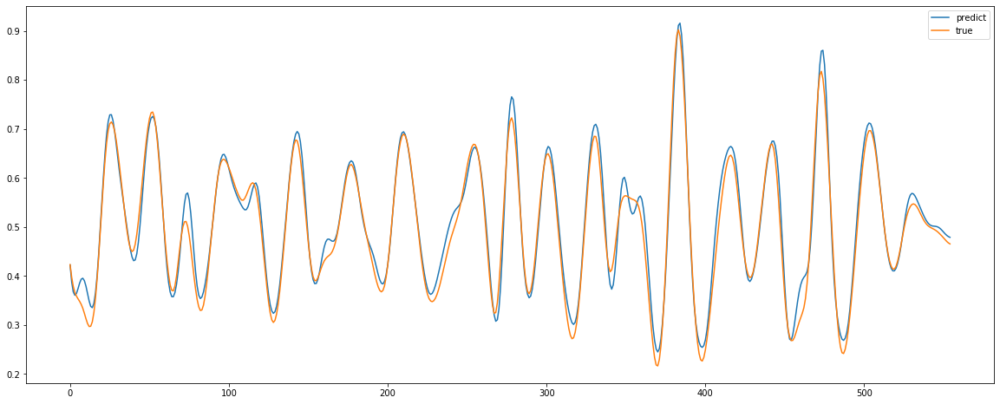

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_5 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_125 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


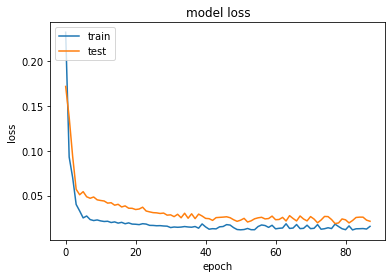

Root mean squared error Train: 0.016
Root mean squared error Test: 0.027


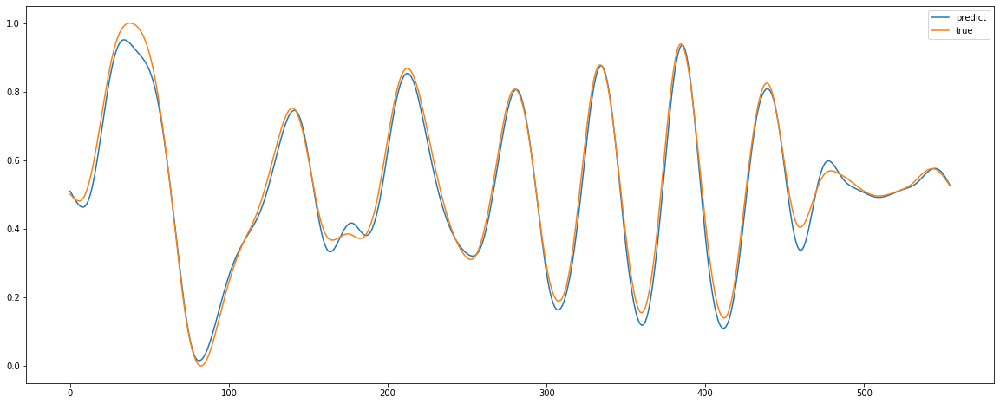

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_6 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_126 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


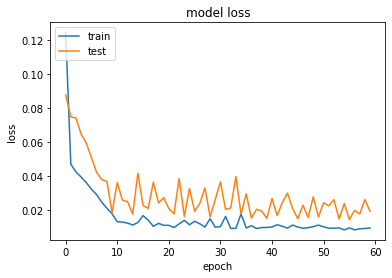

Root mean squared error Train: 0.014
Root mean squared error Test: 0.024


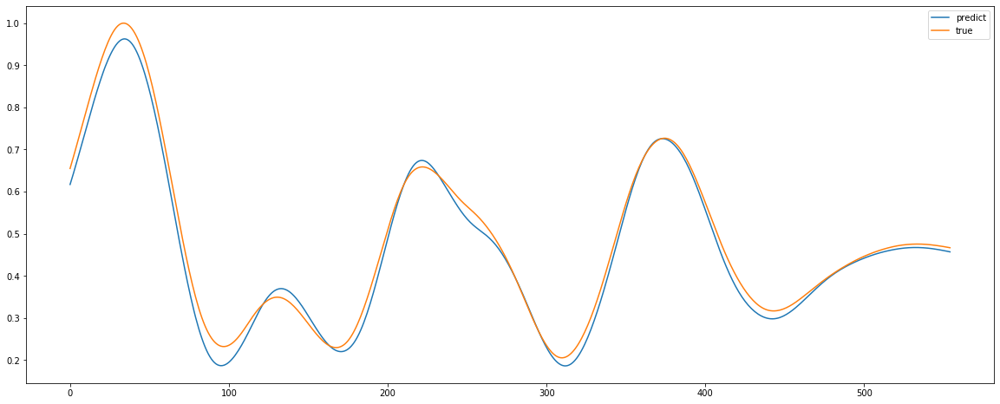

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_7 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_127 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


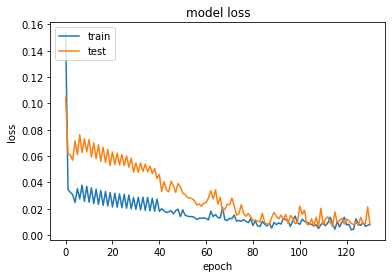

Root mean squared error Train: 0.005
Root mean squared error Test: 0.011


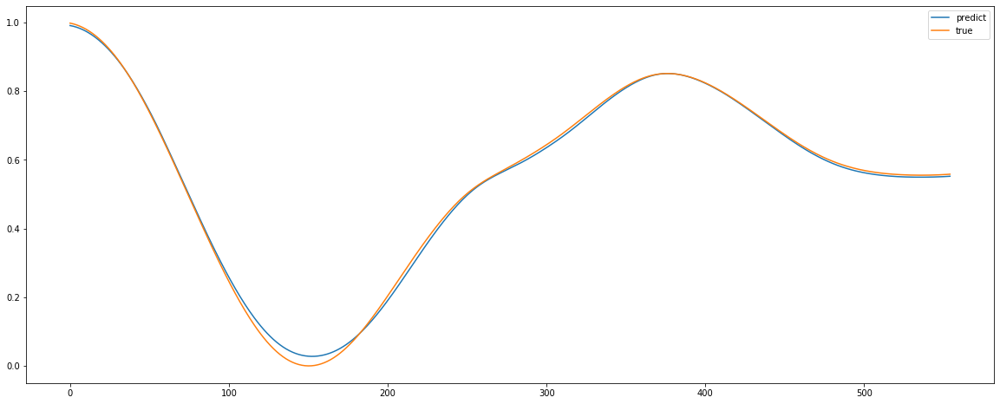

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_8 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_128 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


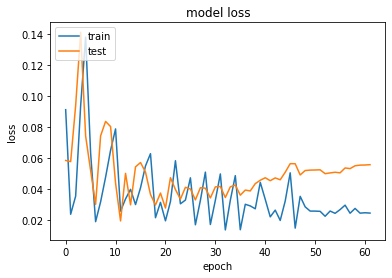

Root mean squared error Train: 0.050
Root mean squared error Test: 0.061


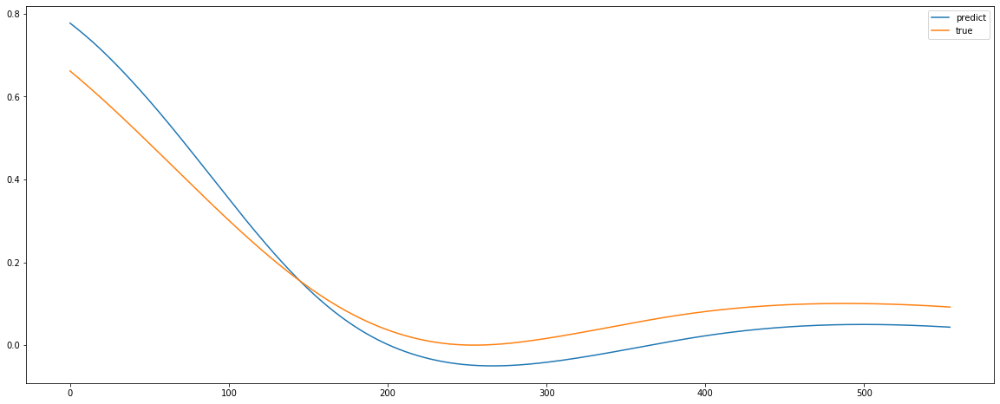

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_9 (Bidirection (None, 48)                9408      
_________________________________________________________________
dense_129 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


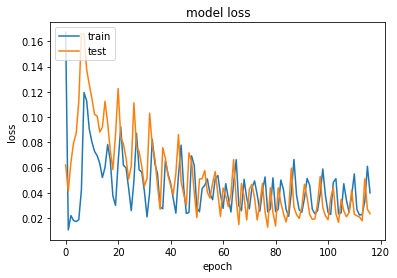

Root mean squared error Train: 0.054
Root mean squared error Test: 0.033


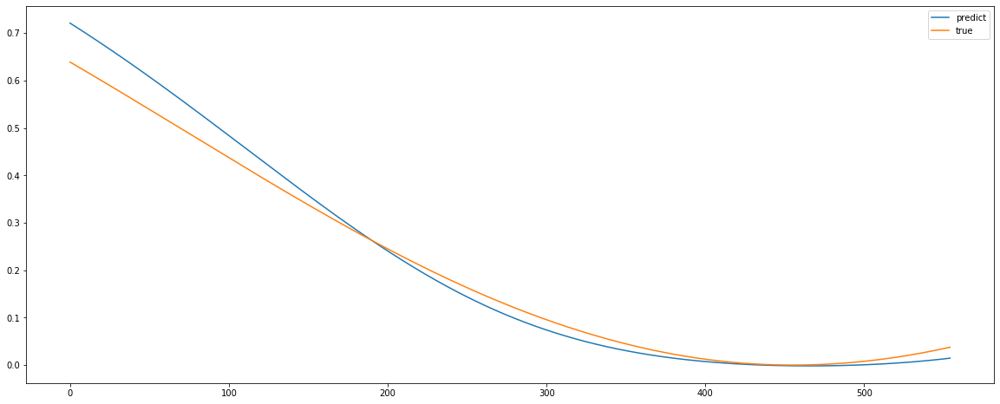

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_10 (Bidirectio (None, 48)                9408      
_________________________________________________________________
dense_130 (Dense)            (None, 1)                 49        
Total params: 9,457
Trainable params: 9,457
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


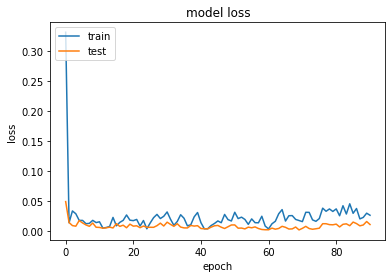

Root mean squared error Train: 0.034
Root mean squared error Test: 0.012


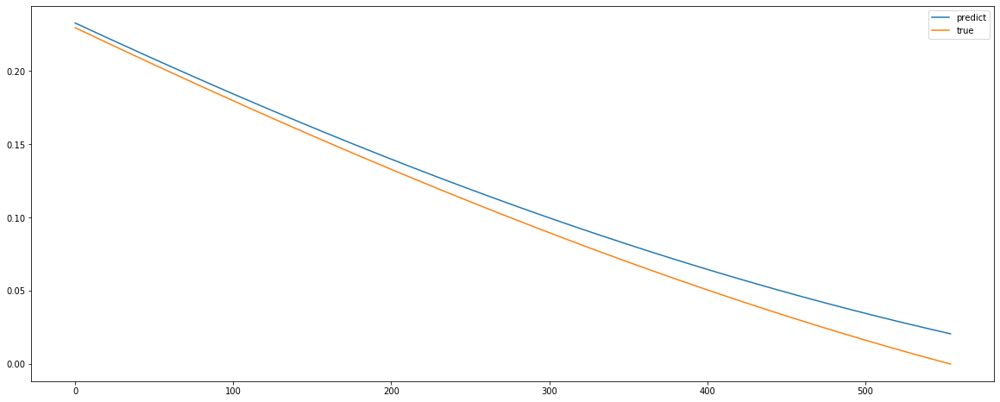

Variance : 0.651
Mean absolute error Train: 115897.248
Mean absolute error Test: 111402.553
Root mean squared error Train: 147005.346
Root mean squared error Test: 142009.163


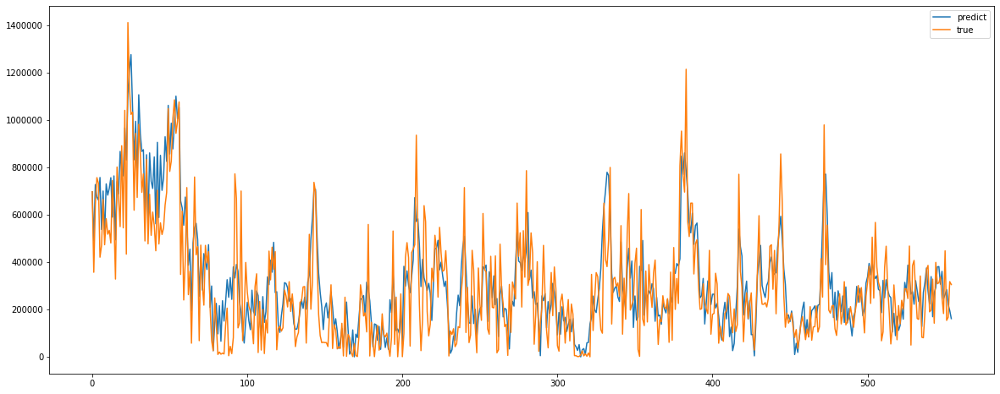

In [42]:

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN,Bidirectional
def bilstmmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(Bidirectional(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2]))))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(bilstmmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_21 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_131 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_132 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


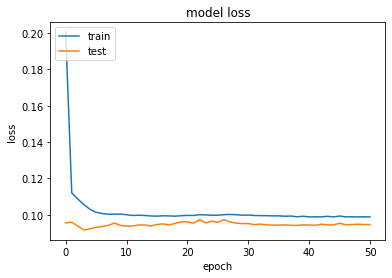

Root mean squared error Train: 0.127
Root mean squared error Test: 0.120


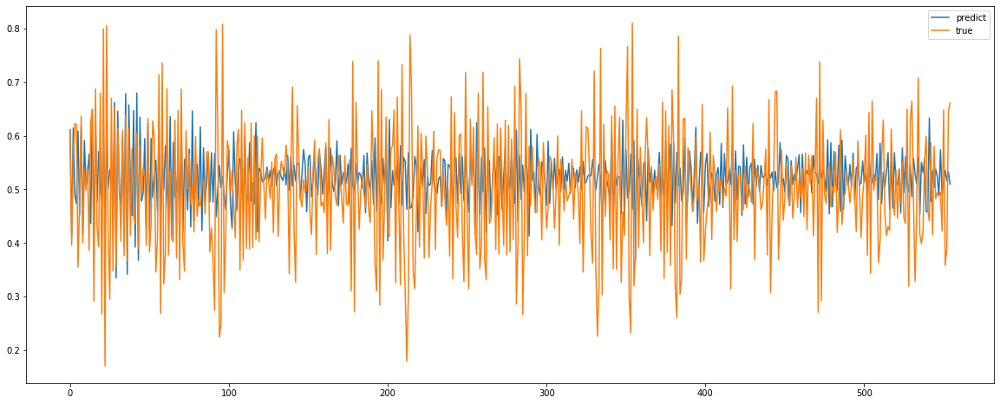

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_133 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_134 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


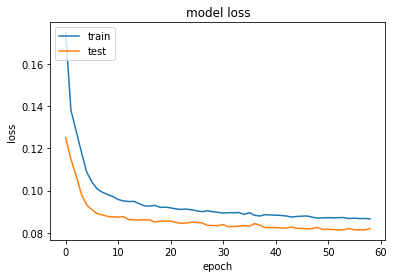

Root mean squared error Train: 0.116
Root mean squared error Test: 0.112


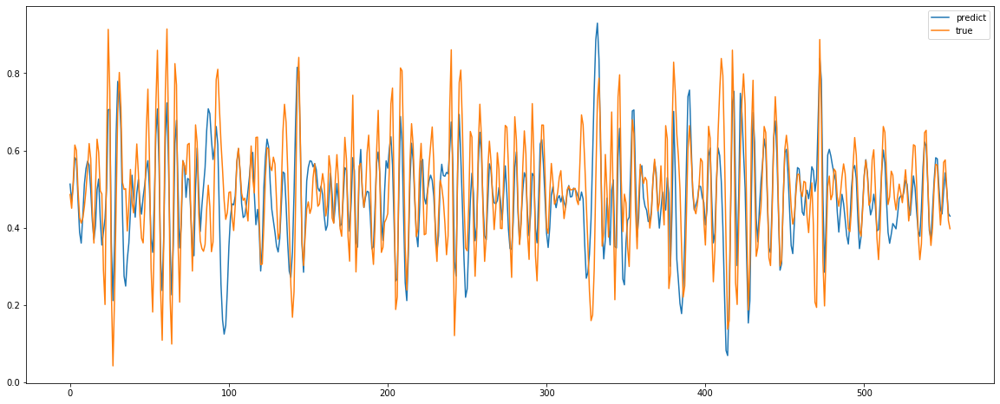

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_23 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_135 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_136 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


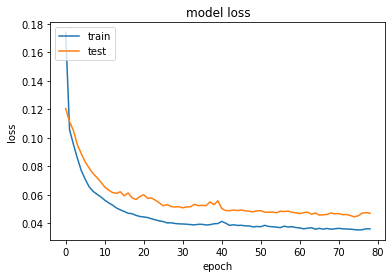

Root mean squared error Train: 0.044
Root mean squared error Test: 0.072


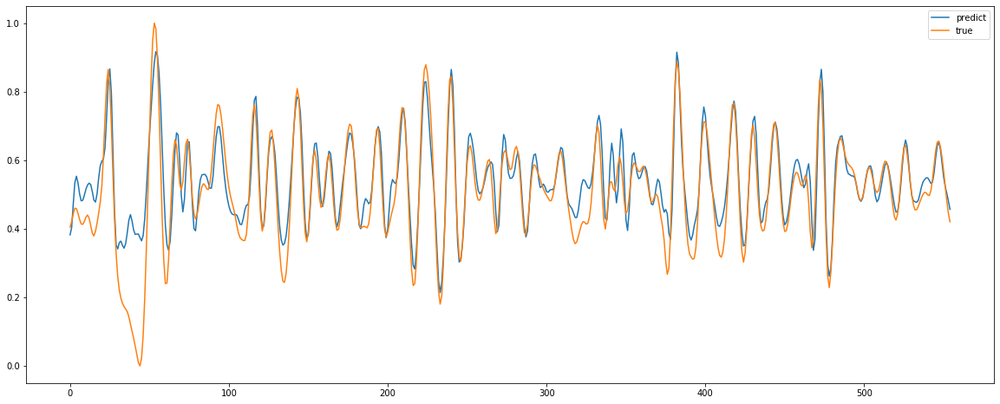

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_24 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_137 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_138 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


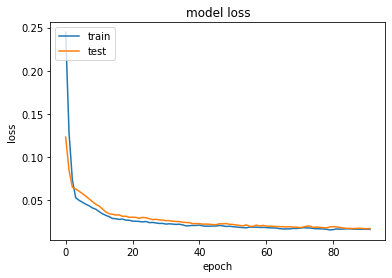

Root mean squared error Train: 0.019
Root mean squared error Test: 0.022


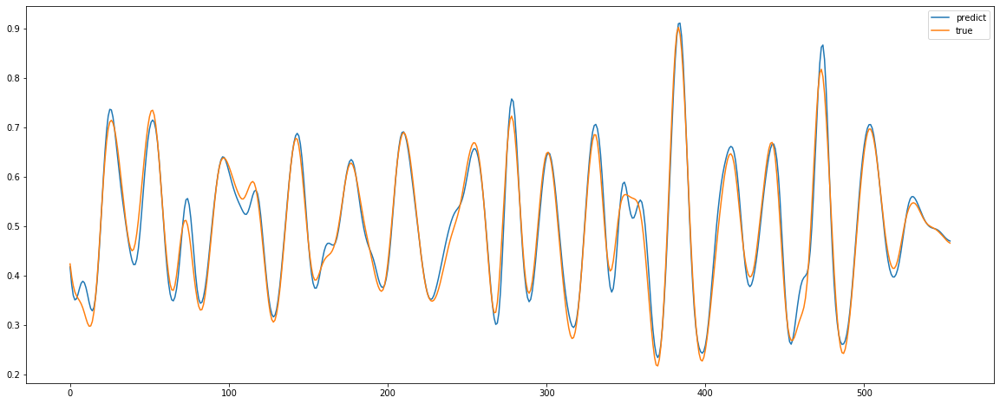

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_25 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_139 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_140 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


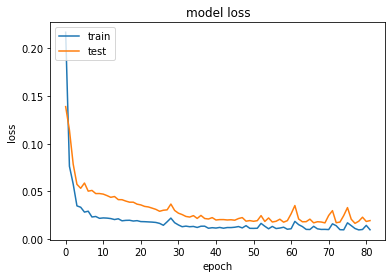

Root mean squared error Train: 0.014
Root mean squared error Test: 0.024


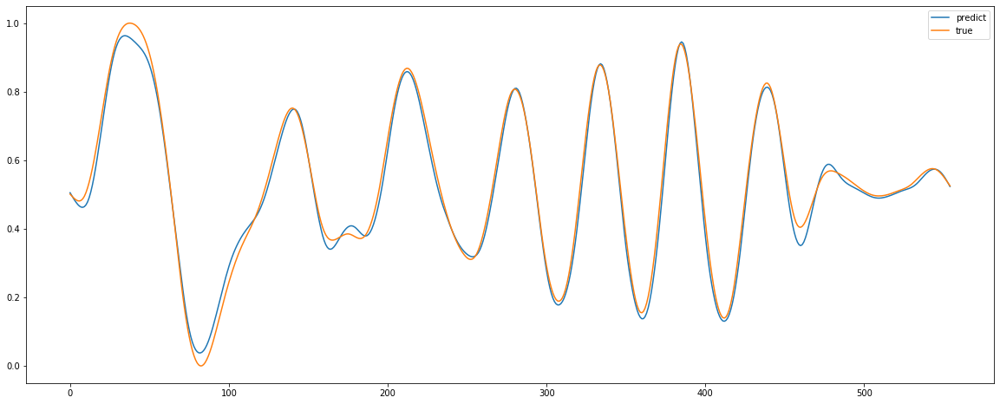

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_141 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_142 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


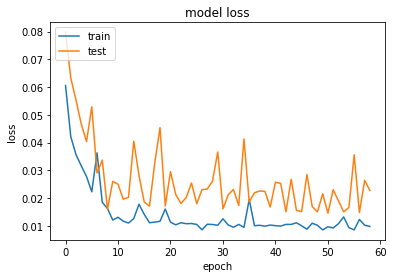

Root mean squared error Train: 0.017
Root mean squared error Test: 0.028


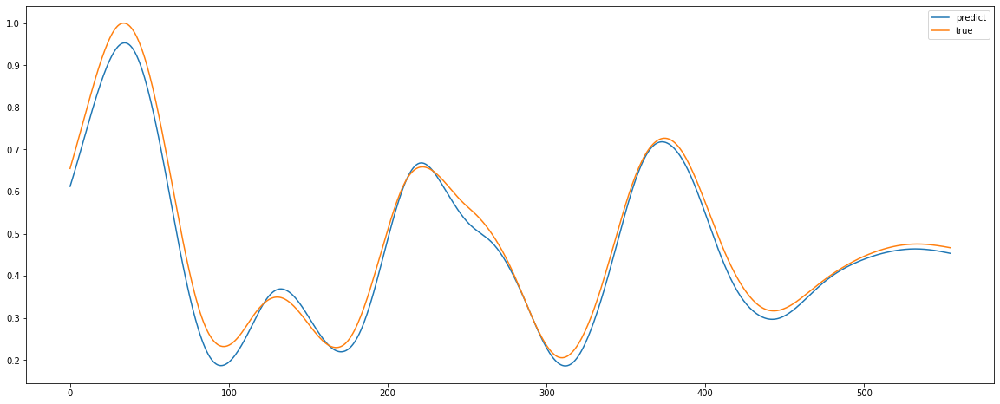

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_27 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_143 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_144 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


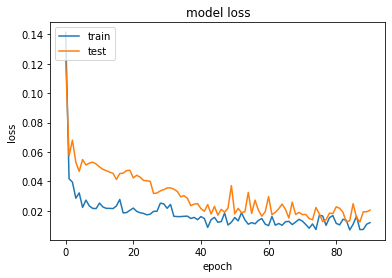

Root mean squared error Train: 0.012
Root mean squared error Test: 0.026


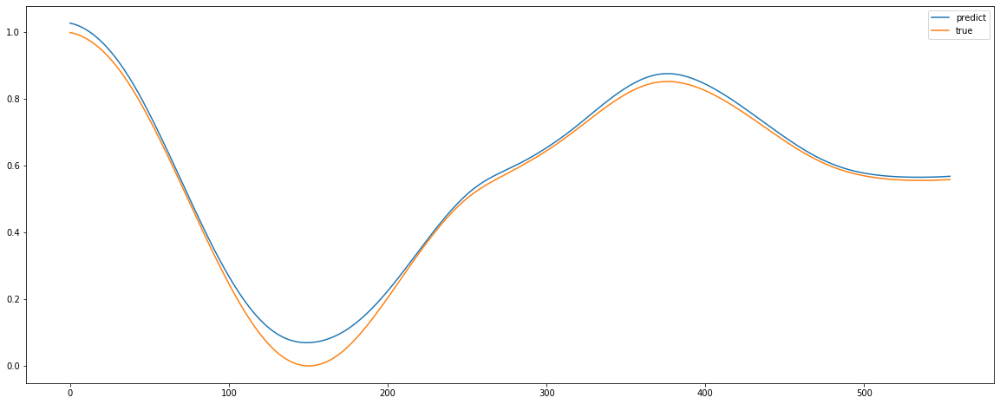

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_145 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_146 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


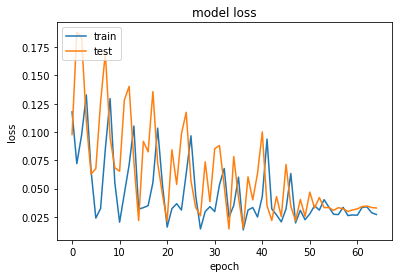

Root mean squared error Train: 0.037
Root mean squared error Test: 0.043


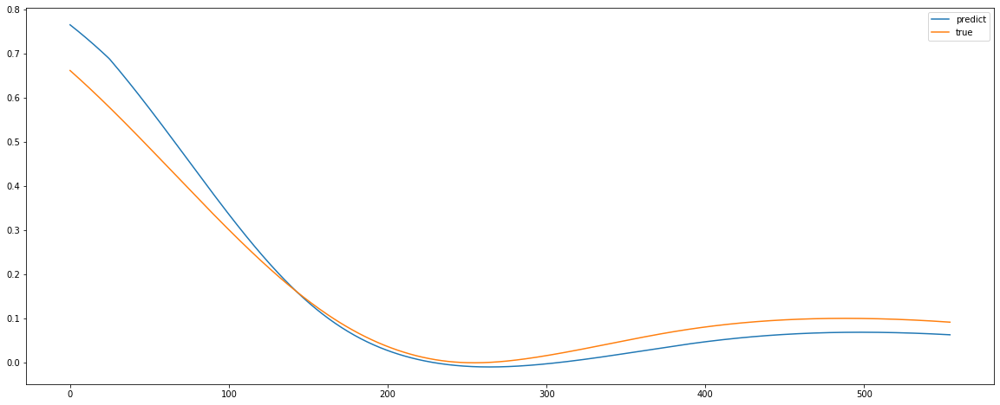

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_29 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_147 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_148 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


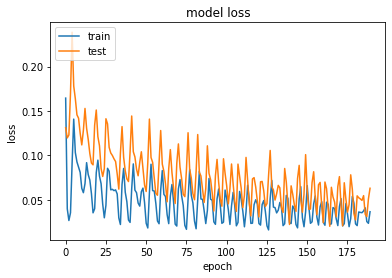

Root mean squared error Train: 0.079
Root mean squared error Test: 0.067


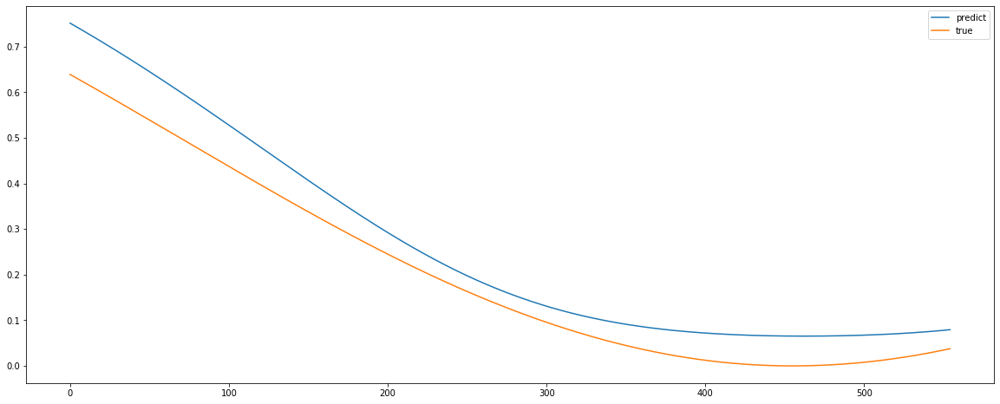

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_30 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_149 (Dense)            (None, 10)                250       
_________________________________________________________________
dense_150 (Dense)            (None, 1)                 11        
Total params: 4,965
Trainable params: 4,965
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


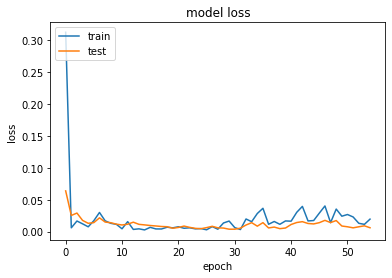

Root mean squared error Train: 0.027
Root mean squared error Test: 0.007


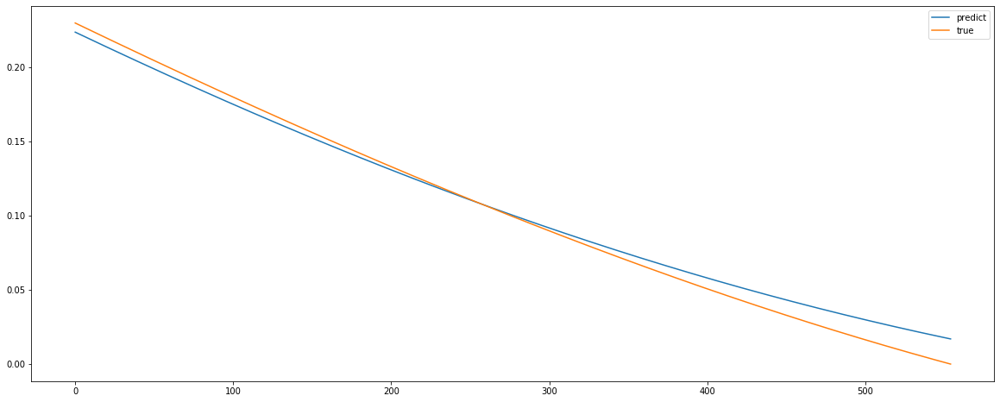

Variance : 0.643
Mean absolute error Train: 115920.058
Mean absolute error Test: 113141.509
Root mean squared error Train: 147128.123
Root mean squared error Test: 143719.480


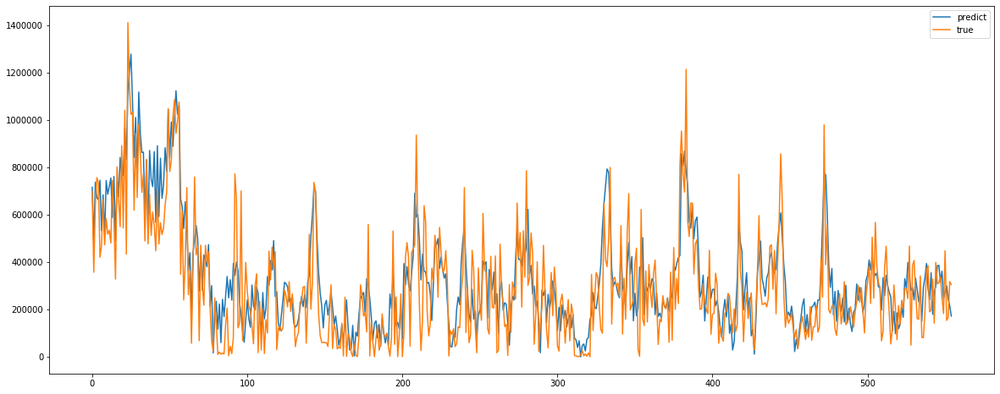

In [43]:

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN,Bidirectional
def stackmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add((LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2]))))
    model.add(Dense(10))

    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(stackmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

Variance : 0.643
Mean absolute error Train: 115920.058
Mean absolute error Test: 113141.509
Root mean squared error Train: 147128.123
Root mean squared error Test: 143719.480


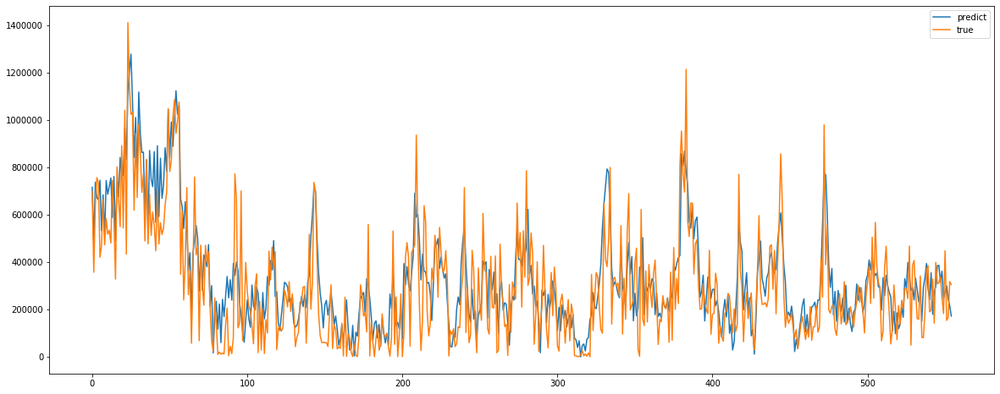

In [44]:

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

W0809 16:07:15.683253 19800 deprecation_wrapper.py:119] From C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\keras\backend\tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_1 (TimeDist (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_2 (TimeDist (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, None, 384)         0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_151 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


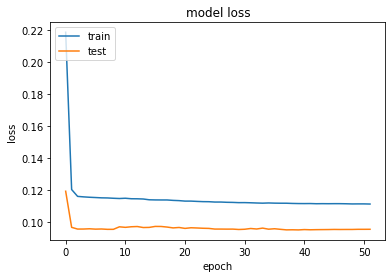

Root mean squared error Train: 0.136
Root mean squared error Test: 0.118


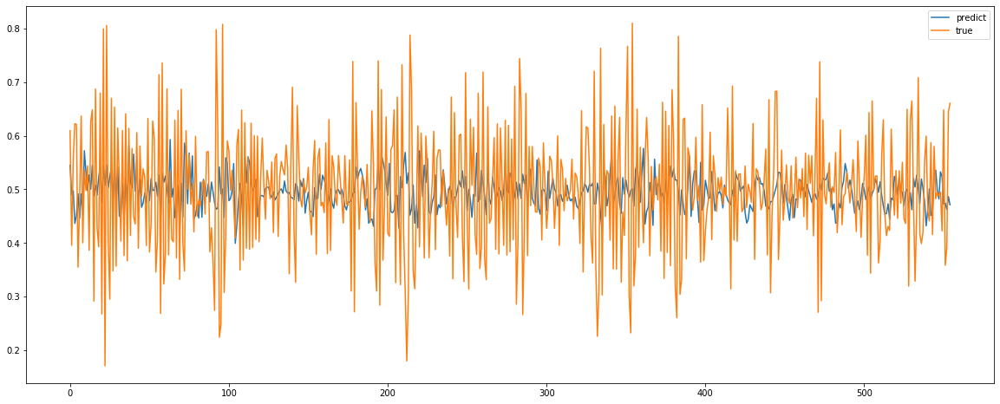

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_4 (TimeDist (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_5 (TimeDist (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_6 (TimeDist (None, None, 384)         0         
_________________________________________________________________
lstm_32 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_152 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


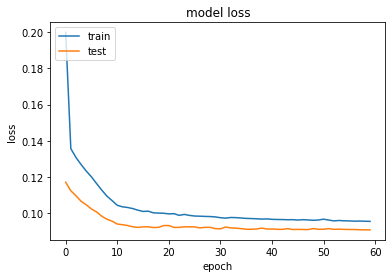

Root mean squared error Train: 0.128
Root mean squared error Test: 0.121


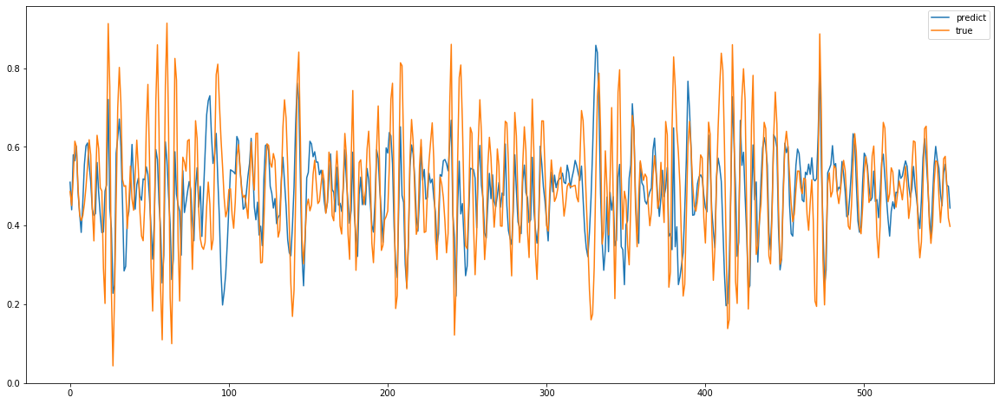

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_7 (TimeDist (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_8 (TimeDist (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_9 (TimeDist (None, None, 384)         0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_153 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


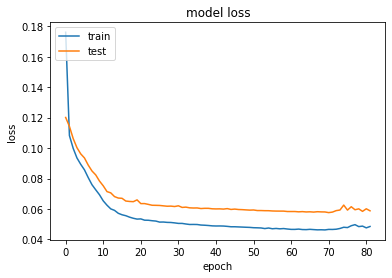

Root mean squared error Train: 0.061
Root mean squared error Test: 0.084


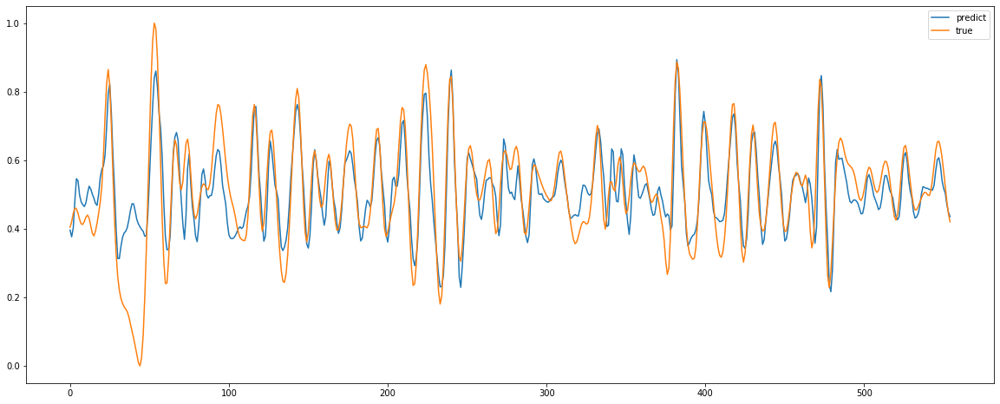

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_10 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_11 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_12 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_34 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_154 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


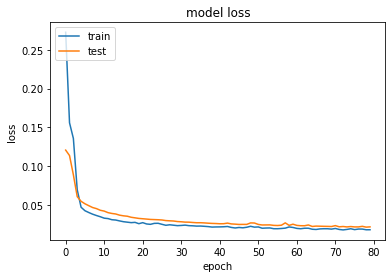

Root mean squared error Train: 0.022
Root mean squared error Test: 0.028


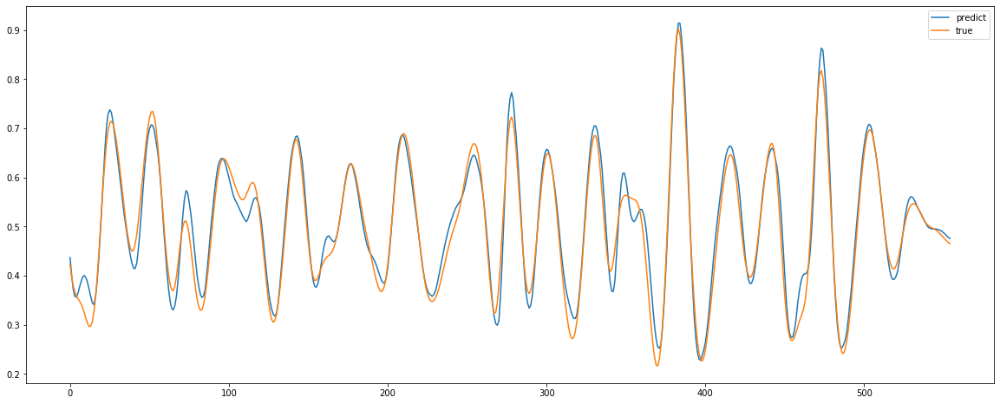

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_13 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_14 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_15 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_155 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


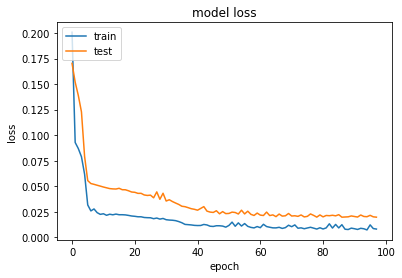

Root mean squared error Train: 0.009
Root mean squared error Test: 0.030


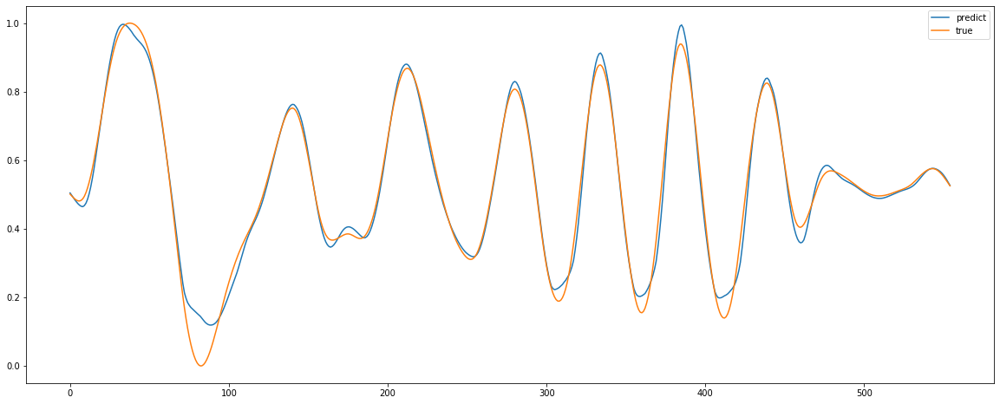

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_16 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_17 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_18 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_36 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_156 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


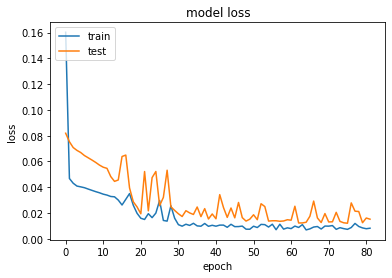

Root mean squared error Train: 0.013
Root mean squared error Test: 0.020


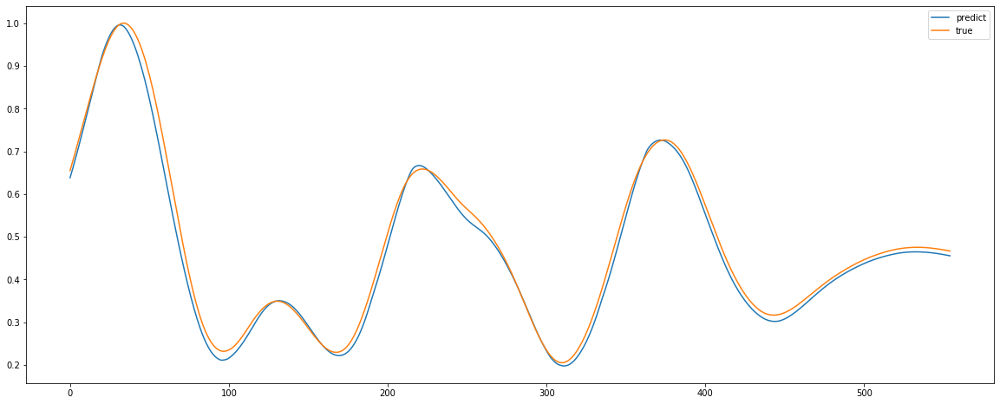

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_19 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_20 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_21 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_37 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_157 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


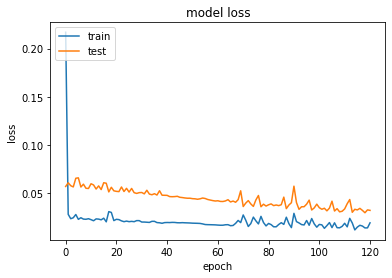

Root mean squared error Train: 0.011
Root mean squared error Test: 0.041


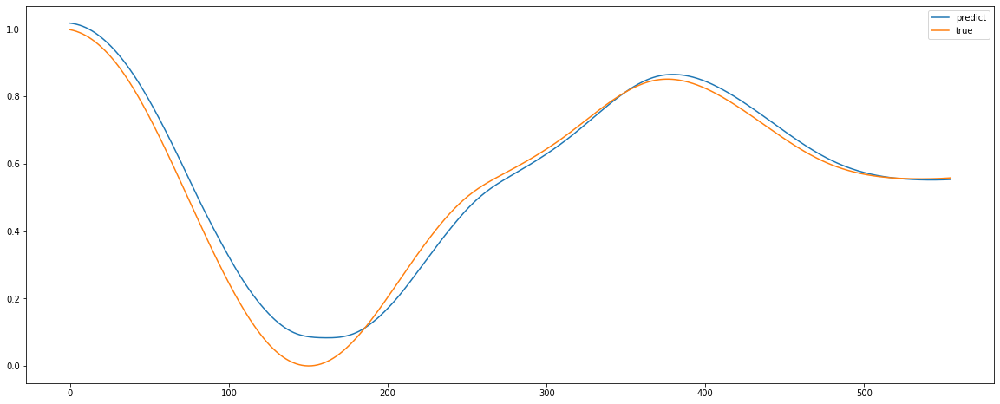

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_22 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_23 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_24 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_38 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_158 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


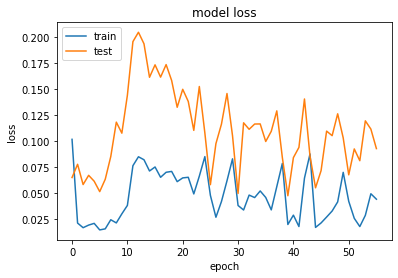

Root mean squared error Train: 0.059
Root mean squared error Test: 0.099


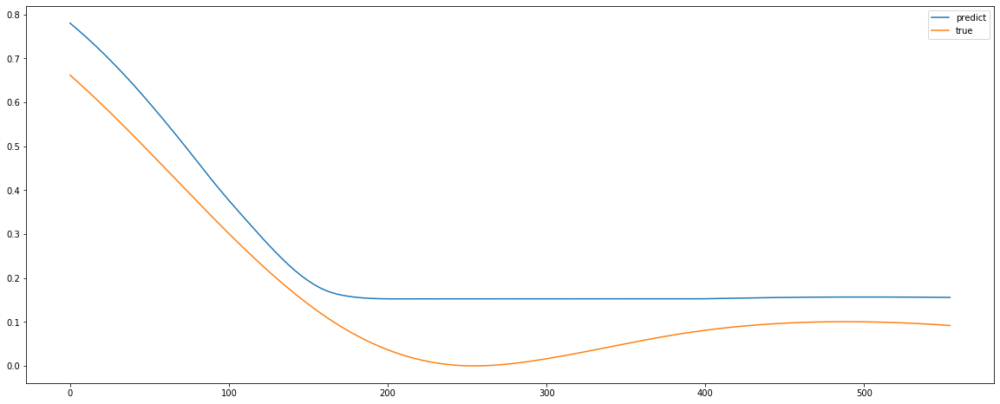

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_25 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_26 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_27 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_39 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_159 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


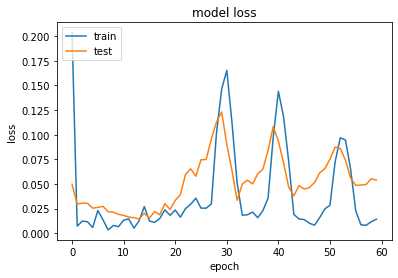

Root mean squared error Train: 0.037
Root mean squared error Test: 0.061


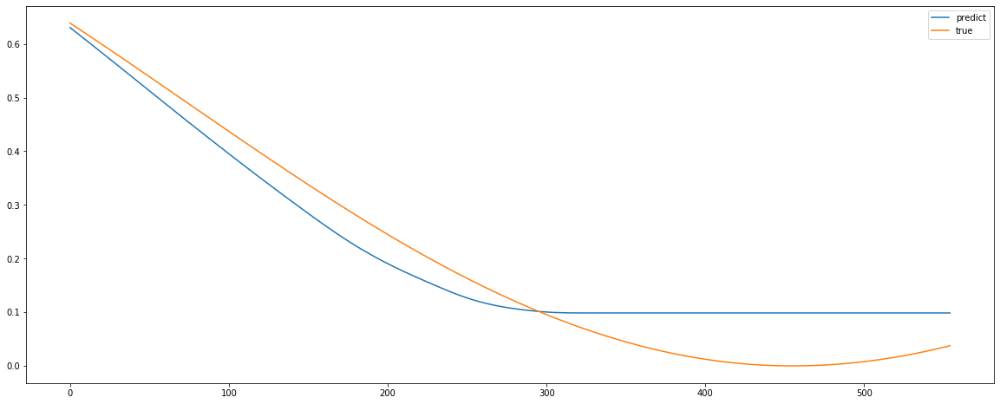

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_28 (TimeDis (None, None, 12, 64)      128       
_________________________________________________________________
time_distributed_29 (TimeDis (None, None, 6, 64)       0         
_________________________________________________________________
time_distributed_30 (TimeDis (None, None, 384)         0         
_________________________________________________________________
lstm_40 (LSTM)               (None, 50)                87000     
_________________________________________________________________
dense_160 (Dense)            (None, 1)                 51        
Total params: 87,179
Trainable params: 87,179
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


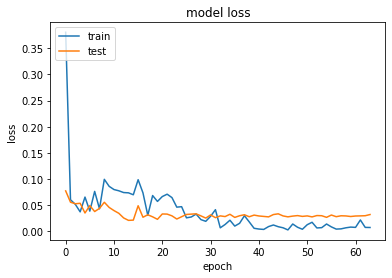

Root mean squared error Train: 0.005
Root mean squared error Test: 0.039


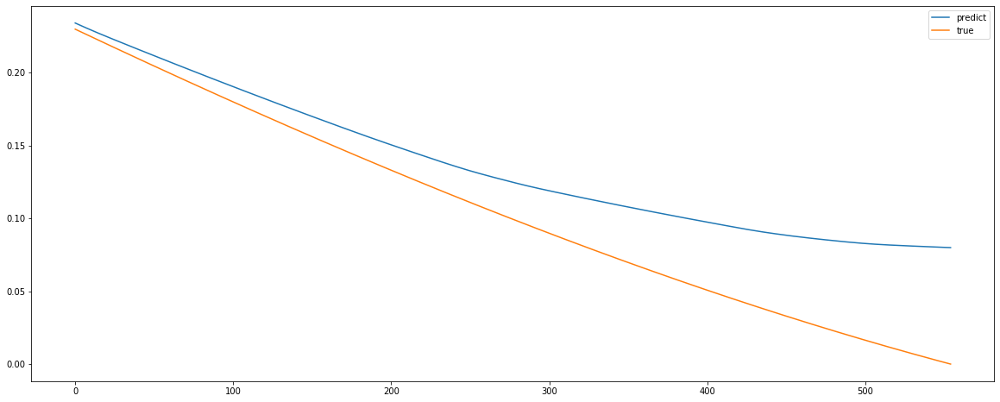

Variance : 0.646
Mean absolute error Train: 124005.305
Mean absolute error Test: 113833.822
Root mean squared error Train: 155972.247
Root mean squared error Test: 142999.111


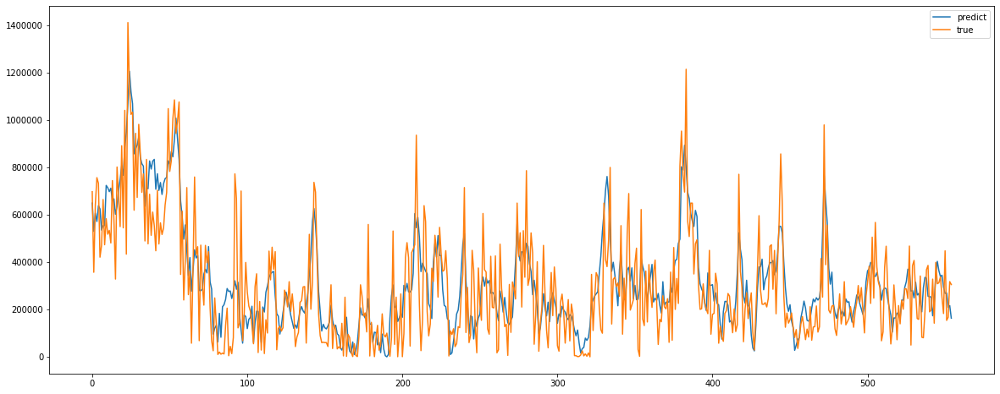

In [45]:

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN,Bidirectional,TimeDistributed
def cnnmodel(trainX,textX,trainY,testY):
    trainX1 = np.reshape(trainX, (trainX.shape[0], 2,12,1))
    testX1 = np.reshape(testX, (testX.shape[0], 2,12,1))
    model = Sequential()
    #model.add(Bidirectional(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2]))))
    model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'),  input_shape=(None ,trainX1.shape[2], trainX1.shape[3])))
    model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(50, activation='relu'))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX1, trainY, epochs=300, batch_size=50, validation_data=(testX1, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX1)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX1)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(cnnmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_1 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_41 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_161 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


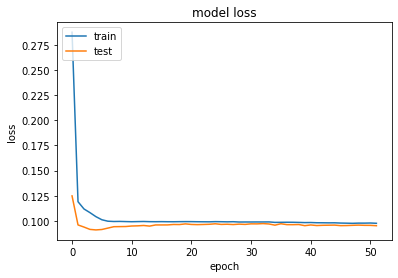

Root mean squared error Train: 0.125
Root mean squared error Test: 0.121


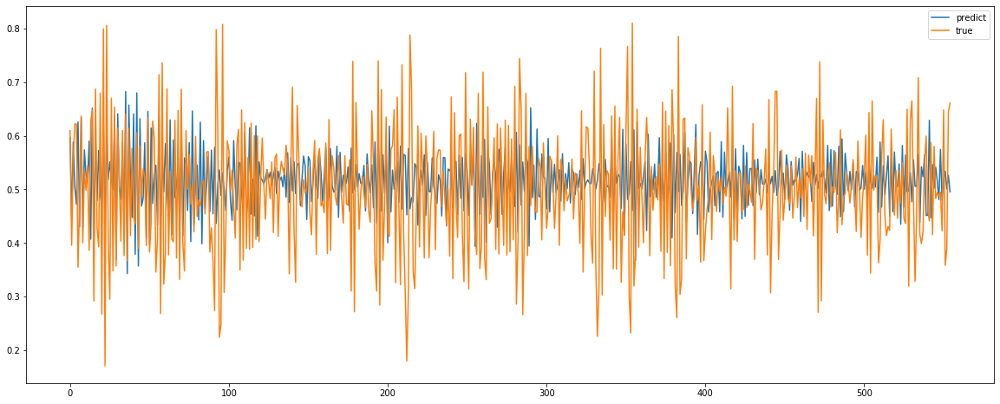

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_2 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_42 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_162 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


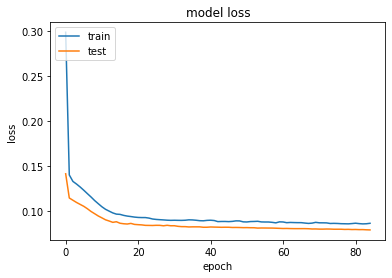

Root mean squared error Train: 0.112
Root mean squared error Test: 0.107


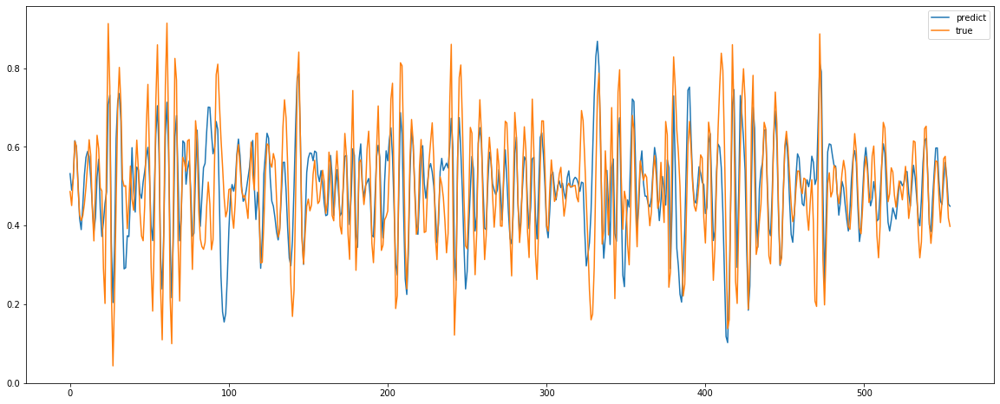

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_3 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_43 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_163 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


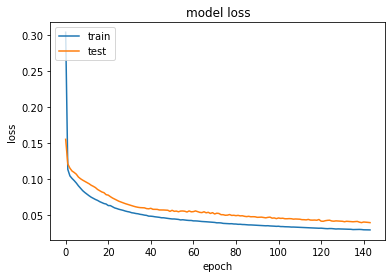

Root mean squared error Train: 0.038
Root mean squared error Test: 0.064


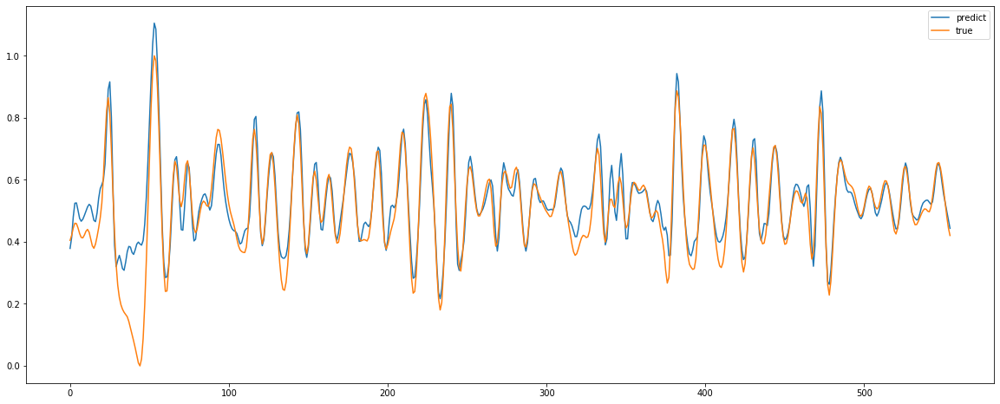

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_4 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_44 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_164 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


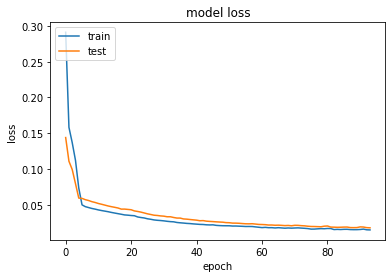

Root mean squared error Train: 0.019
Root mean squared error Test: 0.024


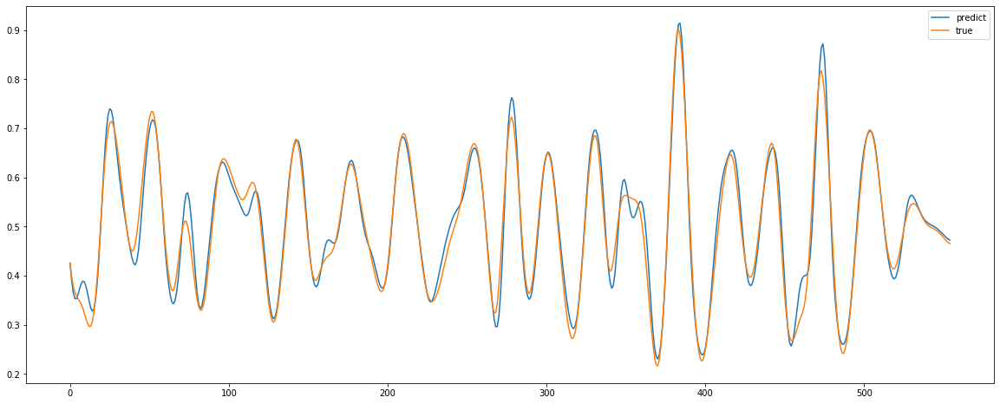

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_5 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_45 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_165 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


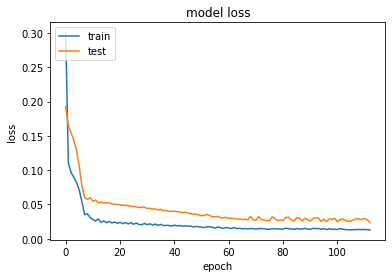

Root mean squared error Train: 0.018
Root mean squared error Test: 0.031


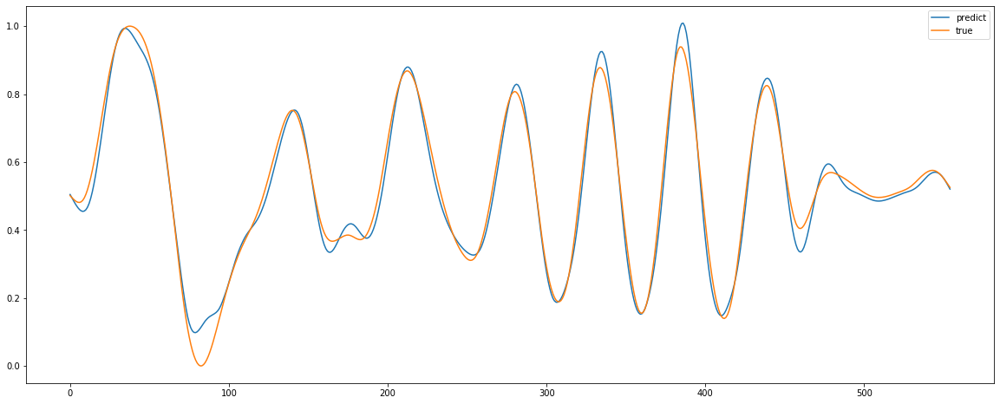

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_6 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_46 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_166 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


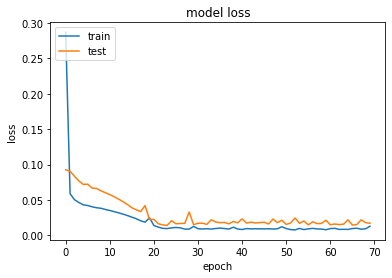

Root mean squared error Train: 0.010
Root mean squared error Test: 0.022


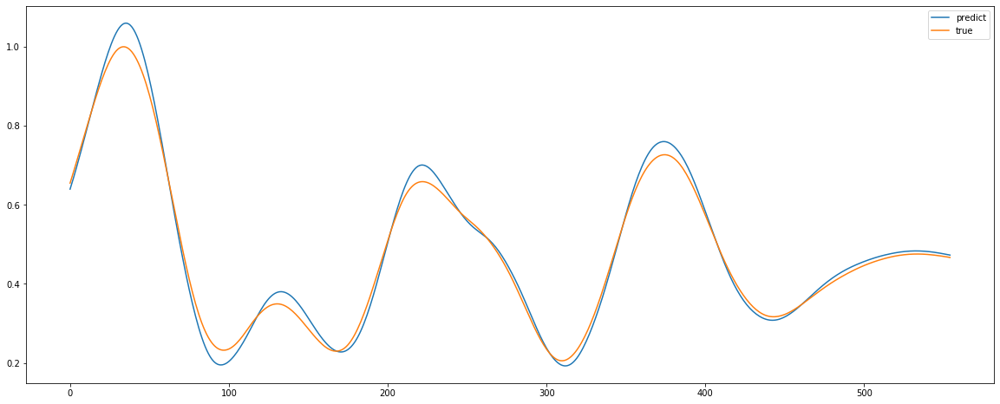

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_7 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_47 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_167 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


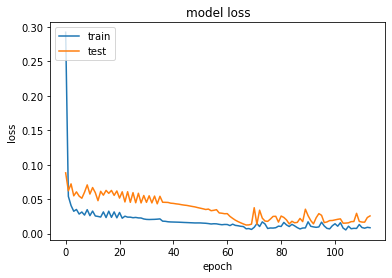

Root mean squared error Train: 0.018
Root mean squared error Test: 0.029


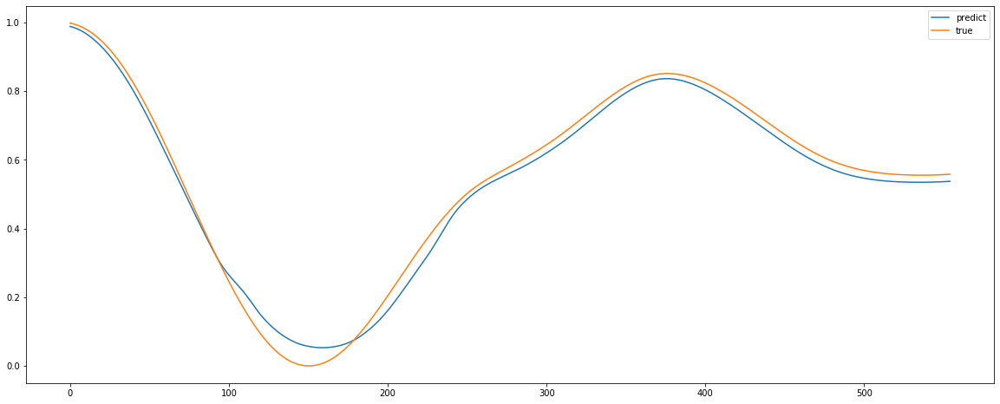

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_8 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_48 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_168 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


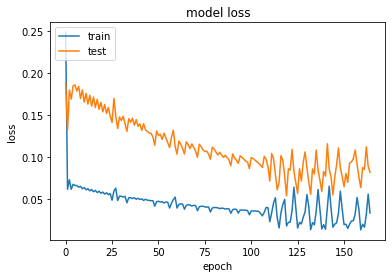

Root mean squared error Train: 0.042
Root mean squared error Test: 0.085


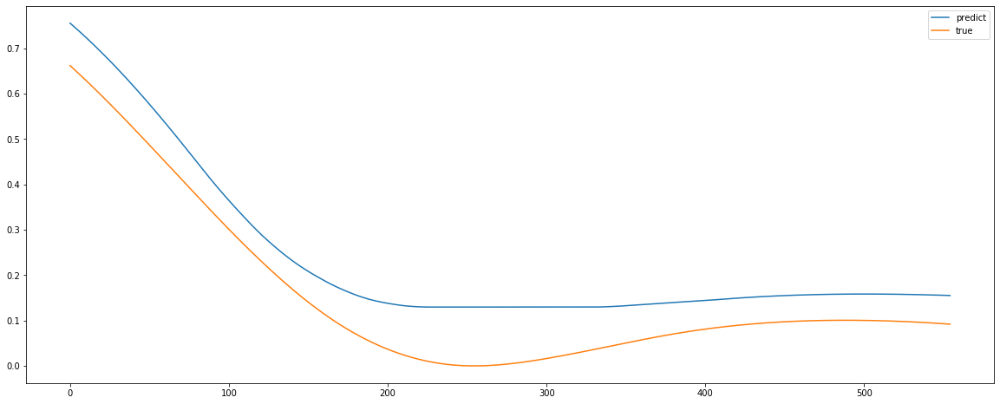

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_9 (ConvLSTM2D)  (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_49 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_169 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


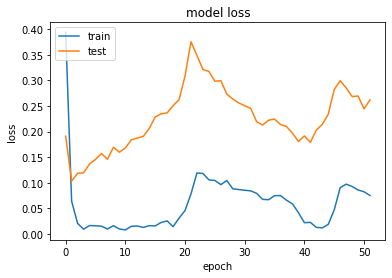

Root mean squared error Train: 0.130
Root mean squared error Test: 0.265


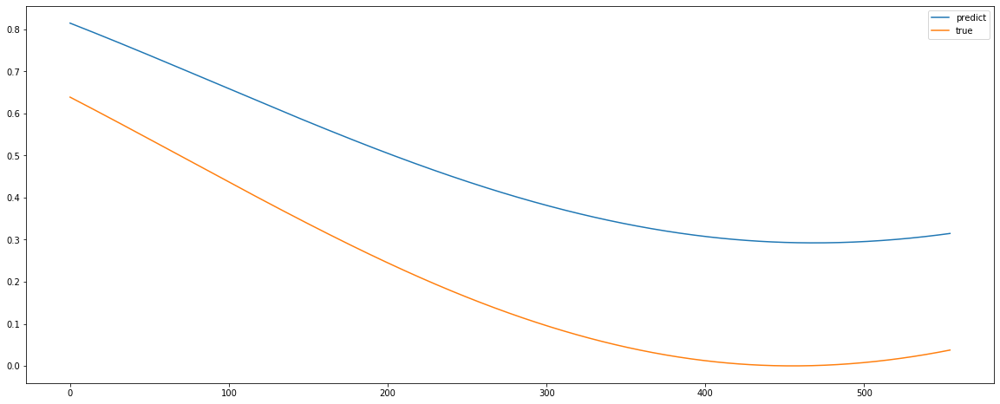

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_lst_m2d_10 (ConvLSTM2D) (None, 1, 23, 64)         33536     
_________________________________________________________________
flatten_50 (Flatten)         (None, 1472)              0         
_________________________________________________________________
dense_170 (Dense)            (None, 1)                 1473      
Total params: 35,009
Trainable params: 35,009
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


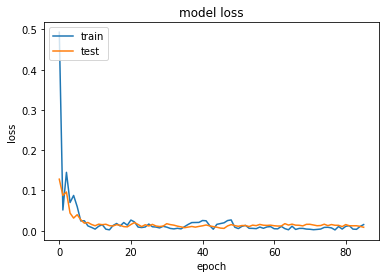

Root mean squared error Train: 0.028
Root mean squared error Test: 0.013


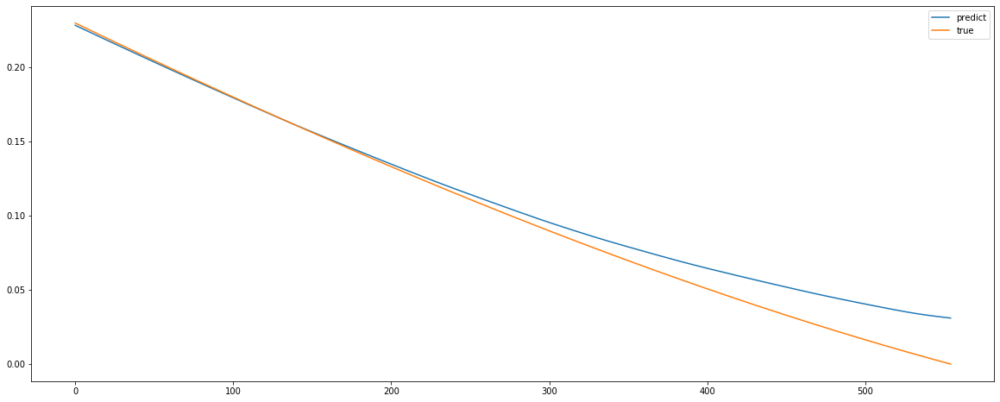

Variance : 0.499
Mean absolute error Train: 118853.000
Mean absolute error Test: 138799.214
Root mean squared error Train: 150317.055
Root mean squared error Test: 170313.056


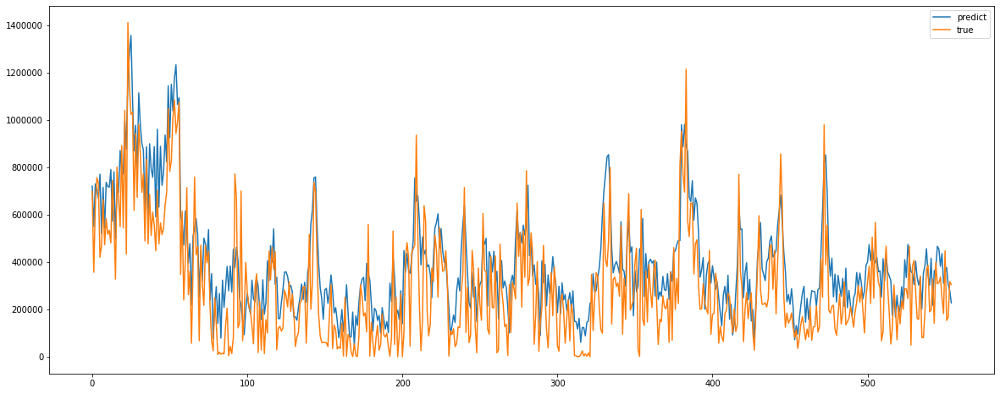

In [46]:

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN,Bidirectional,TimeDistributed,ConvLSTM2D
def convlstmmodel(trainX,textX,trainY,testY):
    trainX1 = np.reshape(trainX, (trainX.shape[0], 1,1,24,1))
    testX1 = np.reshape(testX, (testX.shape[0], 1,1,24,1))
    model = Sequential()
    #model.add(Bidirectional(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2]))))
    model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(trainX1.shape[1],trainX1.shape[2],trainX1.shape[3], trainX1.shape[4])))
    model.add(Flatten())
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX1, trainY, epochs=300, batch_size=50, validation_data=(testX1, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX1)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX1)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(convlstmmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_171 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_172 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_173 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_51 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_174 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

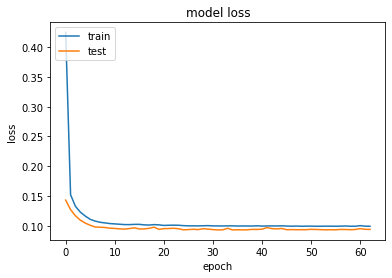

Root mean squared error Train: 0.126
Root mean squared error Test: 0.119


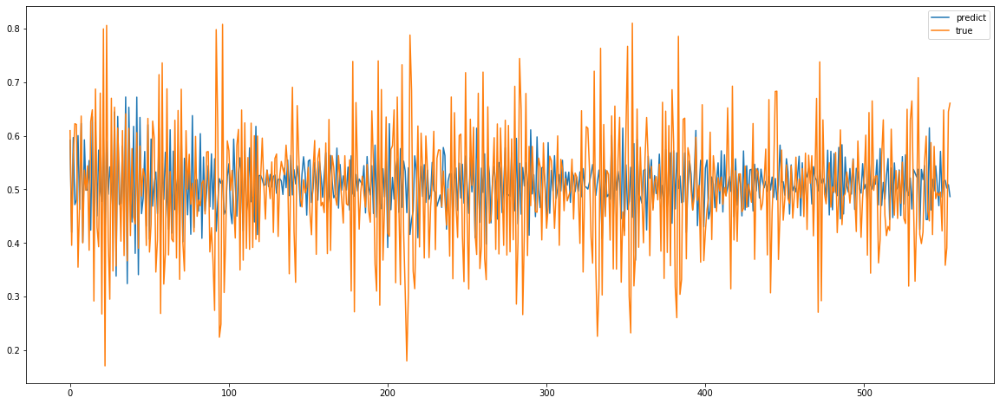

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_175 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_176 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_177 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_52 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_178 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

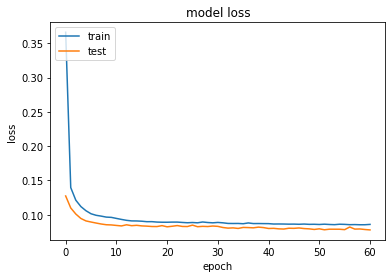

Root mean squared error Train: 0.112
Root mean squared error Test: 0.106


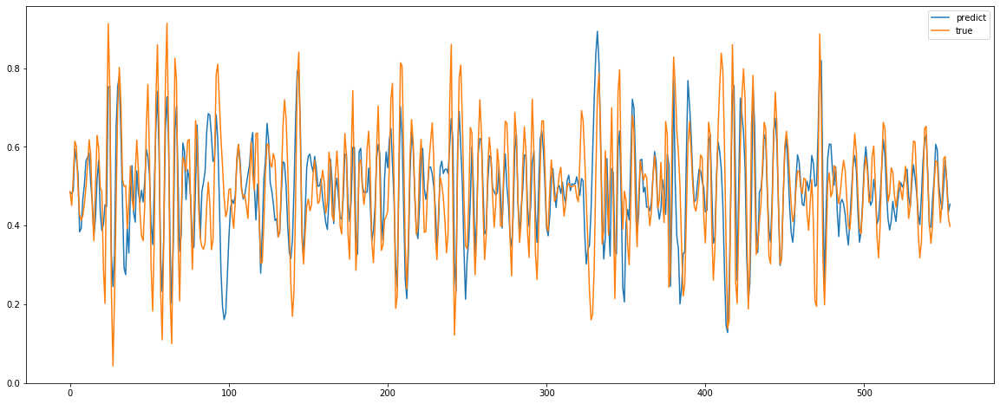

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_179 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_180 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_181 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_53 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_182 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

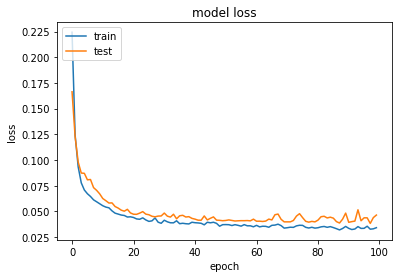

Root mean squared error Train: 0.044
Root mean squared error Test: 0.069


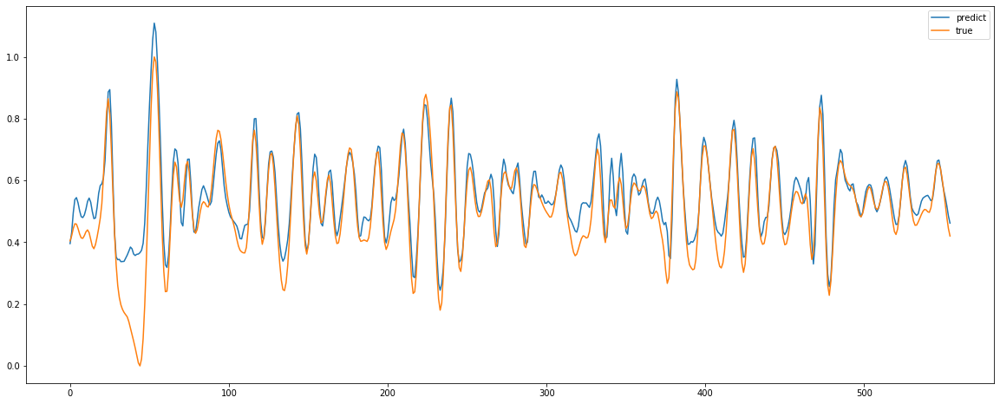

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_183 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_184 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_185 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_54 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_186 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

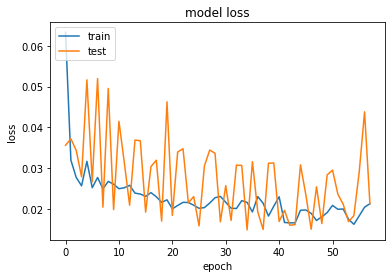

Root mean squared error Train: 0.027
Root mean squared error Test: 0.027


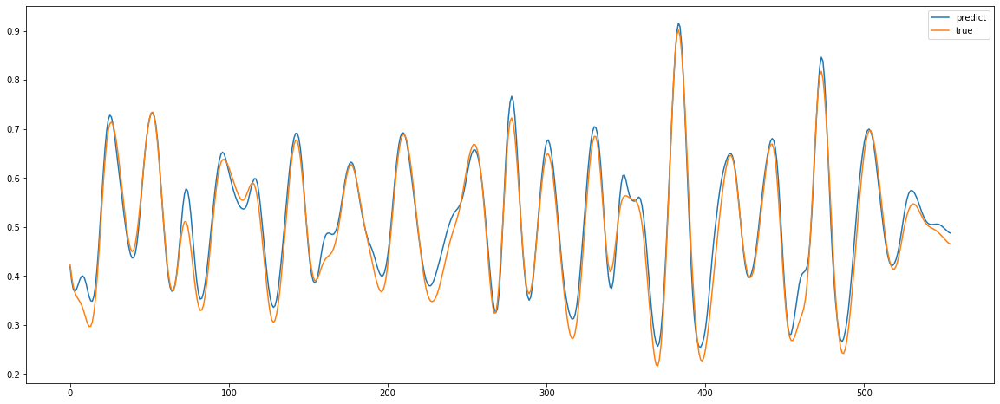

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_187 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_188 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_189 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_55 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_190 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

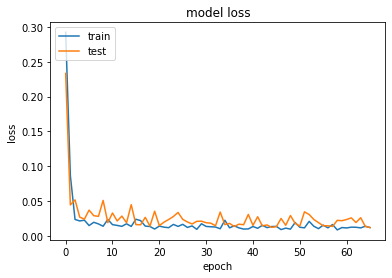

Root mean squared error Train: 0.008
Root mean squared error Test: 0.015


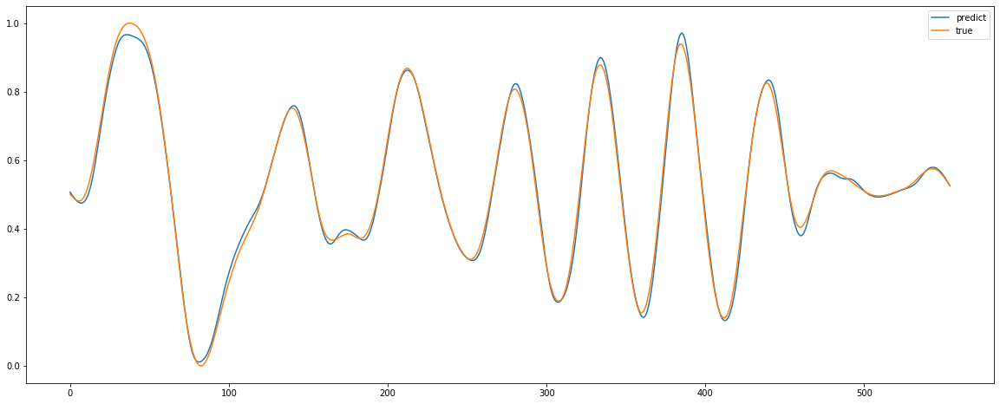

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_191 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_192 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_193 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_56 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_194 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

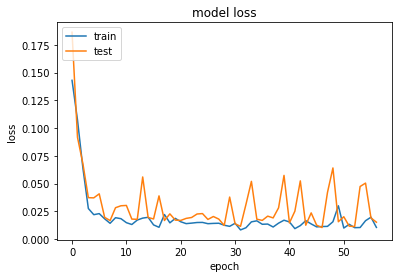

Root mean squared error Train: 0.013
Root mean squared error Test: 0.018


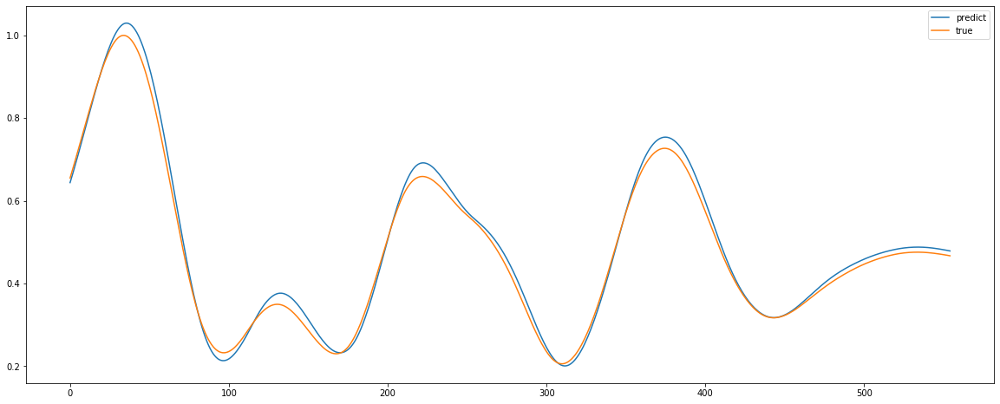

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_195 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_196 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_197 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_57 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_198 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

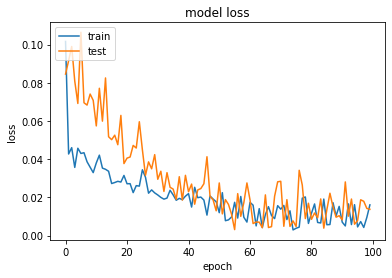

Root mean squared error Train: 0.013
Root mean squared error Test: 0.016


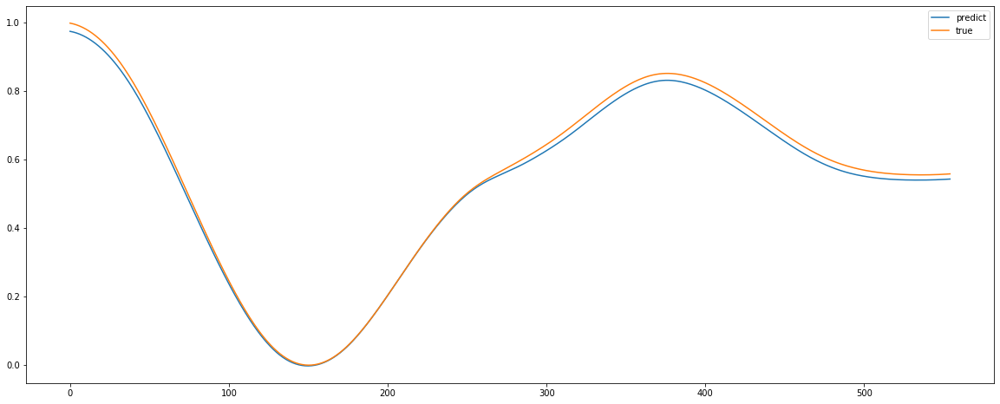

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_38 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_199 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_200 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_201 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_58 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_202 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

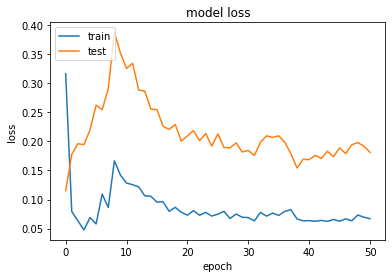

Root mean squared error Train: 0.089
Root mean squared error Test: 0.183


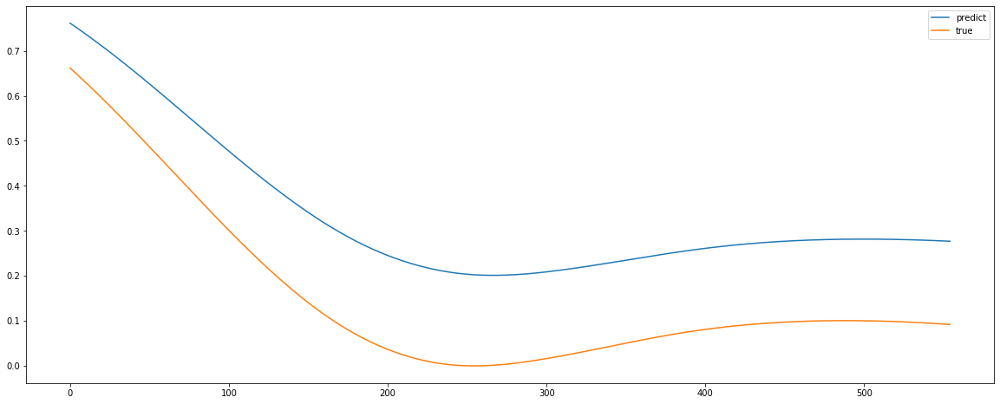

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_203 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_204 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_205 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_59 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_206 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

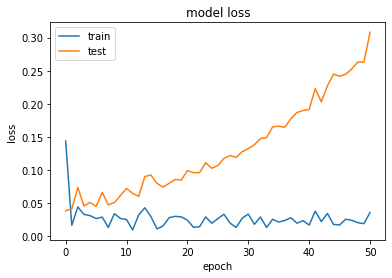

Root mean squared error Train: 0.071
Root mean squared error Test: 0.324


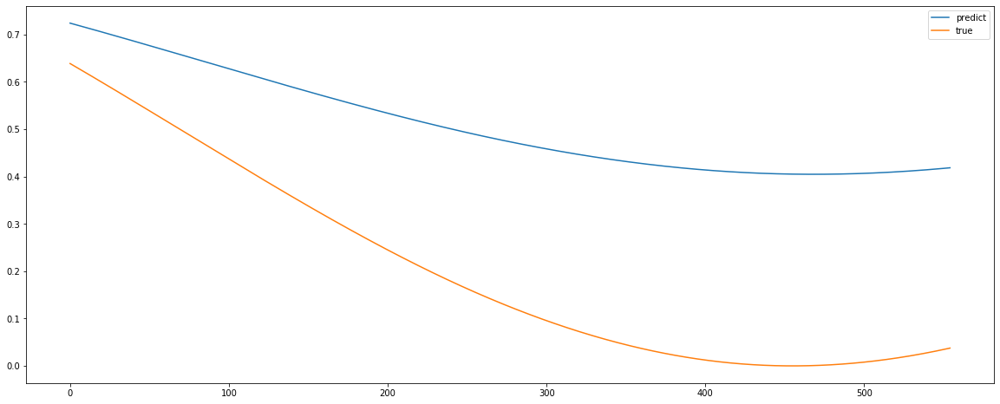

C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(24, input_shape=(1, 24), kernel_initializer="glorot_uniform")`
  if __name__ == '__main__':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  if sys.path[0] == '':
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
C:\Users\kuruparans\AppData\Local\conda\conda\envs\cps\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(1, kernel_initializer="glorot_uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        (None, 1, 24)             0         
_________________________________________________________________
dense_207 (Dense)            (None, 1, 24)             600       
_________________________________________________________________
dense_208 (Dense)            (None, 1, 12)             300       
_________________________________________________________________
dense_209 (Dense)            (None, 1, 12)             156       
_________________________________________________________________
flatten_60 (Flatten)         (None, 12)                0         
_________________________________________________________________
dense_210 (Dense)            (None, 1)                 13        
Total params: 1,069
Trainable params: 1,069
Non-trainable params: 0
_________________________________________________________________
None
dic

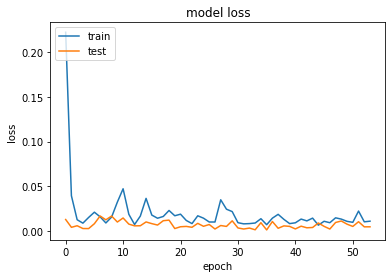

Root mean squared error Train: 0.038
Root mean squared error Test: 0.005


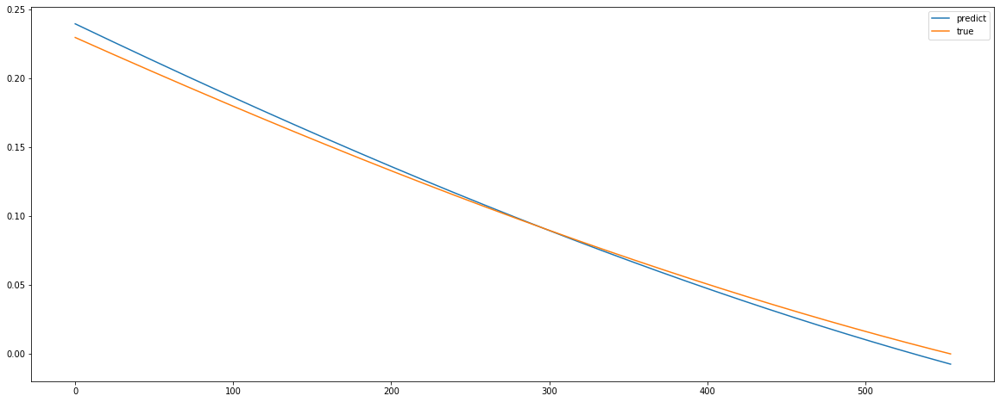

Variance : 0.345
Mean absolute error Train: 120628.019
Mean absolute error Test: 163549.681
Root mean squared error Train: 152368.084
Root mean squared error Test: 194693.104


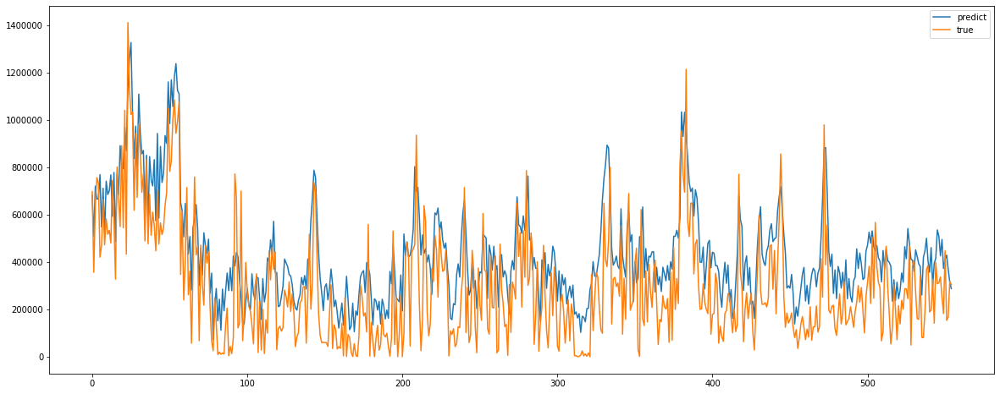

In [47]:

from keras.layers import Dense, Activation, Dropout
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import LSTM, GRU, SimpleRNN,Bidirectional,TimeDistributed,ConvLSTM2D
def mlpmodel(trainX,textX,trainY,testY):
    trainX1= np.reshape(trainX, (trainX.shape[0], 1,24))
    testX1 = np.reshape(testX, (testX.shape[0], 1,24))
    X_input = Input(shape=(trainX.shape[1], trainX.shape[2]))

    layer=Dense(24,init='glorot_uniform', input_shape=(trainX1.shape[1], trainX1.shape[2]))(X_input)
    layer.trainable=True

    layer2=Dense(12,init='glorot_uniform')(layer)
    layer2.trainable=True

    layer3=Dense(12,init='glorot_uniform')(layer2)
    layer3.trainable=True

    #model.add(res)
    flat=Flatten()(layer3)
    layer4=Dense(1,init='glorot_uniform')(flat)
    layer4.trainable=True
    #model.add(layer4)
    model = Model(inputs=X_input, outputs=layer4)
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX1, trainY, epochs=300, batch_size=50, validation_data=(testX1, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX1)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX1)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(mlpmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [48]:
def grumodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(GRU(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_211 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


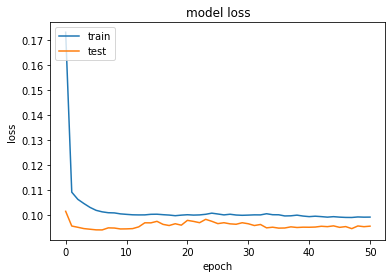

Root mean squared error Train: 0.128
Root mean squared error Test: 0.121


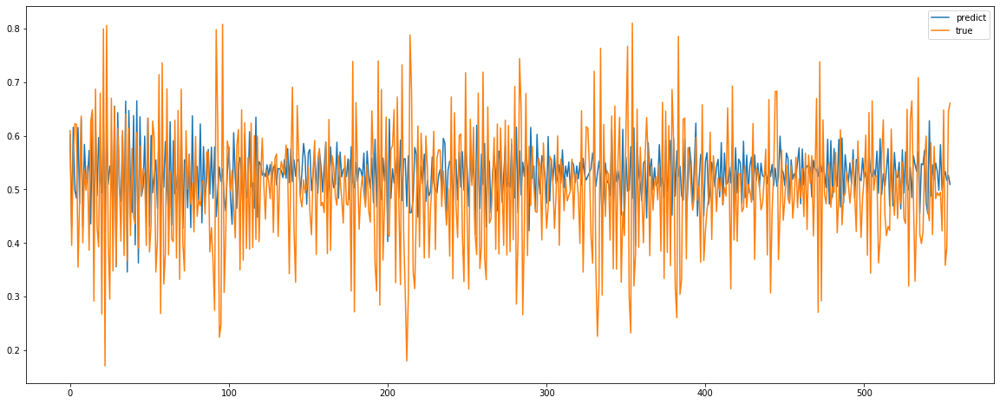

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_212 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


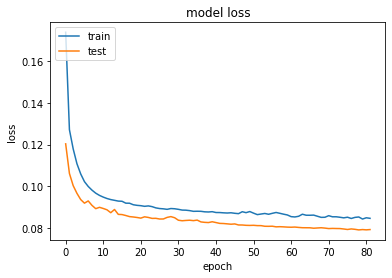

Root mean squared error Train: 0.111
Root mean squared error Test: 0.107


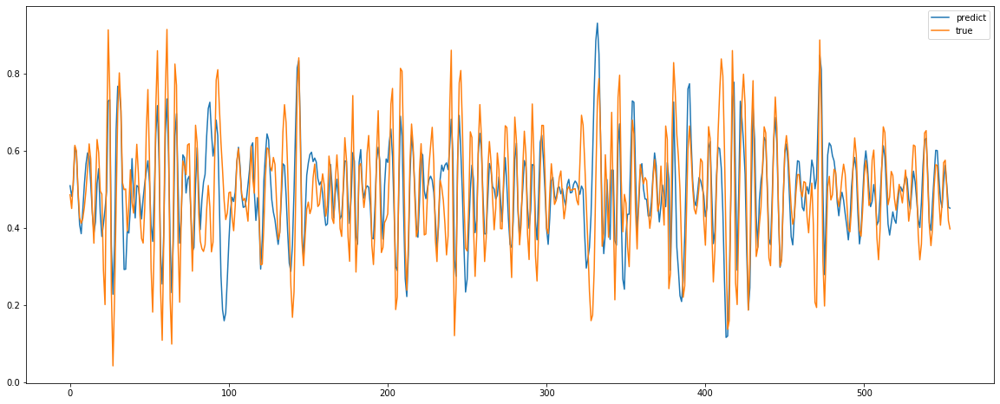

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_3 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_213 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


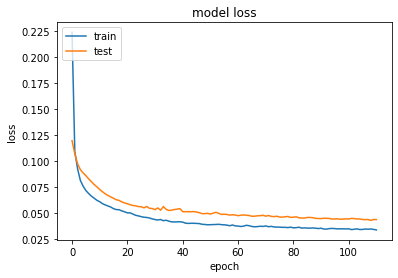

Root mean squared error Train: 0.041
Root mean squared error Test: 0.068


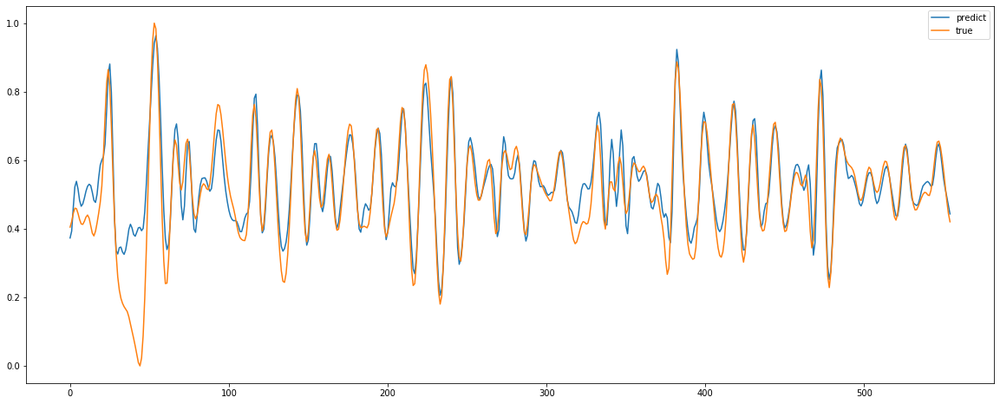

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_4 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_214 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


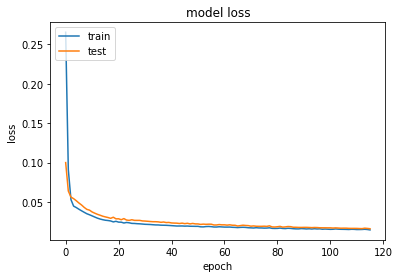

Root mean squared error Train: 0.017
Root mean squared error Test: 0.020


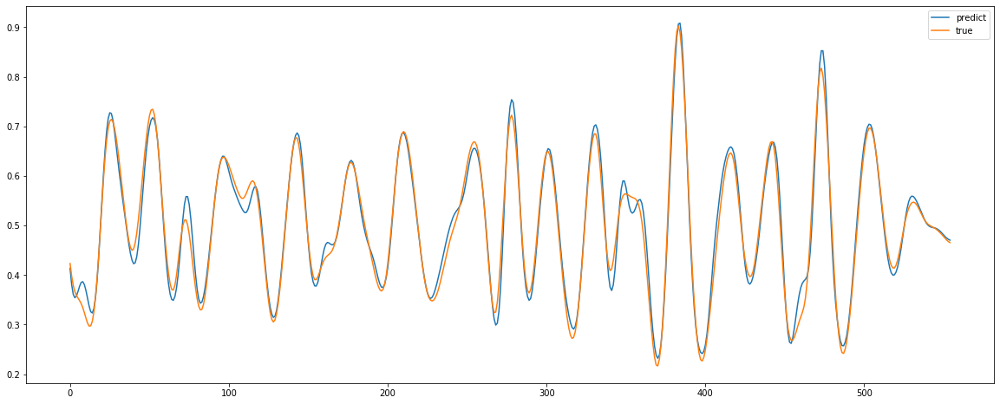

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_5 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_215 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


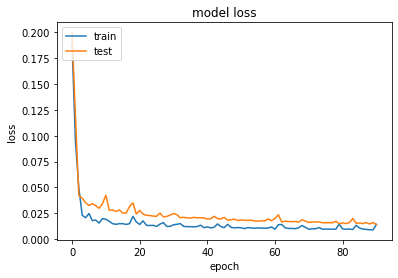

Root mean squared error Train: 0.012
Root mean squared error Test: 0.018


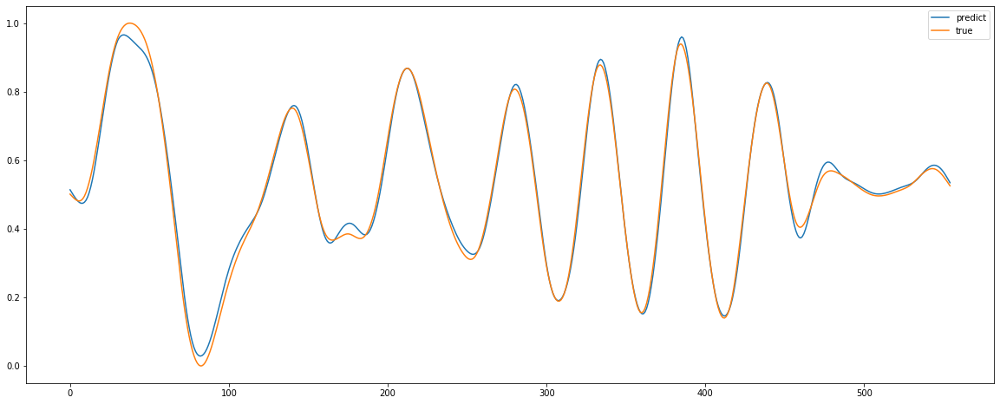

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_6 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_216 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


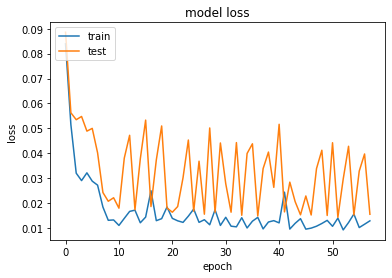

Root mean squared error Train: 0.014
Root mean squared error Test: 0.019


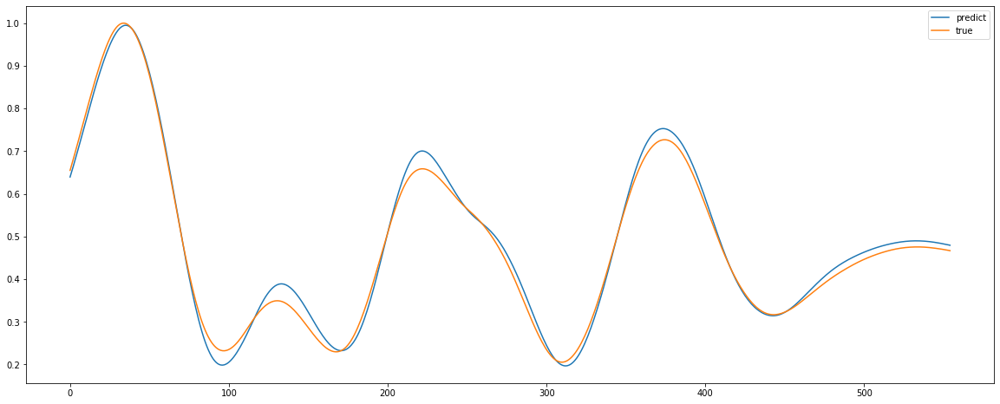

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_7 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_217 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


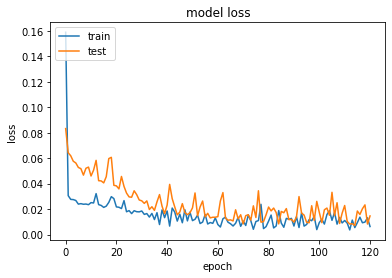

Root mean squared error Train: 0.010
Root mean squared error Test: 0.017


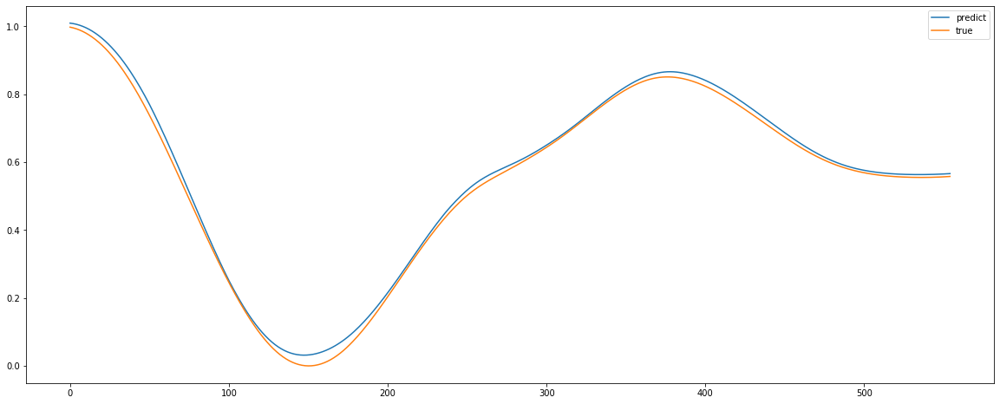

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_8 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_218 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


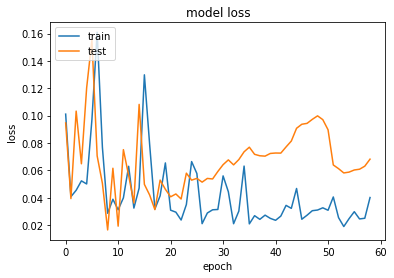

Root mean squared error Train: 0.083
Root mean squared error Test: 0.077


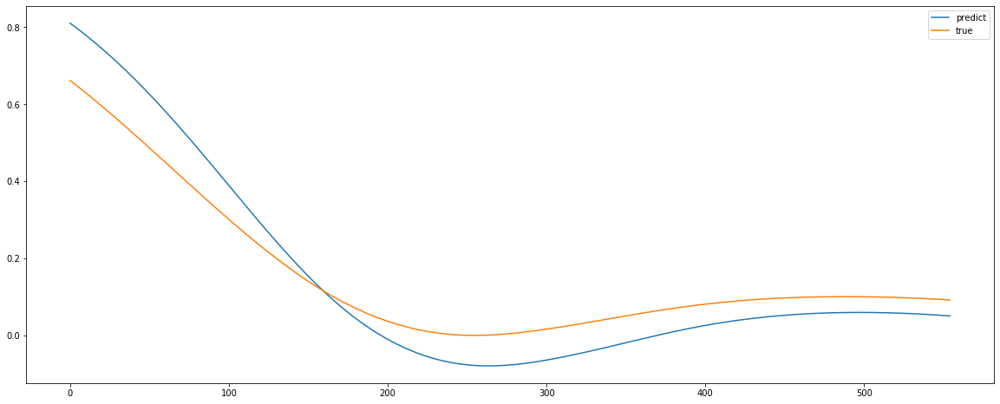

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_9 (GRU)                  (None, 24)                3528      
_________________________________________________________________
dense_219 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


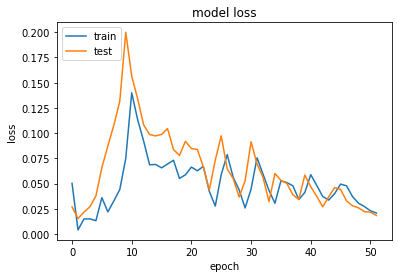

Root mean squared error Train: 0.026
Root mean squared error Test: 0.023


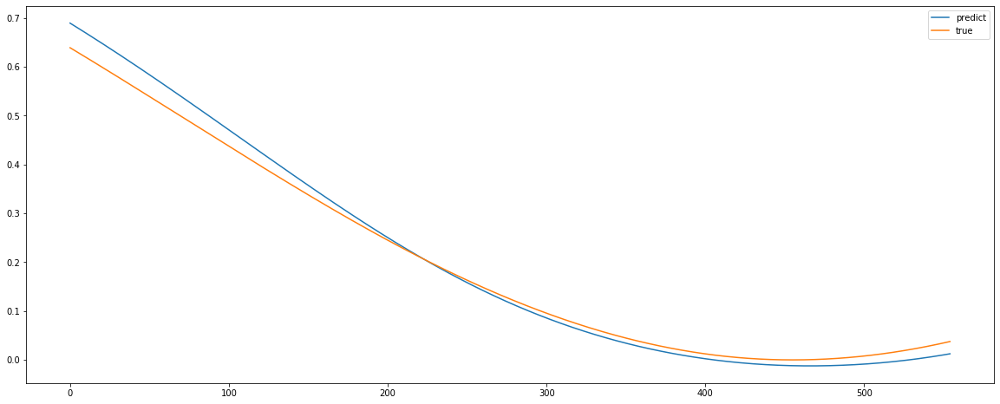

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_10 (GRU)                 (None, 24)                3528      
_________________________________________________________________
dense_220 (Dense)            (None, 1)                 25        
Total params: 3,553
Trainable params: 3,553
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


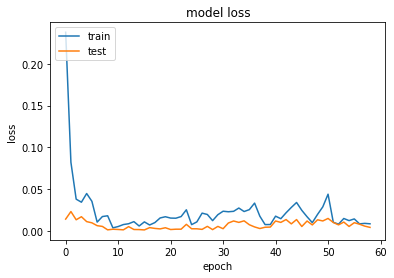

Root mean squared error Train: 0.019
Root mean squared error Test: 0.005


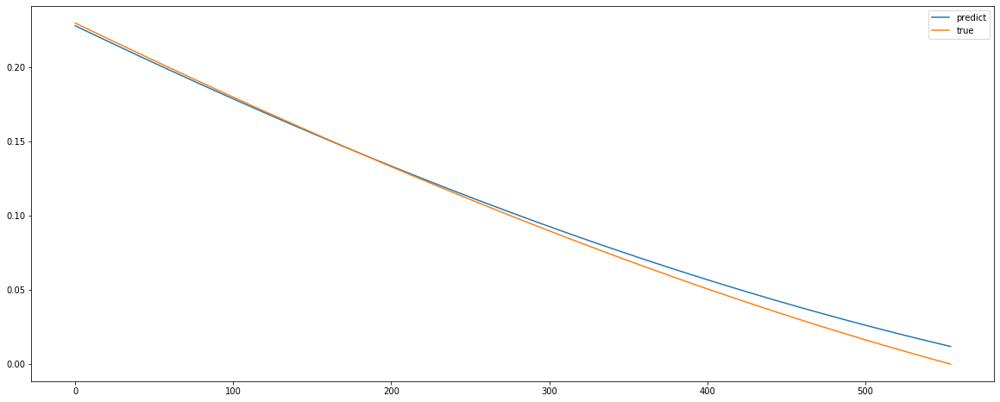

In [49]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(grumodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

Variance : 0.629
Mean absolute error Train: 121506.118
Mean absolute error Test: 115430.376
Root mean squared error Train: 152894.213
Root mean squared error Test: 146507.861


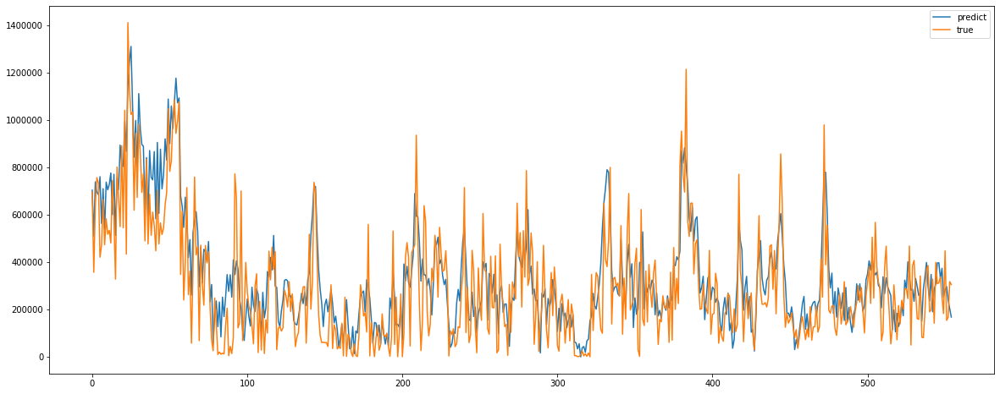

In [50]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [51]:
def rnnmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(SimpleRNN(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (None, 24)                1176      
_________________________________________________________________
dense_221 (Dense)            (None, 1)                 25        
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


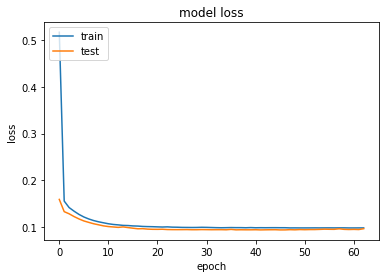

Root mean squared error Train: 0.128
Root mean squared error Test: 0.123


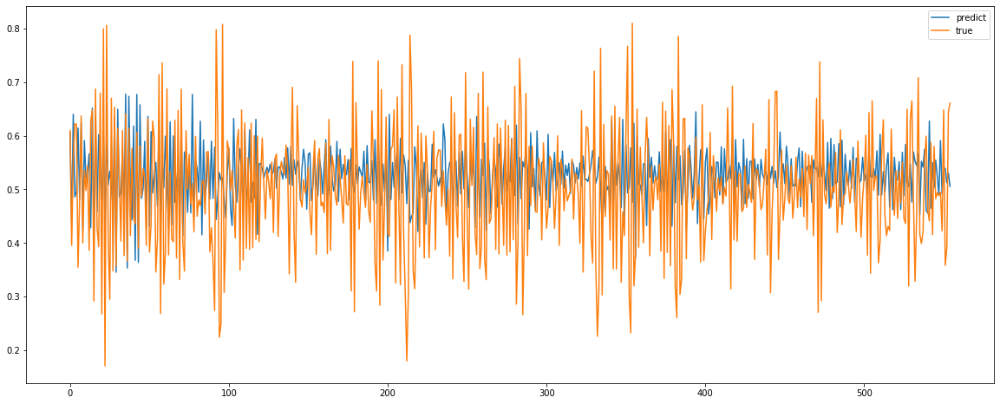

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_2 (SimpleRNN)     (None, 24)                1176      
_________________________________________________________________
dense_222 (Dense)            (None, 1)                 25        
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


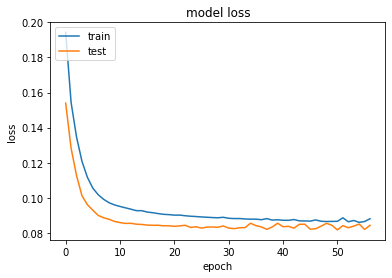

Root mean squared error Train: 0.118
Root mean squared error Test: 0.113


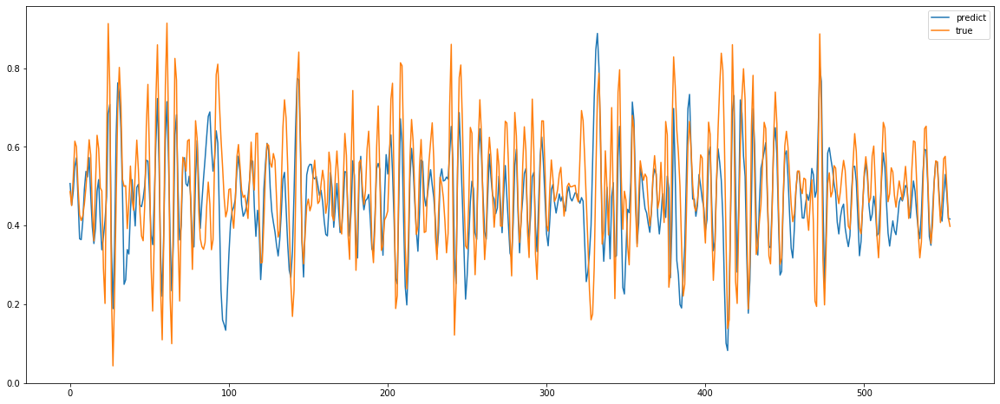

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (None, 24)                1176      
_________________________________________________________________
dense_223 (Dense)            (None, 1)                 25        
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


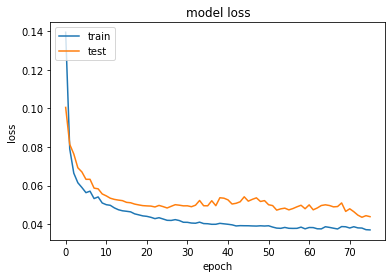

Root mean squared error Train: 0.043
Root mean squared error Test: 0.066


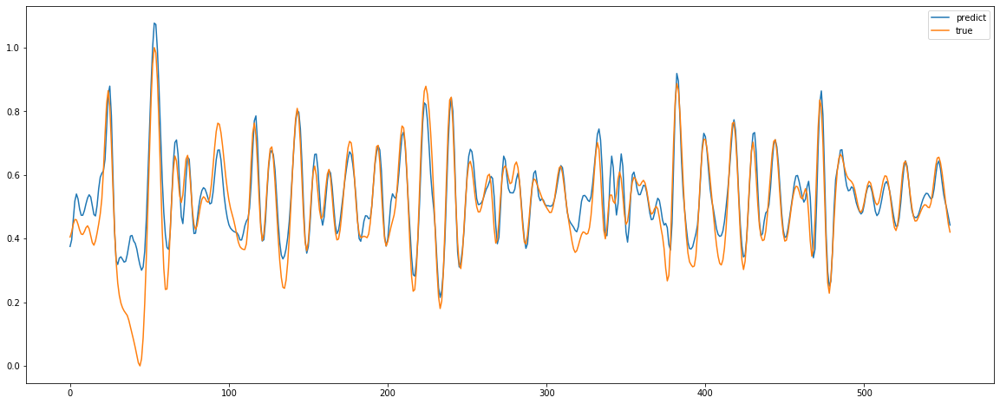

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (None, 24)                1176      
_________________________________________________________________
dense_224 (Dense)            (None, 1)                 25        
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


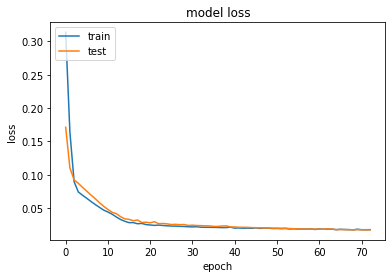

Root mean squared error Train: 0.019
Root mean squared error Test: 0.022


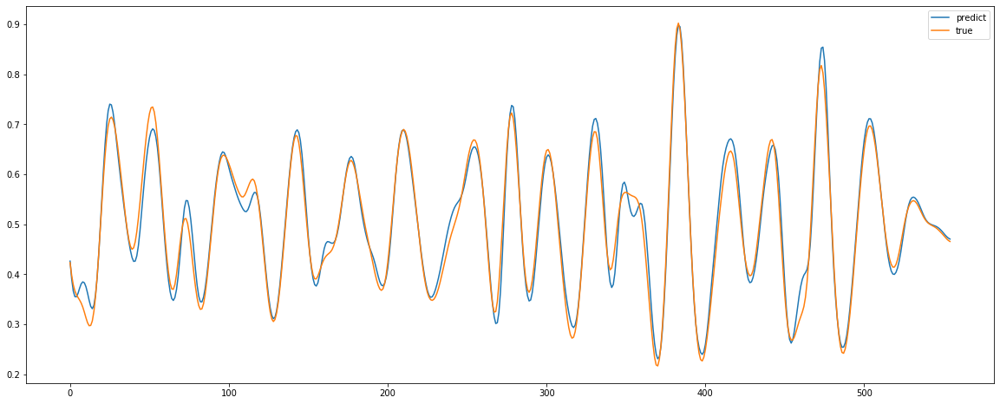

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_5 (SimpleRNN)     (None, 24)                1176      
_________________________________________________________________
dense_225 (Dense)            (None, 1)                 25        
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None
dict_keys(['val_loss', 'loss'])


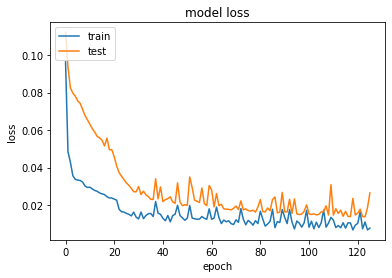

Root mean squared error Train: 0.020
Root mean squared error Test: 0.034


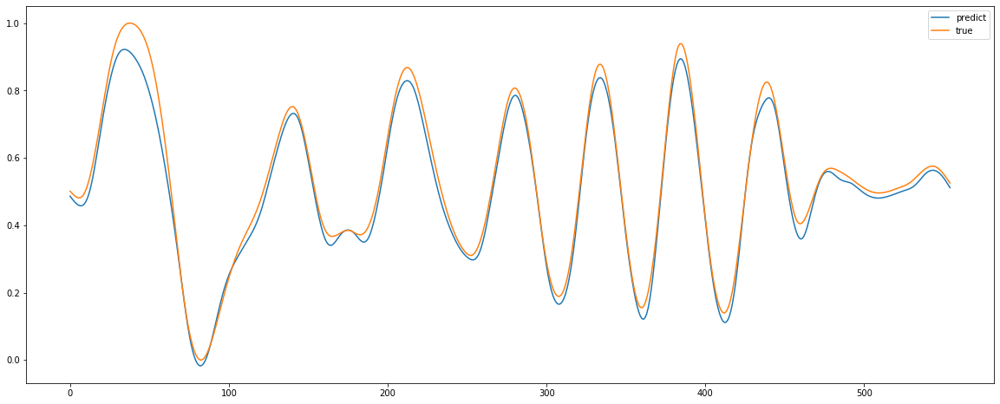

In [ ]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(rnnmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

In [ ]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [ ]:
#RMSE as loss function

In [ ]:
def rnnmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(SimpleRNN(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    def root_mean_squared_error(y_true, y_pred):
            return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)

def grumodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(GRU(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    def root_mean_squared_error(y_true, y_pred):
            return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)

def lstmmodel(trainX,textX,trainY,testY):
    model = Sequential()
    model.add(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(Dense(1))
    def root_mean_squared_error(y_true, y_pred):
            return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
    history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
    print(model.summary())
    # list all data in history
    print(history.history.keys())
    import matplotlib.pyplot as plt

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    yhat_train = model.predict(trainX)
    print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
    yhat = model.predict(testX)
    print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
    ''' Plotting the first 2180 entries to see prediction '''
    pyplot.figure(figsize=(20,8))
    pyplot.plot(yhat[:2180], label='predict')
    pyplot.plot(testY[:2180], label='true')
    pyplot.legend()
    pyplot.show()
    return np.array(yhat_train),np.array(yhat)



In [ ]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(lstmmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

In [ ]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [ ]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(grumodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

In [ ]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [ ]:
look_back=24
maxIMF,minIMF=0,0
scaled_data=[]
numIMF=len(imfs)
scaledIMF=[]
w,d , h = 24,numIMF, totalsize;
#scaledIMF_X = [[[10 for z in range(d)] for x in range(w)] for y in range(h)] 
#scaledIMF_X=np.array(scaledIMF_X)
yhat_train_final=[]
testY_pr=[]
trainY_pr=[]
cm,gm=[],[]
yhat_final=[]

windowsize=look_back
scaledIMF_X= [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#trainIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]
#trainIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_Y = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

#testIMF_X = [ [[None for i in range(d) ] for i in range(w) ] for j in range(h) ]

for kk in range(0,numIMF):
    yhat_train1=[]
    yhat1=[]
    
    data,maxIMF,minIMF= scale(imfs[kk])
    scaled_data.append([data])
    scaledIMF=np.array(scaled_data)
    dataframe['windspd']=data
    dataset = dataframe.values
    for ii in range(0,totalsize):
       
        for jj in range(0,windowsize):
 
            scaledIMF_X[ii][jj][kk]=scaledIMF[kk,0,ii+jj-1]
            #print(scaledIMF_X)
    
    trainIMF_X = np.array(scaledIMF_X)[0:trainsize,:,kk]
    trainIMF_Y = np.array(scaledIMF)[kk,0,samplesize:trainsize+samplesize]

    testIMF_X = np.array(scaledIMF_X)[trainsize:trainsize+testsize,:,kk]
    testIMF_Y = np.array(scaledIMF)[kk,0,trainsize+samplesize:trainsize+samplesize+testsize]
    
    trainX = np.reshape(trainIMF_X, (trainIMF_X.shape[0], 1, trainIMF_X.shape[1]))
    testX = np.reshape(testIMF_X , (testIMF_X .shape[0], 1, testIMF_X .shape[1]))
    

    cm,gm=(rnnmodel( trainX,testX,trainIMF_Y  ,testIMF_Y ))
    cm=np.array(cm)
    gm=np.array(gm)
    cm1=[x*(maxIMF-minIMF)+minIMF for x in cm]
    gm1=[x*(maxIMF-minIMF)+minIMF for x in gm]
    testY_pr.append([gm1])
    trainY_pr.append([cm1])

#working one

In [ ]:
ff=np.array( testY_pr)[:,0][:,:]
ff_train=np.array(trainY_pr)[:,0][:,:]
trainY_pred=np.sum(ff_train, axis = 0)
testY_pred=np.sum(ff, axis = 0)
trainY_pred = trainY_pred*scalesize+minvalue;

trainY_pred=[0 if x < 0 else x for x in trainY_pred]
testY_pred = testY_pred*scalesize+minvalue;
testY_pred=[0 if x < 0 else x for x in testY_pred]

trainY_act = DATA[samplesize:trainsize+samplesize]
testY_act = DATA[trainsize+samplesize:trainsize+samplesize+testsize]
trainY_act = trainY_act*scalesize+minvalue
testY_act = testY_act*scalesize+minvalue

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
print('Variance : %.3f' % r2_score(testY_act,testY_pred))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY_act,trainY_pred))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY_act,testY_pred))

print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY_act,trainY_pred)))
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY_act, testY_pred)))

pyplot.figure(figsize=(20,8))
x_data = list(range(testsize))

pyplot.plot(x_data,(testY_pred)[:2180], label='predict')
pyplot.plot(x_data,testY_act[:2180], label='true')
pyplot.legend()
pyplot.show()

In [ ]:
##endddd

In [ ]:
#enddd

In [ ]:
#changing loss funtion to RMSE 

In [ ]:
from keras import backend as K

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 
model = Sequential()
model.add(LSTM(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=1, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
print(model.summary())
print(history.history.keys())
import matplotlib.pyplot as plt

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

yhat_train = model.predict(trainX)
print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
yhat = model.predict(testX)
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
pyplot.figure(figsize=(20,8))
pyplot.plot(yhat[:2180], label='predict')
pyplot.plot(testY[:2180], label='true')
pyplot.legend()
pyplot.show()
print('Variance : %.3f' % r2_score(testY, yhat))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY, yhat_train))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY, yhat))

In [ ]:
#GRU Unit

In [ ]:
model = Sequential()
model.add(GRU(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=1, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
print(model.summary())
print(history.history.keys())
import matplotlib.pyplot as plt

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
yhat_train = model.predict(trainX)
print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
yhat = model.predict(testX)
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
pyplot.figure(figsize=(20,8))
pyplot.plot(yhat[:2180], label='predict')
pyplot.plot(testY[:2180], label='true')
pyplot.legend()
pyplot.show()
print('Variance : %.3f' % r2_score(testY, yhat))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY, yhat_train))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY, yhat))


In [ ]:
from keras import backend as K

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 
model = Sequential()
model.add(GRU(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=1, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
print(model.summary())
print(history.history.keys())
import matplotlib.pyplot as plt

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


In [ ]:
yhat_train = model.predict(trainX)
print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
yhat = model.predict(testX)
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
pyplot.figure(figsize=(20,8))
pyplot.plot(yhat[:2180], label='predict')
pyplot.plot(testY[:2180], label='true')
pyplot.legend()
pyplot.show()
print('Variance : %.3f' % r2_score(testY, yhat))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY, yhat_train))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY, yhat))

In [ ]:
#Simple RNN Unit

In [ ]:
model = Sequential()
model.add(SimpleRNN(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
print(model.summary())
# list all data in history
print(history.history.keys())
import matplotlib.pyplot as plt

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
yhat_train = model.predict(trainX)
print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
yhat = model.predict(testX)
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
pyplot.figure(figsize=(20,8))
pyplot.plot(yhat[:2180], label='predict')
pyplot.plot(testY[:2180], label='true')
pyplot.legend()
pyplot.show()
print('Variance : %.3f' % r2_score(testY, yhat))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY, yhat_train))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY, yhat))

In [ ]:
from keras import backend as K

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 
model = Sequential()
model.add(SimpleRNN(look_back, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(optimizer = "rmsprop", loss = root_mean_squared_error, 
              metrics =["accuracy"])
history = model.fit(trainX, trainY, epochs=300, batch_size=50, validation_data=(testX, testY), verbose=0, shuffle=False,callbacks=[EarlyStopping(monitor='val_loss',patience=50, min_delta=0.01)])
print(model.summary())
# list all data in history
print(history.history.keys())
import matplotlib.pyplot as plt

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
yhat_train = model.predict(trainX)
print("Root mean squared error Train: %.3f" % sqrt(mean_squared_error(trainY, yhat_train)))
yhat = model.predict(testX)
print("Root mean squared error Test: %.3f" % sqrt(mean_squared_error(testY, yhat)))
pyplot.figure(figsize=(20,8))
pyplot.plot(yhat[:2180], label='predict')
pyplot.plot(testY[:2180], label='true')
pyplot.legend()
pyplot.show()
print('Variance : %.3f' % r2_score(testY, yhat))
print("Mean absolute error Train: %.3f" % mean_absolute_error(trainY, yhat_train))
print("Mean absolute error Test: %.3f" % mean_absolute_error(testY, yhat))